In [1]:
import math
from matplotlib.lines import Line2D
import matplotlib.pyplot as plt
from matplotlib.ticker import PercentFormatter
import numpy as np
import pandas as pd
import re
import seaborn as sns
import statsmodels.api as sm
from sklearn.linear_model import LinearRegression
# from sklearn.feature_selection import SequentialFeatureSelector  # Alternative option
from mlxtend.feature_selection import SequentialFeatureSelector as SFS

pd.set_option("display.max_colwidth", None)  # Set maximum column width
pd.set_option("display.max_columns", None)  # Set maximum number of columns displayed
pd.set_option("display.width", 300)  # Set width for entire output
from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [2]:
#### Notes
# We process the following datasets:
# * ZIP_Locale_Detail.tsv
# * CAASPP entities
# * CAASPP
# * CA_Schl_Table_EthPct.tsv provides LCFF+ indicator
# * UC Admissions "FR Eth by Yr"                      https://www.universityofcalifornia.edu/about-us/information-center/admissions-source-school
# * UC Admissions "FR GPA by Yr"                      https://www.universityofcalifornia.edu/about-us/information-center/admissions-source-school
# We only utilize data about California public schools, including charter schools.

# UC Admissions data is indexed by high school name. Each school has a numeric ID, but the IDs differ from the CAASPP IDs.
# Several high schools in the state have the same name. There are even a few duplicate school names in the same county.
# UC Admissions data also includes City and County but not district.
# CAASPP data is indexed by high school name. CAASPP data also includes County, District, and ZIP Code, but not City. We look up City from ZIP using a USPS table.

testID2Name = {
    "1": "English (ELA)",
    "2": "Math"
}

campuses     = ["Berkeley", "UC Davis", "UCI",    "UCLA",        "UC Merced", "UCR",       "UCSB",          "UCSC",       "UCSD"]
homeCounties = ["Alameda",  "Yolo",     "Orange", "Los Angeles", "Merced",    "Riverside", "Santa Barbara", "Santa Cruz", "San Diego"]
campusesSoCal     = ["UCI",    "UCLA",        "UCR",       "UCSB",          "UCSD"]
homeCountiesSoCal = ["Orange", "Los Angeles", "Riverside", "Santa Barbara", "San Diego"]

# UC admissions data is censored: if fewer than 3 students enroll, the value is set to 0. So when analyzing Enrollment,
# we have to filter out schools where fewer than 3 students are expected to enroll. This depends on the yield of the campus.
# Here are the yields by campus with minAdms = 10. The first column is for local LCFF+ schools, the second for remote LCFF+ schools:
# Berkeley    65.3%        37.4%
# UC Davis    30.2%        15.6%
# UCI         48.5%        24.1%
# UCLA        65.5%        63.8%
# UC Merced   22.2%         5.6%
# UCR         25.2%         7.4%
# UCSB        17.6%         7.1%
# UCSC         9.6%         4.9%
# UCSD        48.3%        20.5%
# Set minAdms to about 5 / yield from the first column above.
minAdmsForEnrAnalysis = {
    "Berkeley": 10,
    "UC Davis": 20,
    "UCI": 15,
    "UCLA": 10,
    "UC Merced": 25,
    "UCR": 20,
    "UCSB": 25,
    "UCSC": 30,
    "UCSD": 15
}

In [3]:
#### Read the ZIP code data to be able to map ZIP code to City.
# The PHYSICAL CITY column indicates the city name. It is blank for a handful records: Pandas converts these to NaN. PHYSICAL STATE is blank for the same records.
# The LOCALE NAME often indicates the neighborhood name within the city such as "CARMEL MOUNTAIN", "LA JOLLA". It contains other text such as "ANNEX" that we clean.
# Sometimes the LOCALE indicates a stree location rather than a neighborhood. 
filename = "../ZIP_Locale_Detail.tsv"
keepColumns = ["DELIVERY ZIPCODE", "LOCALE NAME", "PHYSICAL CITY", "PHYSICAL STATE"]
dfZIPs = pd.read_csv(filename, delimiter="\t", dtype=str, usecols=keepColumns)
zip2CityDict = {}
zip2City = {}
zip2State = {}
for index, row in dfZIPs.iterrows():
    city = row["PHYSICAL CITY"]
    locale = row["LOCALE NAME"]
    zip = row["DELIVERY ZIPCODE"]
    if city != city:  # NaN
        print(zip, locale, city, row["PHYSICAL CITY"])
        continue

    # Clean the locale
    locale = re.sub(r"  +", " ", locale)
    locale = re.sub(r"\bHGTS\b", "HEIGHTS", locale)
    locale = re.sub(r"^(?:AIRPORT|CPU|DOWNTOWN|FEDERAL(?: BUILDING)?|MAIN OFFICE|VPO) ", "", locale)
    locale = re.sub(r" [A-Z]{2}(?: .*)? S\&?DC$", "", locale)  # E.g. "SANTA ANA CA NORTH GRAND SDC"
    locale = re.sub(r"(?: \d+)? CARRIERS(?: \d+)?$", "", locale)  # E.g. "NORTHRIDGE CARRIERS 24", "CARMEL VALLEY 21 CARRIERS"
    locale = re.sub(r"(?: CARRIERS?)? (?:ANNEX|ANX|CPLX)(?: .*)?$", "", locale)  # E.g. "CARMEL VALLEY CARRIER ANNEX", "MOUNTAIN VIEW CARRIERS ANNEX", "NAPOLEON STREET CARRIER CPLX", "LA JOLLA ANNEX UC"
    locale = re.sub(r" (?:POSTAL|RETAIL|STAMP) STORE$", "", locale)  # E.g. "CARMEL MOUNTAIN POSTAL STORE", "MACYS RETAIL STORE"
    locale = re.sub(r" FIN(?:ANCE)?(?: (?:STA|STATION|UNIT))?$", "", locale)  # E.g. "PARK MANOR FINANCE"
    locale = re.sub(r" (?:DPOBU|PRS)$", "", locale)  # E.g. "BIG BEAR LAKE DPOBU"
            
    if locale == "" or locale == city:
        pass
    elif re.search(r"\b(?:AIRPORT|AVENUE|BANK|BRANCH|CENTER|CTR|DRUGS|HOSPITAL|HWY|MALL|MARKET|MARKETPLACE|MKT|PLAZA|SERVICE|STA|STATION|STORE|STREET|THE|UNIV|[A-Z]|\d+|\#[0-9A-Z]+)\b", locale):  # E.g. "NAPOLEON STREET CARRIER CPLX"
        pass
    elif re.search(city, locale):  # E.g. "WASHINGTON LOS ANGELES"
        pass
    else:
        if zip not in zip2CityDict:
            zip2CityDict[zip] = {}
        zip2CityDict[zip][locale] = 1

    zip2City[zip] = city
    zip2State[zip] = row["PHYSICAL STATE"]

for zip in zip2CityDict:
    sCity = "/".join(zip2CityDict[zip].keys())
    zip2City[zip] = "/".join([sCity, zip2City[zip]])
    if len(zip2CityDict[zip]) > 1 and zip2State[zip] == "CA":
        print(zip2City[zip])
            
# Add ZIP codes not available in the USPS file
zip2City["90010"] = "LOS ANGELES"
zip2City["90227"] = "unknown"
zip2City["90747"] = "CARSON"
zip2City["91719"] = "unknown"
zip2City["92093"] = "LA JOLLA"
zip2City["92415"] = "SAN BERNARDINO"
zip2City["93740"] = "FRESNO"
zip2City["93741"] = "FRESNO"
zip2City["95057"] = "unknown"
zip2City["95331"] = "unknown"
zip2City["96311"] = "Fleet Post Office AP"
print(len(zip2City))

32304 WESTSIDE nan nan
32305 WESTSIDE nan nan
32310 WESTSIDE nan nan
32316 WESTSIDE nan nan
ALAMEDA/ARCADE/LOS ANGELES
BARRINGTON/VILLAGE/LOS ANGELES
LINCOLN/LINCOLN HEIGHTS/LOS ANGELES
EL SERENO/LINCOLN HEIGHTS/LOS ANGELES
BICENTENNIAL/MIRACLE MILE/LOS ANGELES
EAGLE ROCK/HIGHLAND PARK/LOS ANGELES
LA TIJERA/WESTVERN/LOS ANGELES
ARCO/BUNKER HILL/FOY/LOS ANGELES
HUB CITY/WILLOWBROOK/COMPTON
FIRESTONE/HOLLYDALE/SOUTH GATE
BELMONT SHORE/LOMA/LONG BEACH
BIXBY/NORTH/LONG BEACH
SPRING/VIKING/LONG BEACH
BRYANT/SPRING/LONG BEACH
NORTHRIDGE/RANCH/PORTER RANCH
ROMOLAND/SUN CITY/MENIFEE
QUAIL VALLEY/SUN CITY/MENIFEE
PLAYA/SOUTH LAGUNA/LAGUNA BEACH
BOLSA/GOLDENWEST/WESTMINSTER
BRISTOL/SOUTH MAIN/SANTA ANA
DOYLE COLONY/POPLAR/PORTERVILLE
PINEDALE/WOODWARD PARK/FRESNO
BARTON/CEDAR/FRESNO
CHESTNUT/LINDEN/SOUTH SAN FRANCISCO
GEARY/MENDELL/SAN FRANCISCO
BAYVIEW/STANTON/BURLINGAME
MARINA/PRESIDIO/SAN FRANCISCO
TOWNSEND/ISLAND COVE/SAN FRANCISCO
MCLAREN/VISITACION/SAN FRANCISCO
MARINA/MARINA GREEN/SAN FRA

In [4]:
#### dfEntities
# Read the CAASPP entities data. This mostly gives us the mapping of county code to county name.
# Read the file. "latin1" (ISO-8859-1) is needed due to Spanish characters in the names of 3 schools.
filename = "CAASPP/sb_ca2024entities_csv.txt"
allEntitiesColumns = ["County Code", "District Code", "School Code", "Type ID", "Filler", "Test Year",
                      "County Name", "District Name", "School Name", "Zip Code"]
keepEntitiesColumns = ["County Code", "District Code", "School Code", "Type ID",
                       "County Name", "District Name", "School Name", "Zip Code"]
dfEntities = pd.read_csv(filename, delimiter="^", dtype=str, encoding="latin1", usecols=keepEntitiesColumns)
dfEntities["School Name"] = dfEntities["School Name"].str.strip()  # Trim whitespace

entitiesCounties = dfEntities["County Name"].value_counts()  # Count of county names in dataset

code2County = {}
for index, row in dfEntities.iterrows():
    code = row["County Code"]
    name = row["County Name"]
    if code in code2County:
        if code2County[code] != name:
            print("Error")
    else:
        code2County[code] = name

code2City = {}
code2ZIP = {}
for index, row in dfEntities.iterrows():
    code = row["School Code"]
    zip = row["Zip Code"]
    if code == "0000000":
        continue
    if code in code2ZIP:
        if code2ZIP[code] != zip:
            print(code, code2ZIP[code], zip)
    else:
        code2ZIP[code] = zip
        if zip in zip2City:
            code2City[code] = zip2City[zip]
        else:
            print("Unknown ZIP Code:", zip)

In [5]:
#### dfTests 2024
# Read the CAASPP test score data. This includes number of students at the school and test results.
# Fields:
#   "Total Students Enrolled" may be "*", in which case "Total Students Tested" = 0, "Total Students Tested with Scores" = 0, and Percentage values are NaN.
# Dataframes:
#   df: Whole file. Temporary.
#   dfTests: Filter out records for grade != 11, etc.
#   dfRight = dfTests[keepColumns], then add additional columns.
filename = "CAASPP/sb_ca2024_all_csv_v1.txt"
keepColumns = ["County Code", "District Code", "District Name", "School Code", "School Name", "Type ID", "Test Year", "Test Type",
               "Test ID", "Student Group ID", "Grade",
               "Total Students Enrolled", "Total Students Tested", "Total Students Tested with Scores",
               "Mean Scale Score",
               "Percentage Standard Exceeded", "Count Standard Exceeded",
               "Percentage Standard Met", "Count Standard Met",
               "Percentage Standard Met and Above", "Count Standard Met and Above",
               "Percentage Standard Nearly Met", "Count Standard Nearly Met",
               "Percentage Standard Not Met", "Count Standard Not Met",
               "Overall Total"]

# Read the file. "latin1" (ISO-8859-1) is needed due to Spanish characters in the names of 3 schools.
df = pd.read_csv(filename, delimiter="^", dtype=str, encoding="latin1", usecols=keepColumns)
df["School Name"] = df["School Name"].str.strip()  # Trim whitespace. School Name in the CAASPP and CAASPP Entities data is truncated to 50 characters.

dfTests = df[(df["School Code"] != "0000000") & (df["Grade"] == "11") & (df["Student Group ID"] == "1")]  # Keep only high schools. Use "&" operator for Series of booleans.
# df = df.astype({"Total Students Enrolled": "int", "Total Students Tested": "int", "Total Students Tested with Scores": "int"})  # This generates an error due to "Total Students Enrolled" = "*"
df = pd.DataFrame()  # Free the memory of the big dataframe
print(dfTests.shape[0])
print(dfTests)

5428
        County Code District Code                           District Name School Code                             School Name Type ID Test Year Test Type Test ID Student Group ID Grade Total Students Enrolled Total Students Tested Total Students Tested with Scores Mean Scale Score  \
2206             01         10017  Envision Academy for Arts & Technology     0112607  Envision Academy for Arts & Technology       9      2024         B       1                1    11                      50                    48                                47           2517.4   
2373             01         10017  Envision Academy for Arts & Technology     0112607  Envision Academy for Arts & Technology       9      2024         B       2                1    11                      50                    48                                48           2472.5   
4099             01         10017      Alameda County Office of Education     0130401      Alameda County Juvenile Hall/Court       7      2

In [6]:
#### dfTests2025
filename = "CAASPP/sb_ca2025_all_csv_v1.txt"
keepColumns = ["County Code", "District Code", "District Name", "School Code", "School Name", "Type ID", "Test Year", "Test Type",
               "Test ID", "Student Group ID", "Grade",
               "Total Students Enrolled", "Total Students Tested", "Total Students Tested with Scores",
               "Mean Scale Score",
               "Percentage Standard Exceeded", "Count Standard Exceeded",
               "Percentage Standard Met", "Count Standard Met",
               "Percentage Standard Met and Above", "Count Standard Met and Above",
               "Percentage Standard Nearly Met", "Count Standard Nearly Met",
               "Percentage Standard Not Met", "Count Standard Not Met",
               "Overall Total"]

# Read the file. "latin1" (ISO-8859-1) is needed due to Spanish characters in the names of 3 schools.
df = pd.read_csv(filename, delimiter="^", dtype=str, encoding="latin1", usecols=keepColumns)
df["School Name"] = df["School Name"].str.strip()  # Trim whitespace. School Name in the CAASPP and CAASPP Entities data is truncated to 50 characters.

dfTests2025 = df[(df["School Code"] != "0000000") & (df["Grade"] == "11") & (df["Student Group ID"] == "1")]  # Keep only high schools
df = pd.DataFrame()  # Free the memory of the big dataframe
print(dfTests2025.shape[0])

5412


In [7]:
# CAASPP school names that require special treatment
# * Parentheses are automatically treated as a first name unless added as an exception here.
# * "ALTERNATIVE" (65 schools) and "CONTINUATION" (241 schools) are automatically removed unless added as an exception here.
testParens = {
    # ALTERNATIVE that occurs in UC Schools
    # "not in CAASPP": "SANTA CRUZ ALTERNATIVE",  # UCID = 50446
    "VISTA ALTERNATIVE": "VISTA ALTERNATIVE",
    
    # ALTERNATIVE and CONTINUATION that should not be stripped to avoid duplicates within the same county.
    # (Duplicates are rare and may be automatically handled via lookup.psv, so not critical to avoid them here.)
    "ENTERPRISE ALTERNATIVE": "ENTERPRISE ALTERNATIVE",
    "LIVE OAK ALTERNATIVE": "LIVE OAK ALTERNATIVE",
    "MENDOCINO ALTERNATIVE": "MENDOCINO ALTERNATIVE",
    "POMONA ALTERNATIVE": "POMONA ALTERNATIVE",
    "ROUND VALLEY CONTINUATION": "ROUND VALLEY CONTINUATION",
    "SIERRA VISTA HIGH (ALTERNATIVE)": "SIERRA VISTA ALTERNATIVE HIGH",
    "TEMPLE CITY ALTERNATIVE": "TEMPLE CITY ALTERNATIVE",
    
    # Parentheses
    "ATASCADERO CHOICES IN EDUCATION ACADEMY (ACE)":      "ATASCADERO CHOICES IN EDUCATION ACADEMY (ACE)",
    "BURBANK UNIFIED INDEPENDENT LEARNING ACADEMY (BUIL": "BURBANK UNIFIED INDEPENDENT LEARNING ACADEMY (BUILA)",
    "EPIC CHARTER (EXCELLENCE PERFORMANCE INNOVATION CI": "EXCELLENCE PERFORMANCE INNOVATION CITIZENSHIP (EPIC) CHARTER",
    "FIVE KEYS CHARTER (SF SHERIFF'S)":                   "FIVE KEYS CHARTER (SF SHERIFF'S)",
    "FIVE KEYS INDEPENDENCE HS (SF SHERIFF'S)":           "FIVE KEYS INDEPENDENCE HS (SF SHERIFF'S)",
    "HAROLD MCALISTER HIGH (OPPORTUNITY)":                "HAROLD MCALISTER HIGH (OPPORTUNITY)",
    "HUMANITIES AND ARTS (HARTS) ACADEMY OF LOS ANGELES": "HUMANITIES AND ARTS (HARTS) ACADEMY OF LOS ANGELES",
    "JUVENILE HALL (ENDEAVOR/VOYAGER SECONDARY)":         "ENDEAVOR/VOYAGER SECONDARY (JUVENILE HALL)",
    "KEITH B. BRIGHT HIGH (JUVENILE HALL)":               "KEITH B BRIGHT HIGH (JUVENILE HALL)",
    "LAKEPORT ALTERNATIVE (HOME SCHOOL)":                 "LAKEPORT ALTERNATIVE (HOME SCHOOL)",
    "PACIFIC VALLEY (K-12)":                              "PACIFIC VALLEY K-12",
    "S.F. COUNTY OPPORTUNITY (HILLTOP)":                  "SAN FRANCISCO COUNTY OPPORTUNITY - HILLTOP",
    "SOAR HIGH (STUDENTS ON ACADEMIC RISE)":              "STUDENTS ON ACADEMIC RISE (SOAR) HIGH",
    "WALNUTWOOD HIGH (INDEPENDENT STUDY)":                "WALNUTWOOD HIGH (INDEPENDENT STUDY)",
    "WILLIAM J. (PETE) KNIGHT HIGH":                      "WILLIAM J (PETE) KNIGHT",
    "YOSEMITE SCHOOL COMMUNITY DAY (7-12)":               "YOSEMITE SCHOOL COMMUNITY DAY 7-12",
}

In [8]:
# Abbreviations are common in UC names, rare in CAASPP names.
# The below abbreviations are unambiguous, so we can expand and then match vs trying to match raw and expanded names.
abbreviations = {
    "ACD": "ACADEMY",  # Not used in CAASPP
    "ACAD": "ACADEMY",  # Could also mean "ACADEMIES". Not used in CAASPP.
    "ACDM": "ACADEMY",
    "ACDMY": "ACADEMY",  # Not used in CAASPP
    "CHAR": "CHARTER",  # Not used in CAASPP
    "CHARTR": "CHARTER",
    "CHTR": "CHARTER",  # Not used in CAASPP
    "COL": "COLLEG",  # Could be "COLLEGE" or "COLLEGIATE". Not used in CAASPP
    "COLG": "COLLEG",  # Could be "COLLEGE" or "COLLEGIATE". Not used in CAASPP
    "COLL": "COLLEG",  # Could be "COLLEGE" or "COLLEGIATE".
    # "CTR": "?",  # Could be "CENTER" or "CHARTER"
    "CTRL": "CENTRAL",
    "HS": "HIGH SCHOOL",  # Used 3x in CAASPP
    "INST": "INSTITUTE",  # Not used in CAASPP
    "INTERNATIO": "INTERNATIONAL",
    "JR": "JUNIOR",
    "JR.": "JUNIOR",  # Only CAASPP
    "JUNIOR-SENIOR": "JUNIOR SENIOR",
    "JUNIOR/SENIOR": "JUNIOR SENIOR",
    "JR/SR": "JUNIOR SENIOR",
    "JR./SR.": "JUNIOR SENIOR",
    "LDRSHP": "LEADERSHIP",
    "LRN": "LEARNING",
    "LRNG": "LEARNING",  # Not used in CAASPP
    "L.A.": "LOS ANGELES",  # Only CAASPP
    "MATHEMA": "MATH",
    "MATHEMATICS": "MATH",
    "MT": "MOUNT",
    "MT.": "MOUNT",
    "ONE.CHARTER": "ONE CHARTER",  # Only CAASPP
    "PREP": "PREPARATORY",  # Common use vs strictly abbreviation, in CAASPP.
    "SC": "SCHOOL",  # Not used in CAASPP
    "SCH": "SCHOOL",  # Used once in CAASPP
    "SCHL": "SCHOOL",  # Not used in CAASPP
    "SCI": "SCIENCE",  # Not used in CAASPP
    "SF": "SAN FRANCISCO",
    "SIERRA@HOME": "SIERRA AT HOME",  # Only CAASPP
    "SR": "SENIOR",
    "SR.": "SENIOR",  # Only CAASPP
    "S.F.": "SAN FRANCISCO",  # Only CAASPP
    # "TECH": "TECHNOLOGY",  # Could also mean "TECHNICAL", in CAASPP
    "TECHLGY": "TECHNOLOGY",
    "W.E.B.": "W E B",  # Only CAASPP
    "-SENIOR": "SENIOR",  # Only CAASPP
    "&": "AND",
    "@": "-",  # Should be "AT"?
    "@MCATEER": "- MCATEER",
}

In [9]:
#### Formatting
# Hyphens -- Most often, a hyphen surrounded by spaces indicates that a location follows, whereas
# a hyphen not surrounded by whitespace is a hyphenated name, two locations, K-12, etc. This is true in CAASPP and UC data.
# But the use of hyphens and whitespace around hyphens are not consistent. E.g., in CAASPP data:
#     ALLIANCE GERTZ-RESSLER RICHARD MERKIN 6-12 COMPLEX|Los Angeles
#     ALLIANCE LEICHTMAN-LEVINE FAMILY FOUNDATION ENVIRO|Los Angeles
#     ALLIANCE MARINE - INNOVATION AND TECHNOLOGY 6-12 C|Los Angeles
#     ALLIANCE OUCHI-O'DONOVAN 6-12 COMPLEX|Los Angeles
#     OPTIONS FOR YOUTH - DUARTE|Los Angeles
#     OPTIONS FOR YOUTH-ACTON|Los Angeles
#     CHAMPS - CHARTER HIGH OF ARTS-MULTIMEDIA AND PERFORMIN
#     CALIFORNIA PACIFIC CHARTER - SAN DIEGO|San Diego
#     CALIFORNIA PACIFIC CHARTER- LOS ANGELES|Los Angeles
# In UC data:
#     ALLIANCE GERTZ-RESSLER HIGH SCHOOL|Los Angeles
#     ALLIANCE LEICHTMAN-LEVINE ESHS|Los Angeles
#     ALLIANCE MIT 6-12 COMPLEX|Los Angeles
#     ALLIANCE OUCHI-O'DONOVAN 6-12|Los Angeles
#     CONNECTING WATERS - EAST BAY|Stanislaus
#     CONNECTING WATERS-CTRL VALLEY|Stanislaus
#     HIGH TECH HIGH - NORTH COUNTY|San Diego
#     HIGH TECH HIGH LA|Los Angeles

In [10]:
# testSchoolDetails
testSchoolDetails = {}  # Key is ID|SCHOOL|County|CITY|District|ZIP|ExpandedSCHOOL. Value is number of records with this key, typically 2 for Math + ELA.
for index, row in dfTests.iterrows():
    school = row["School Name"].upper()

    # Generate stdSchool, which is tokenized and used to compute expandedSchool.
    if school in testParens:
        stdSchool = testParens[school]
    else:
        stdSchool = re.sub(r", INC$", "", school)
        stdSchool = re.sub(r",", "", stdSchool)  # Remove commas
        stdSchool = re.sub(r"([A-Z]): ", r"\1 - ", stdSchool)  # Remove colon (CAASPP-specific)
        stdSchool = re.sub(r" (?:ALTERNATIVE|CONTINUATION|\(ALTERNATIVE\)|\(CONTINUATION\))$", "", stdSchool)  # Remove trailing ALTERNATIVE|CONTINUATION (CAASPP-specific)
        stdSchool = re.sub(r"^(.*?) \((.*)\)", r"\2 \1", stdSchool)  # Deal with text in parentheses, e.g. "LINCOLN (ABRAHAM) HIGH" -> "ABRAHAM LINCOLN HIGH"
    
    # Expand abbreviations
    tokens = stdSchool.split()
    expandedTokens = []
    expanded = False
    for token in tokens:
        if token in abbreviations:
            expandedTokens.append(abbreviations[token])
            expanded = True
        else:
            noPunctToken = re.sub(r"\.$", "", token)  # Remove periods from abbreviations: not used in UC data
            expandedTokens.append(noPunctToken)
    expandedSchool = " ".join(expandedTokens)

    key = "|".join([row["School Code"], school, code2County[row["County Code"]], code2City[row["School Code"]], row["District Name"], code2ZIP[row["School Code"]], expandedSchool])
    if row["Total Students Enrolled"] == "*":
        nStudents = 0
    else:
        nStudents = int(row["Total Students Enrolled"])
    if key in testSchoolDetails:
        testSchoolDetails[key][0] += 1
        testSchoolDetails[key][1] += nStudents
    else:
        testSchoolDetails[key] = [1, nStudents]

print(len(testSchoolDetails))

2715


In [11]:
# Create testSchools{} and testStdSchools{} structures that will be used for matching. If testID == "multiple", the match will be skipped.
testID2Details = {}
testRawSchool2Details = {}  # Key is school (not expanded and no county)
testSchools = {}            # Key is expandedSchool|county
testSchool2Details = {}     # Key is expandedSchool|county
testStdSchools = {}         # Key is stdSchool|county: drop trailing "SENIOR HIGH SCHOOL" etc. Value is CAASPP school ID or "multiple" if it is not a unique key.
testStdSchool2Details = {}  # Key is stdSchool|county. Value is \n-joined set of testSchoolDetails keys (id, school, county, city, district, zip, expandedSchool).
for key in testSchoolDetails:
    (id, school, county, city, district, zip, expandedSchool) = key.split("|")

    if id in testID2Details:
        print("Duplicate ID")
    else:
        testID2Details[id] = key

    if school in testRawSchool2Details:
        testRawSchool2Details[school] = "multiple"
    else:
        testRawSchool2Details[school] = key
    
    schoolCounty = "|".join([expandedSchool, county])
    if schoolCounty in testSchools:
        testSchools[schoolCounty] = "multiple"
    else:
        testSchools[schoolCounty] = id
        testSchool2Details[schoolCounty] = key

    # Further standardization, starting with expandedSchool
    stdSchool = re.sub(r" SCHOOL$", "", expandedSchool)
    stdSchool = re.sub(r" (?:UNION |(?:JUNIOR )?SENIOR )*(?:HIGH|SECONDARY)$", "", stdSchool)
    stdSchool = re.sub(r"(CHARTER|HIGH|MIDDLE) SCHOOL", r"\1", stdSchool)
    stdSchool = re.sub(r"CENTER|CENTRAL|CHARTER", "CTR", stdSchool)
    stdSchool = re.sub(r"COLLEGE|COLLEGIATE", "COLLEG", stdSchool)
    stdSchool = re.sub(r"TECHNICAL|TECHNOLOGY", "TECH", stdSchool)
    stdSchool = re.sub(r" [1-9K]-12\b", "", stdSchool)  # Delete "K-12" etc.
    stdSchool = re.sub(r" *- *", " ", stdSchool)  # Replace hyphen with a single space
    schoolCounty = "|".join([stdSchool, county])
    if schoolCounty in testStdSchools:
        testStdSchools[schoolCounty] = "multiple"
        testStdSchool2Details[schoolCounty] = "\n".join([testStdSchool2Details[schoolCounty], key])
    else:
        testStdSchools[schoolCounty] = id
        testStdSchool2Details[schoolCounty] = key

print(len(testSchools))
print(len(testStdSchools))

2711
2708


In [12]:
# Find duplicate stdSchool names. Especially look for duplicate stdSchool names that result from normal and ALTERNATIVE/CONTINUATION schools with the same base name in the same ZIP code.
for schoolCounty in sorted(testStdSchools):
    if testStdSchools[schoolCounty] == "multiple":
        print(schoolCounty)
        print(testStdSchool2Details[schoolCounty])
        print()

ACADEMY OF INNOVATION|Riverside
0135574|ACADEMY OF INNOVATION|Riverside|NORCO|Corona-Norco Unified|92860|ACADEMY OF INNOVATION
3330503|ACADEMY OF INNOVATION|Riverside|HEMET|Hemet Unified|92543|ACADEMY OF INNOVATION

ALESSANDRO|Riverside
3330065|ALESSANDRO HIGH|Riverside|HEMET|Hemet Unified|92543|ALESSANDRO HIGH
0105940|ALESSANDRO|Riverside|MORENO VALLEY|Moreno Valley Unified|92553|ALESSANDRO

JORDAN|Los Angeles
1934470|JORDAN HIGH|Los Angeles|NORTH/LONG BEACH|Long Beach Unified|90805|JORDAN HIGH
1934454|JORDAN HIGH|Los Angeles|GREENMEAD/LOS ANGELES|Los Angeles Unified|90002|JORDAN HIGH

MONTEREY|Los Angeles
1933332|MONTEREY HIGH (CONTINUATION)|Los Angeles|BURBANK|Burbank Unified|91506|MONTEREY HIGH
1931989|MONTEREY CONTINUATION|Los Angeles|LOS ANGELES|Los Angeles Unified|90022|MONTEREY

SAN ANTONIO|Los Angeles
1931807|SAN ANTONIO HIGH (CONTINUATION)|Los Angeles|LA VERNE|Claremont Unified|91711|SAN ANTONIO HIGH
1930551|SAN ANTONIO CONTINUATION|Los Angeles|SOTO/HUNTINGTON PARK|Los Angele

In [13]:
#### Read the UC admission data
# The Count field indicates what is being counted: "Adm", "App", or "Enr".
directory = "UCAdmissions/2024"
files = {"FR ENR_data.All.csv": "all",
         "FR ENR_data.Berkeley.csv": "Berkeley",
         "FR ENR_data.Davis.csv": "UC Davis",
         "FR ENR_data.Irvine.csv": "UCI",
         "FR ENR_data.LosAngeles.csv": "UCLA",
         "FR ENR_data.Merced.csv": "UC Merced",
         "FR ENR_data.Riverside.csv": "UCR",
         "FR ENR_data.SanDiego.csv": "UCSD",
         "FR ENR_data.SantaBarbara.csv": "UCSB",
         "FR ENR_data.SantaCruz.csv": "UCSC"}
dfs = []
for filename in files.keys():
    dfOneFile = pd.read_csv("/".join([directory, filename]), delimiter=",")
    dfOneFile["Campus"] = files[filename]
    dfs.append(dfOneFile)
dfUC = pd.concat(dfs, ignore_index=True)
dfUC["City"] = dfUC["City"].str.upper()  # Convert City to uppercase
print(dfUC.shape[0])
print(dfUC)

79224
                          Calculation1                      School          City County/State/ Territory Count uad_uc_ethn_7_cat  Pivot Field Values Campus
0          A B MILLER HIGH SCHOOL50944      A B MILLER HIGH SCHOOL       FONTANA          San Bernardino   Enr  Hispanic/ Latinx                  24    all
1          A B MILLER HIGH SCHOOL50944      A B MILLER HIGH SCHOOL       FONTANA          San Bernardino   Adm  Hispanic/ Latinx                  56    all
2          A B MILLER HIGH SCHOOL50944      A B MILLER HIGH SCHOOL       FONTANA          San Bernardino   App  Hispanic/ Latinx                  66    all
3          A B MILLER HIGH SCHOOL50944      A B MILLER HIGH SCHOOL       FONTANA          San Bernardino   Adm  African American                   7    all
4          A B MILLER HIGH SCHOOL50944      A B MILLER HIGH SCHOOL       FONTANA          San Bernardino   App  African American                   9    all
...                                ...                    

In [14]:
# Compare ucCounties, entitiesCounties
ucCounties = dfUC["County/State/ Territory"].value_counts()
for county in ucCounties.sort_index().index:
    print(county, ucCounties[county], entitiesCounties[county])

Alameda 4127 401
Amador 54 17
Butte 277 101
Calaveras 68 28
Colusa 85 25
Contra Costa 2874 306
Del Norte 21 17
El Dorado 332 90
Fresno 1982 382
Glenn 50 34
Humboldt 221 118
Imperial 291 85
Inyo 44 29
Kern 1500 318
Kings 281 82
Lake 74 49
Lassen 16 34
Los Angeles 21068 2290
Madera 276 86
Marin 662 100
Mariposa 22 16
Mendocino 150 74
Merced 671 124
Modoc 14 13
Mono 44 15
Monterey 770 166
Napa 347 46
Nevada 95 45
Orange 6325 677
Placer 1001 158
Plumas 25 16
Riverside 4562 545
Sacramento 2945 401
San Benito 93 41
San Bernardino 3709 618
San Diego 6680 829
San Francisco 1159 127
San Joaquin 1928 263
San Luis Obispo 429 96
San Mateo 1819 210
Santa Barbara 751 150
Santa Clara 4293 460
Santa Cruz 569 99
Shasta 199 119
Sierra 1 7
Siskiyou 57 66
Solano 799 113
Sonoma 861 227
Stanislaus 1040 223
Sutter 227 59
Tehama 35 54
Trinity 4 28
Tulare 820 238
Tuolumne 42 40
Ventura 1853 238
Yolo 458 71
Yuba 124 48


In [15]:
#### Read the UC admission GPA data
directory = "UCAdmissions/2024"
files = {"FR_GPA_by_Year_data.All.csv": "all",
         "FR_GPA_by_Year_data.Berkeley.csv": "Berkeley",
         "FR_GPA_by_Year_data.Davis.csv": "UC Davis",
         "FR_GPA_by_Year_data.Irvine.csv": "UCI",
         "FR_GPA_by_Year_data.LosAngeles.csv": "UCLA",
         "FR_GPA_by_Year_data.Merced.csv": "UC Merced",
         "FR_GPA_by_Year_data.Riverside.csv": "UCR",
         "FR_GPA_by_Year_data.SanDiego.csv": "UCSD",
         "FR_GPA_by_Year_data.SantaBarbara.csv": "UCSB",
         "FR_GPA_by_Year_data.SantaCruz.csv": "UCSC"}
dfs = []
for filename in files.keys():
    dfOneFile = pd.read_csv("/".join([directory, filename]), delimiter="\t")
    dfOneFile["Campus"] = files[filename]
    dfs.append(dfOneFile)
dfGPA = pd.concat(dfs, ignore_index=True)
dfGPA["City"] = dfGPA["City"].str.upper()  # Convert City to uppercase
print(dfGPA.shape[0])
print(dfGPA)

12183
                            Calculation1                       School           City County/State/Country  App GPA  Adm GPA  Enrl GPA Campus
0           A B MILLER HIGH SCHOOL050944       A B MILLER HIGH SCHOOL        FONTANA       San Bernardino     3.75     3.83      3.96    all
1                     ABLE CHARTER054651                 ABLE CHARTER       STOCKTON          San Joaquin     3.77     3.79       NaN    all
2      ABRAHAM LINCOLN HIGH SCHOOL051520  ABRAHAM LINCOLN HIGH SCHOOL    LOS ANGELES          Los Angeles     3.69     3.88      3.94    all
3      ABRAHAM LINCOLN HIGH SCHOOL052910  ABRAHAM LINCOLN HIGH SCHOOL  SAN FRANCISCO        San Francisco     3.82     3.95      4.03    all
4      ABRAHAM LINCOLN HIGH SCHOOL053075  ABRAHAM LINCOLN HIGH SCHOOL       SAN JOSE          Santa Clara     3.94     4.04      4.16    all
...                                  ...                          ...            ...                  ...      ...      ...       ...    ...
12178  

In [16]:
# Dictionary of closest UC for each county created using https://www.universityofcalifornia.edu/about-us/information-center/k-12-directory
countyCampus = {
    "all": "all",
    "Alameda": "Berkeley",
    "Amador": "UC Davis",
    "Butte": "UC Davis",
    "Calaveras": "UC Merced",
    "Colusa": "UC Davis",
    "Contra Costa": "Berkeley",
    "Del Norte": "UC Davis",
    "El Dorado": "UC Davis",
    "Fresno": "UC Merced",
    "Glenn": "UC Davis",
    "Humboldt": "UC Davis",
    "Imperial": "UCSD",
    "Inyo": "UC Merced",
    "Kern": "UCSB",
    "Kings": "UC Merced",
    "Lake": "UC Davis",
    "Lassen": "UC Davis",
    "Los Angeles": "UCLA",
    "Madera": "UC Merced",
    "Marin": "Berkeley",
    "Mariposa": "UC Merced",
    "Mendocino": "UC Davis",
    "Merced": "UC Merced",
    "Modoc": "UC Davis",
    "Mono": "UC Merced",
    "Monterey": "UCSC",
    "Napa": "Berkeley",
    "Nevada": "UC Davis",
    "Orange": "UCI",
    "Placer": "UC Davis",
    "Plumas": "UC Davis",
    "Riverside": "UCR",
    "Sacramento": "UC Davis",
    "San Benito": "UCSC",
    "San Bernardino": "UCR",
    "San Diego": "UCSD",
    "San Francisco": "Berkeley",
    "San Joaquin": "UC Davis",
    "San Luis Obispo": "UCSB",
    "San Mateo": "Berkeley",
    "Santa Barbara": "UCSB",
    "Santa Clara": "UCSC",
    "Santa Cruz": "UCSC",
    "Shasta": "UC Davis",
    "Sierra": "UC Davis",
    "Siskiyou": "UC Davis",
    "Solano": "UC Davis",
    "Sonoma": "Berkeley",
    "Stanislaus": "UC Merced",
    "Sutter": "UC Davis",
    "Tehama": "UC Davis",
    "Trinity": "UC Davis",
    "Tulare": "UC Merced",
    "Tuolumne": "UC Merced",
    "Ventura": "UCSB",  # Would be UCLA by max count of high schools
    "Yolo": "UC Davis",
    "Yuba": "UC Davis",
}

homeCountyCampus = {
    "Alameda": "Berkeley",
    "Yolo": "UC Davis",
    "Orange": "UCI",
    "Los Angeles": "UCLA",
    "Merced": "UC Merced",
    "Riverside": "UCR",
    "Santa Barbara": "UCSB",
    "Santa Cruz": "UCSC",
    "San Diego": "UCSD",
}

areaLA = {}
for county in countyCampus:
    if county in ("Los Angeles", "Riverside", "San Bernardino", "Ventura"):
        areaLA[county] = "Y"
    else:
        areaLA[county] = "N"

In [17]:
# Understand "All" in the UC data: it seems to be the count of unique students as opposed to the sum across campuses
for index, row in dfUC.iterrows():
    if (row["School"] == "CANYON CREST ACADEMY" or row["School"] == "GOMPERS PREPARATORY ACADEMY") and row["uad_uc_ethn_7_cat"] == "All" and (row["Count"] == "App" or row["Count"] == "Adm"):
        print("|".join(map(str, row.values)))

CANYON CREST ACADEMY50893|CANYON CREST ACADEMY|SAN DIEGO|San Diego|Adm|All|332|all
CANYON CREST ACADEMY50893|CANYON CREST ACADEMY|SAN DIEGO|San Diego|App|All|438|all
GOMPERS PREPARATORY ACADEMY54353|GOMPERS PREPARATORY ACADEMY|SAN DIEGO|San Diego|Adm|All|88|all
GOMPERS PREPARATORY ACADEMY54353|GOMPERS PREPARATORY ACADEMY|SAN DIEGO|San Diego|App|All|101|all
CANYON CREST ACADEMY50893|CANYON CREST ACADEMY|SAN DIEGO|San Diego|Adm|All|34|Berkeley
CANYON CREST ACADEMY50893|CANYON CREST ACADEMY|SAN DIEGO|San Diego|App|All|327|Berkeley
GOMPERS PREPARATORY ACADEMY54353|GOMPERS PREPARATORY ACADEMY|SAN DIEGO|San Diego|Adm|All|3|Berkeley
GOMPERS PREPARATORY ACADEMY54353|GOMPERS PREPARATORY ACADEMY|SAN DIEGO|San Diego|App|All|22|Berkeley
CANYON CREST ACADEMY50893|CANYON CREST ACADEMY|SAN DIEGO|San Diego|Adm|All|91|UC Davis
CANYON CREST ACADEMY50893|CANYON CREST ACADEMY|SAN DIEGO|San Diego|App|All|346|UC Davis
GOMPERS PREPARATORY ACADEMY54353|GOMPERS PREPARATORY ACADEMY|SAN DIEGO|San Diego|App|All|1

In [18]:
# ucSchoolDetails
# Key is ID|SCHOOL|County|CITY|ExpandedSCHOOL
# Value is [AllApp, AllAdm, AllEnr, Found, FoundID], where:
#   AllApp is the number of applications in the All category
#   Found is a code indicating whether and how we found this school in the CAASPP data with values:
#     0 => not found.
#     1 => found using initial key match.
#     2 => found after standardization.
#     3 => found by ChatGPT.
ucSchoolDetails = {}
count2i = {"App" : 0,
           "Adm": 1,
           "Enr": 2}
for index, row in dfUC.iterrows():
    schoolID = row["Calculation1"]
    code = re.sub(r"^.*?(\d{5})$", r"\1", schoolID)
    if not re.fullmatch(r"5\d{4}", code):  # Five digit code, and the first digit is always 5.
        print(schoolID, code)

    # Expand abbreviations
    school = row["School"]
    stdSchool = re.sub(r"([A-Z])&([A-Z])", r"\1 & \2", school)  # R&D -> R & D
    tokens = stdSchool.split()
    expandedTokens = []
    expanded = False
    for token in tokens:
        if token in abbreviations:
            expandedTokens.append(abbreviations[token])
            expanded = True
        else:
            expandedTokens.append(token)
    expandedSchool = " ".join(expandedTokens)

    key = "|".join([code, school, row["County/State/ Territory"], row["City"], expandedSchool])
    if key not in ucSchoolDetails:
        ucSchoolDetails[key] = [0, 0, 0, 0, ""]
    if row["uad_uc_ethn_7_cat"] == "All":
        ucSchoolDetails[key][count2i[row["Count"]]] += row["Pivot Field Values"]
        
print(len(ucSchoolDetails))

1420


In [19]:
ucSchools = {}  # Key is SCHOOL|County
ucSchool2StdSchool = {}
ucStdSchools = {}  # Format is same as ucSchools but school name is standardized: drop trailing "SENIOR HIGH SCHOOL" etc.
ucStdSchool2Details = {}
for key in ucSchoolDetails:
    (id, school, county, city, expandedSchool) = key.split("|")
    
    schoolCounty = "|".join([expandedSchool, county])
    if schoolCounty in ucSchools:
        ucSchools[schoolCounty] += 1
    else:
        ucSchools[schoolCounty] = 1

    # Deal with standardization
    stdSchool = re.sub(r" SCHOOL$", "", expandedSchool)
    stdSchool = re.sub(r" (?:UNION |(?:JUNIOR )?SENIOR )*(?:HIGH|SECONDARY)$", "", stdSchool)
    stdSchool = re.sub(r"(CHARTER|HIGH|MIDDLE) SCHOOL", r"\1", stdSchool)
    stdSchool = re.sub(r"CENTER|CENTRAL|CHARTER", "CTR", stdSchool)
    stdSchool = re.sub(r"COLLEGE|COLLEGIATE", "COLLEG", stdSchool)
    stdSchool = re.sub(r"TECHNICAL|TECHNOLOGY", "TECH", stdSchool)
    stdSchool = re.sub(r" [1-9K]-12\b", "", stdSchool)  # Delete "K-12" etc.
    stdSchool = re.sub(r" *- *", " ", stdSchool)  # Replace hyphen with a single space
#   stdSchool3 = re.sub(r" INST OF .*\|", " INSTITUTE|", stdSchool)
    ucSchool2StdSchool[expandedSchool] = stdSchool
    schoolCounty = "|".join([stdSchool, county])
    if schoolCounty in ucStdSchools:
        ucStdSchools[schoolCounty] += 1
        ucStdSchool2Details[schoolCounty] = "\n".join([ucStdSchool2Details[schoolCounty], key])
    else:
        ucStdSchools[schoolCounty] = 1
        ucStdSchool2Details[schoolCounty] = key

print(len(ucSchools))
print(len(ucStdSchools))

1418
1417


In [20]:
# Find duplicate school names
for schoolCounty in sorted(ucStdSchools):
    if ucStdSchools[schoolCounty] > 1:
        print(ucStdSchool2Details[schoolCounty])

50412|SWEETWATER SECONDARY SCHOOL|San Diego|CHULA VISTA|SWEETWATER SECONDARY SCHOOL
52105|SWEETWATER UNION HIGH SCHOOL|San Diego|NATIONAL CITY|SWEETWATER UNION HIGH SCHOOL
54539|WONDERFUL COLLEGE PREP ACADEMY|Kern|DELANO|WONDERFUL COLLEGE PREPARATORY ACADEMY
55584|WONDERFUL COLLEGE PREP ACADEMY|Kern|LOST HILLS|WONDERFUL COLLEGE PREPARATORY ACADEMY
51505|WOODROW WILSON HIGH SCHOOL|Los Angeles|LONG BEACH|WOODROW WILSON HIGH SCHOOL
51840|WOODROW WILSON HIGH SCHOOL|Los Angeles|LOS ANGELES|WOODROW WILSON HIGH SCHOOL


In [21]:
# Try to find each UC school in the set of CAASPP schools, recording which ones we found.
# We will go through ucSchoolDetails. If we find a matching CAASPP school:
# * Store its ID in the value in ucSchoolDetails, else set the value to "".
# * Record that this CAASPP school has been "used".
# Duplicate UC schools and duplicate CAASPP matching schools are both skipped and will be handled through ChatGPT / lookup.psv
nFound = 0
matchedTestSchools = {}  # CAASPP schools that matched a UC school. Key is ??.
tokensNotMatched = {}
usedTestIDs = {}
for key in ucSchoolDetails:
    (id, school, county, city, expandedSchool) = key.split("|")
    schoolCounty    = "|".join([expandedSchool, county])
    stdSchool = ucSchool2StdSchool[expandedSchool]
    stdSchoolCounty = "|".join([stdSchool, county])
    
    # Try various types of heuristic matching & record the results. Then we'll try ChatGPT on the ones that do not unambiguously match.
    # Heuristic matches are based on school name and county only: straight match, match with "HIGH SCHOOL" (etc.) truncated from both.
    if ucStdSchools[stdSchoolCounty] > 1:
        continue  # Two schools in UC data with same standardized name, same county
    if schoolCounty in testSchools:
        testID = testStdSchools[stdSchoolCounty]  # The use of testStdSchools rather than testSchools is intentional: more conservative rejection of testID == "multiple".
        if testID == "multiple":
            continue
        if testID in usedTestIDs:
            print("Previously used 1:", testID)  # Never happens
            continue
        ucSchoolDetails[key][3] = 1
        ucSchoolDetails[key][4] = testID
        usedTestIDs[testID] = "|".join([key, "1"])
        nFound += 1
    elif stdSchoolCounty in testStdSchools:
        testID = testStdSchools[stdSchoolCounty]
        if testID == "multiple":
            continue
        if testID in usedTestIDs:
            print("Previously used 2:", testID)  # Never happens
            continue
        ucSchoolDetails[key][3] = 2
        ucSchoolDetails[key][4] = testID
        usedTestIDs[testID] = "|".join([key, "2"])
        nFound += 1
    else:
        for token in stdSchool.split():
            if token in tokensNotMatched:
                tokensNotMatched[token] += 1
            else:
                tokensNotMatched[token] = 1

print(nFound)

1132


In [22]:
# Explore
query = r"^ENTERPRISE|^MONTEREY|ROSELAND|^SAN ANTONIO|SWEETWATER"
print("\nUC Details")
for key in ucSchoolDetails:
    (id, school, county, city, expandedSchool) = key.split("|")
    if re.search(query, school):
        print(key, ucSchoolDetails[key])

print("\nCAASPP")
for schoolCounty in sorted(testSchools):
    if re.search(query, schoolCounty):
        key = testSchool2Details[schoolCounty]
        print(key, testSchoolDetails[key])


UC Details
52580|ENTERPRISE HIGH SCHOOL|Shasta|REDDING|ENTERPRISE HIGH SCHOOL [114, 52, 22, 2, '4532750']
52050|MONTEREY HIGH SCHOOL|Monterey|MONTEREY|MONTEREY HIGH SCHOOL [566, 241, 56, 2, '2732808']
50902|MONTEREY TRAIL HIGH SCHOOL|Sacramento|ELK GROVE|MONTEREY TRAIL HIGH SCHOOL [828, 331, 111, 2, '0105916']
54850|ROSELAND COLLEGIATE PREP|Sonoma|SANTA ROSA|ROSELAND COLLEGIATE PREPARATORY [111, 49, 13, 0, '']
54044|ROSELAND UNIVERSITY PREP|Sonoma|SANTA ROSA|ROSELAND UNIVERSITY PREPARATORY [163, 68, 16, 0, '']
50412|SWEETWATER SECONDARY SCHOOL|San Diego|CHULA VISTA|SWEETWATER SECONDARY SCHOOL [0, 6, 6, 0, '']
52105|SWEETWATER UNION HIGH SCHOOL|San Diego|NATIONAL CITY|SWEETWATER UNION HIGH SCHOOL [647, 266, 60, 0, '']

CAASPP
1030469|ENTERPRISE ALTERNATIVE|Fresno|CLOVIS|Clovis Unified|93611|ENTERPRISE ALTERNATIVE [2, 50]
1033422|ENTERPRISE HIGH|Fresno|KERMAN|Kerman Unified|93630|ENTERPRISE HIGH [2, 50]
4532750|ENTERPRISE HIGH|Shasta|REDDING|Shasta Union High|96002|ENTERPRISE HIGH [2, 4

In [23]:
# Output Test Schools to CSV files (one per county) to upload to ChatGPT
files = {}
for county in ucCounties.sort_index().index:
    countyNoSpace = re.sub(r" ", "", county)
    filename = "".join(["latestOutput/referenceSchools", countyNoSpace, ".csv"])
    files[county] = open(filename, "w")

for key in testSchoolDetails:  # Key is ID|SCHOOL|County|CITY|District|ZIP|ExpandedSCHOOL
    (id, school, county, city, district, zip, expandedSchool) = key.split("|")
    if county not in files:
        continue
    file = files[county]
    file.write("|".join([school, city, district, zip, id]) + "\n")
    
for county in files:
    files[county].close()

In [24]:
# Output all Test Schools to a single CSV file to upload to ChatGPT to match UC schools not found on the first pass
with open("latestOutput/referenceSchoolsAll.csv", "w") as file:
    for key in testSchoolDetails:  # Key is ID|SCHOOL|County|CITY|District|ZIP|ExpandedSCHOOL
        (id, school, county, city, district, zip, expandedSchool) = key.split("|")
        file.write("|".join([school, city, district, zip, id]) + "\n")

In [25]:
# Output UC schools that don't have a match yet to enter in Copilot Bing or ChatGPT UI
for targetCounty in ucCounties.sort_index().index:
    print("\n" + targetCounty)
    for key in ucSchoolDetails:
        (id, school, county, city, expandedSchool) = key.split("|")
        if county == targetCounty and ucSchoolDetails[key][4] == "":
            print("|".join([school, city]))


Alameda
ASPIRE GOLDEN STATE PREP ACADEMY|OAKLAND
ASPIRE LIONEL WILSON COLG PREP|OAKLAND
BAY AREA TECHNOLOGY-BAYTECH|OAKLAND
ENVISION ACAD ARTS/TECHNOLOGY|OAKLAND
IMPACT ACAD ARTS/TECHNOLOGY|HAYWARD
LATITUDE 37.8 HS MERRITT COLLEGE|OAKLAND
LEADERSHIP PUBLIC SCH HAYWARD|HAYWARD
LODESTAR LIGHTHOUSE COMM CHARTER SC|OAKLAND
OAKLAND MILITARY INST COL PREP|OAKLAND
SOJOURNER TRUTH ACADEMY|OAKLAND

Amador

Butte
INSPIRE SCHOOL OF ARTS AND SCI|CHICO

Calaveras

Colusa

Contra Costa
ASPIRE RICHMOND CA COLG PREP|RICHMOND
CLAYTON VALLEY HIGH SCHOOL|CONCORD
CONTRA COSTA SCH PRFRMING ARTS|WALNUT CREEK
LEADERSHIP PUBLIC SCH RICHMOND|RICHMOND

Del Norte
DEL NORTE COUNTY HIGH SCHOOL|CRESCENT CITY

El Dorado
CHARTER COMMUNITY SCHOOL|PLACERVILLE
JOHN ADAMS ACADEMY - EL DORADO|EL DORADO HILLS
OCEAN GROVE CHARTER SCHOOL|PLACERVILLE
SKY MOUNTAIN CHARTER SCHOOL|PLACERVILLE

Fresno
CLOVIS ONLINE SCHOOL|CLOVIS
DUNCAN POLYTECHNICAL HS|FRESNO
FARBER SCH OF IND STUDIES & ONLINE|FRESNO
FLOYD B BUCHANAN HIGH SCHOOL

In [26]:
# Below, we read mapping of UC school name to CAASPP school name from lookup.psv, which was iteratively created.

# Lines with the following formats contain mapping, others are ignored by this program.
#   left || right: mapping found by ChatGPT 1st pass (looking only within one county).
#   left ||| right: mapping found by ChatGPT 2nd pass (looking across counties).
#   left -- right: manual delete.
#   left ++ right: manual add.
# left  = "|" delimited (ucSchool, ucCity). This is the ucSchoolDetails key.
# right = "|" delimited (testSchool, testCity, testDistrict, testZIP, testID)

# Error checking includes:
# * Is the format of the line correct?
# * Does the testID exist?
# * Is the testSchool generated by ChatGPT associated with that testID?
# * Is ucKey a duplicate, meaning that ChatGPT generated the left side of the line incorrectly?
# * Is testID a duplicate, meaning that ChatGPT matched the same CAASPP school to two different UC schools?

In [27]:
# Create lookup table to get UC key from ChatGPT output
ucSchoolCity2Key = {}
for key in ucSchoolDetails:
    (id, school, county, city, expandedSchool) = key.split("|")
    schoolCity = "|".join([school, city])
    if schoolCity in ucSchoolCity2Key:
        # Check for duplicates: there are none
        print(schoolCity, key, ucSchoolCity2Key[schoolCity])
        continue
    ucSchoolCity2Key[schoolCity] = key

In [28]:
# Read ChatGPT output from lookup.psv and update ucSchoolDetails, which has the following format:
# Key is ID|SCHOOL|County|CITY|ExpandedSCHOOL
# Value is [AllApp, AllAdm, AllEnr, Found, FoundID]
f = open('lookup.psv', 'rt', encoding='utf8')
for line in f:
    if re.match(r"#", line):
        continue  # Skip records that were commented out
    if not re.search(r" \|\| ", line):  # Only the ChatGPT output lines have this format
        continue
    cleanline = line.rstrip()
    (ucLine, testLine) = cleanline.split(" || ")
    if re.match(r"No ", testLine):  # May be "No exact match", "No close match", etc.
        continue
    key = ucSchoolCity2Key[ucLine]  # Get the ucSchoolDetails key
    items = testLine.split("|")  # Parse testLine to get testID
    if len(items) != 5:
        nItems = len(items)
        print(f"Bad testLine format {nItems} items\n    UC:     {key}\n    Found:  {testLine}")  # Happens once. Seems like the output was actually generated by an LLM!
        continue
    (testSchool, testCity, testDistrict, testZIP, testID) = items
    testSchool = testSchool.upper()  # ChatGPT generated titlecase ~20 times
    
    if testID not in testID2Details:
        print(f"Bad testLine ID\n    UC:     {key}\n    Found:  {testLine}")
        continue
    (idTRef, schoolTRef, countyTRef, cityTRef, districtTRef, zipTRef, expandedSchoolTRef) = testID2Details[testID].split("|")
    if testSchool != schoolTRef:
        actualLine = "|".join([schoolTRef, cityTRef, districtTRef, zipTRef, idTRef])
        if testSchool in testRawSchool2Details:
            if testRawSchool2Details[testSchool] == "multiple":
                sNameLine = "Multiple CAASPP schools with this found school name" 
            else:
                (idSName, schoolSName, countySName, citySName, districtSName, zipSName, expandedSchoolSName) = testRawSchool2Details[testSchool].split("|")
                sNameLine = "|".join([schoolSName, citySName, districtSName, zipSName, idSName])
        else:
            sNameLine = "Found school name is hallucinated"
        print(f"School mismatch\n    UC:     {key}\n    Found:  {testLine}\n    FoundN: {sNameLine}\n    Actual: {actualLine}")
        continue
    
    if ucSchoolDetails[key][3] > 0:
        print(f"Previously found\n    UC:     {key}")  # Should not happen because we didn't search using items we previously found.
        continue
    if testID in usedTestIDs:
        print(f"Previously used\n    UC:     {key}\n    PrevUC: {usedTestIDs[testID]}\n    Found:  {testLine}")
        continue
        
    # Found a new item
    ucSchoolDetails[key][3] = 3
    ucSchoolDetails[key][4] = testID
    usedTestIDs[testID] = "|".join([key, "3"])
f.close()

Bad testLine format 4 items
    UC:     53914|ACADEMY OF INNOVATION|Riverside|HEMET|ACADEMY OF INNOVATION
    Found:  Academy of Innovation|Hemet Unified|92543|3330503
Previously used
    UC:     51443|SAGE OAK CHARTER SCHOOL KEPPEL|San Bernardino|REDLANDS|SAGE OAK CHARTER SCHOOL KEPPEL
    PrevUC: 51664|SAGE OAK CHARTER|San Bernardino|REDLANDS|SAGE OAK CHARTER|1
    Found:  SAGE OAK CHARTER|LUGONIA/REDLANDS|Sage Oak Charter|92373|0136069
Previously used
    UC:     54643|CALIFORNIA CONNECTIONS ACD RPN|San Joaquin|RIPON|CALIFORNIA CONNECTIONS ACADEMY RPN
    PrevUC: 54952|CALIFORNIA CNCTS MONTEREY BAY|San Joaquin|RIPON|CALIFORNIA CNCTS MONTEREY BAY|3
    Found:  CALIFORNIA CONNECTIONS ACADEMY NORTHERN CALIFORNIA|STOCKTON|California Connections Academy Northern|95366|0125849
Previously used
    UC:     54044|ROSELAND UNIVERSITY PREP|Sonoma|SANTA ROSA|ROSELAND UNIVERSITY PREPARATORY
    PrevUC: 54850|ROSELAND COLLEGIATE PREP|Sonoma|SANTA ROSA|ROSELAND COLLEGIATE PREPARATORY|3
    Found: 

In [29]:
# Explore the above issues
query = r"SIERRA VISTA"
desiredZIP = ""
desiredTestID = ""
print("UC")
for key in ucSchoolDetails:
    (ucID, school, county, city, expandedSchool) = key.split("|")
    if re.search(query, school, re.IGNORECASE):
        print(key, ucSchoolDetails[key])
        
print("\nCAASPP")
for key in testSchoolDetails:
    (testID, school, county, city, district, zip, expandedSchool) = key.split("|")
    if re.search(query, school, re.IGNORECASE) or zip == desiredZIP or testID == desiredTestID:
        if testID in usedTestIDs:
            print(key, testSchoolDetails[key], " *** ", usedTestIDs[testID])
        else:
            print(key, testSchoolDetails[key])

UC
50228|SIERRA VISTA HIGH SCHOOL|Los Angeles|BALDWIN PARK|SIERRA VISTA HIGH SCHOOL [540, 243, 58, 2, '1938166']

CAASPP
1938166|SIERRA VISTA HIGH|Los Angeles|IRWINDALE/BALDWIN PARK|Baldwin Park Unified|91706|SIERRA VISTA HIGH [2, 789]  ***  50228|SIERRA VISTA HIGH SCHOOL|Los Angeles|BALDWIN PARK|SIERRA VISTA HIGH SCHOOL|2
1995653|SIERRA VISTA HIGH (ALTERNATIVE)|Los Angeles|WHITTIER|Whittier Union High|90605|SIERRA VISTA ALTERNATIVE HIGH [2, 220]
0130708|SIERRA VISTA CHARTER HIGH|Tulare|TULARE|Tulare Joint Union High|93274|SIERRA VISTA CHARTER HIGH [2, 126]
5431119|SIERRA VISTA HIGH (CONTINUATION)|Tulare|DINUBA|Dinuba Unified|93618|SIERRA VISTA HIGH [2, 96]


In [30]:
# Read the 2nd pass ChatGPT output (searching across the whole state rather than by county) and update ucSchoolDetails
f = open('lookup.psv', 'rt', encoding='utf8')
for line in f:
    if not re.search(r" \|\|\| ", line):  # Only 2nd pass ChatGPT output lines have this format
        continue
    cleanline = line.rstrip()
    (ucLine, testLine) = cleanline.split(" ||| ")
    if re.match(r"No ", testLine):  # May be "No exact match", "No close match", etc.
        continue
    key = ucSchoolCity2Key[ucLine]  # Get the ucSchoolDetails key
    items = testLine.split("|")  # Parse testLine to get testID
    if len(items) != 5:
        nItems = len(items)
        print(f"Bad testLine format {nItems} items\n    UC:     {key}\n    Found:  {testLine}")  # Happens once. Seems like the output was actually generated by an LLM!
        continue
    (testSchool, testCity, testDistrict, testZIP, testID) = items
    testSchool = testSchool.upper()  # ChatGPT generated titlecase ~20 times
    
    if testID not in testID2Details:
        print(f"Bad testLine ID\n    UC:     {key}\n    Found:  {testLine}")
        continue
    (idTRef, schoolTRef, countyTRef, cityTRef, districtTRef, zipTRef, expandedSchoolTRef) = testID2Details[testID].split("|")
    if testSchool != schoolTRef:
        actualLine = "|".join([schoolTRef, cityTRef, districtTRef, zipTRef, idTRef])
        if testSchool in testRawSchool2Details:
            if testRawSchool2Details[testSchool] == "multiple":
                sNameLine = "Multiple CAASPP schools with this found school name" 
            else:
                (idSName, schoolSName, countySName, citySName, districtSName, zipSName, expandedSchoolSName) = testRawSchool2Details[testSchool].split("|")
                sNameLine = "|".join([schoolSName, citySName, districtSName, zipSName, idSName])
        else:
            sNameLine = "Found school name is hallucinated"
        print(f"School mismatch\n    UC:     {key}\n    Found:  {testLine}\n    FoundN: {sNameLine}\n    Actual: {actualLine}")
        continue
    
    if ucSchoolDetails[key][3] > 0:
        print(f"Previously found\n    UC:     {key}")  # Should not happen because we didn't search using items we previously found.
        continue
    if testID in usedTestIDs:
        print(f"Previously used\n    UC:     {key}\n    PrevUC: {usedTestIDs[testID]}\n    Found:  {testLine}")
        continue

    # Found a new item
    ucSchoolDetails[key][3] = 4
    ucSchoolDetails[key][4] = testID
    usedTestIDs[testID] = "|".join([key, "4"])
f.close()

School mismatch
    UC:     51799|ELITE ACADEMIC ACADEMY-LUCERNE|Riverside|TEMECULA|ELITE ACADEMIC ACADEMY-LUCERNE
    Found:  Elite Academic Academy - Lucerne|TEMECULA|Elite Academic Academy - Lucerne|92590|0136978
    FoundN: ELITE ACADEMIC ACADEMY - LUCERNE|TEMECULA|Elite Academic Academy - Lucerne|92590|0136960
    Actual: ELITE ACADEMIC ACADEMY - MOUNTAIN EMPIRE|TEMECULA|Elite Academic Academy - Mountain Empire|92590|0136978
School mismatch
    UC:     54250|ANTELOPE HIGH SCHOOL|Sacramento|ANTELOPE|ANTELOPE HIGH SCHOOL
    Found:  Antelope High|ANTELOPE|Roseville Joint Union High|95843|0113118
    FoundN: ANTELOPE HIGH|ELKHORN/SACRAMENTO|Roseville Joint Union High|95843|0116459
    Actual: DOUGHERTY VALLEY HIGH|SAN RAMON|San Ramon Valley Unified|94582|0113118
School mismatch
    UC:     54846|ILEAD EXPLORATION HYBRID|Los Angeles|ACTON|ILEAD EXPLORATION HYBRID
    Found:  iLEAD Hybrid|ACTON|iLEAD Hybrid|93510|0137315
    FoundN: ILEAD HYBRID|ACTON|iLEAD Hybrid|93510|0131987
    Act

In [31]:
# Delete incorrect matches
f = open('lookup.psv', 'rt', encoding='utf8')
for line in f:
    if not re.search(r" \-\- ", line):
        continue
    cleanline = line.rstrip()
    (ucLine, testLine) = cleanline.split(" -- ")
    key = ucSchoolCity2Key[ucLine]  # Get the ucSchoolDetails key
    items = testLine.split("|")  # Parse testLine to get testID
    (testSchool, testCity, testDistrict, testZIP, testID) = items
    
    if testID not in usedTestIDs:
        print(f"testID not used\n    UC:     {key}\n    Delete: {testLine}")
        continue

    # Delete this item from the "matched" records
    usedWithKey = re.sub(r"\|[1-9]$", "", usedTestIDs[testID])
    if usedWithKey != key:
        print(f"Wrong usedWithKey {key} vs {usedWithKey}")
        continue
        
    ucSchoolDetails[key][3] = 0
    ucSchoolDetails[key][4] = ""
    del usedTestIDs[testID]
    
f.close()

In [32]:
# Add fixed/corrected matches
f = open('lookup.psv', 'rt', encoding='utf8')
for line in f:
    if not re.search(r" \+\+ ", line):
        continue
    cleanline = line.rstrip()
    (ucLine, testLine) = cleanline.split(" ++ ")
    key = ucSchoolCity2Key[ucLine]  # Get the ucSchoolDetails key
    items = testLine.split("|")  # Parse testLine to get testID
    (testSchool, testCity, testDistrict, testZIP, testID) = items
    testSchool = testSchool.upper()  # ChatGPT generated titlecase ~20 times
    
    if testID not in testID2Details:
        print(f"Bad testLine ID\n    UC:     {key}\n    Found:  {testLine}")
        continue
    (idTRef, schoolTRef, countyTRef, cityTRef, districtTRef, zipTRef, expandedSchoolTRef) = testID2Details[testID].split("|")
    if testSchool != schoolTRef:
        actualLine = "|".join([schoolTRef, cityTRef, districtTRef, zipTRef, idTRef])
        if testSchool in testRawSchool2Details:
            if testRawSchool2Details[testSchool] == "multiple":
                sNameLine = "Multiple CAASPP schools with this found school name" 
            else:
                (idSName, schoolSName, countySName, citySName, districtSName, zipSName, expandedSchoolSName) = testRawSchool2Details[testSchool].split("|")
                sNameLine = "|".join([schoolSName, citySName, districtSName, zipSName, idSName])
        else:
            sNameLine = "Found school name is hallucinated"
        print(f"School mismatch\n    UC:     {key}\n    Found:  {testLine}\n    FoundN: {sNameLine}\n    Actual: {actualLine}")
        continue
    
    if ucSchoolDetails[key][3] > 0:
        print(f"Previously found\n    UC:     {key}")
        continue
    if testID in usedTestIDs:
        print(f"Previously used\n    UC:     {key}\n    PrevUC: {usedTestIDs[testID]}\n    Found:  {testLine}")
        continue

    # Found a new item
    ucSchoolDetails[key][3] = 5
    ucSchoolDetails[key][4] = testID
    usedTestIDs[testID] = "|".join([key, "5"])
f.close()

In [33]:
# How many UC records did we find vs not find?
nCount = 0
yCount = 0
for key in ucSchoolDetails:
    values = ucSchoolDetails[key]
    if values[3] > 0:
        yCount += 1
    else:
        nCount += 1
print(yCount, nCount)

1413 7


In [34]:
# Which schools from UC records didn't we find?
print("Couldn't find the following schools from UC records:")
for key in ucSchoolDetails:
    values = ucSchoolDetails[key]
    if values[3] > 0:
        continue
    print(key, ucSchoolDetails[key])

Couldn't find the following schools from UC records:
54053|MIGUEL CONTRERAS LRNG COMPLEX|Los Angeles|LOS ANGELES|MIGUEL CONTRERAS LEARNING COMPLEX [95, 36, 4, 0, '']
54850|ROSELAND COLLEGIATE PREP|Sonoma|SANTA ROSA|ROSELAND COLLEGIATE PREPARATORY [111, 49, 13, 0, '']
52842|SAN DIEGO CITY SCHOOLS|San Diego|SAN DIEGO|SAN DIEGO CITY SCHOOLS [0, 6, 6, 0, '']
54695|SCH SOCIAL JUSTICE-CONT LEARN CTR|Los Angeles|LOS ANGELES|SCHOOL SOCIAL JUSTICE-CONT LEARN CTR [169, 59, 0, 0, '']
54542|SOCIAL JUSTICE HUMANITAS ACAD|Los Angeles|SAN FERNANDO|SOCIAL JUSTICE HUMANITAS ACADEMY [321, 122, 24, 0, '']
54889|UMOJA INTERNATIONAL ACADEMY|Sacramento|SACRAMENTO|UMOJA INTERNATIONAL ACADEMY [73, 40, 3, 0, '']
51687|WESTBROOK ACADEMY|Los Angeles|SOUTH GATE|WESTBROOK ACADEMY [78, 16, 0, 0, '']


In [35]:
# Suspicious if UC nApplications > CAASPP nStudents. ucSchoolDetails sums across 9 campuses. testSchoolDetails sums across 2 test types.
for key in ucSchoolDetails:
    values = ucSchoolDetails[key]
    if values[3] == 0:
        continue  # No matching CAASPP record found
    testID = values[4]
    testKey = testID2Details[testID]
    nStudents = testSchoolDetails[testKey][1]
    if values[0] / 9 > nStudents / 2:
        print(key, ucSchoolDetails[key])
        print(testKey, testSchoolDetails[testKey])

In [36]:
# *** Manual Exploration ***
# MIGUEL CONTRERAS LRNG COMPLEX
# query = "contreras|esteba|torres"
# desiredZIP = "90063"
# desiredTestID = ""

# query = "ANTELOPE|ELITE ACADEMIC ACADEMY|envision|ilead|walnutwood"
# desiredZIP = ""
# desiredTestID = ""

# SWEETWATER SECONDARY SCHOOL|San Diego|CHULA VISTA may be https://www.altussouthbay.com/about/locations 1655 Broadway, Chula Vista, CA 91911, which may be 3731155|OPTIONS SECONDARY|San Diego|CHULA VISTA|Sweetwater Union High|91911. So this mapping seems OK.
# query = r"sweetwater|altus"
# desiredZIP = ""
# desiredTestID = "3731155"

# Figure out the two STEM ACADEMY UC records and correct in lookup.psv
query = r"HOLLYWOOD|STEM ACADEMY|BOYLE HEIGHTS"
desiredZIP = ""
desiredTestID = ""
print("UC")
for key in ucSchoolDetails:
    (ucID, school, county, city, expandedSchool) = key.split("|")
    if re.search(query, school, re.IGNORECASE):
        print(key, ucSchoolDetails[key])
        
print("\nCAASPP")
for key in testSchoolDetails:
    (testID, school, county, city, district, zip, expandedSchool) = key.split("|")
    if re.search(query, school, re.IGNORECASE) or zip == desiredZIP or testID == desiredTestID:
        if testID in usedTestIDs:
            print(key, testSchoolDetails[key], " *** ", usedTestIDs[testID])
        else:
            print(key, testSchoolDetails[key])

UC
51615|HOLLYWOOD HIGH SCHOOL|Los Angeles|LOS ANGELES|HOLLYWOOD HIGH SCHOOL [460, 192, 49, 2, '1934033']
52145|NORTH HOLLYWOOD HIGH SCHOOL|Los Angeles|NORTH HOLLYWOOD|NORTH HOLLYWOOD HIGH SCHOOL [1453, 616, 186, 2, '1936350']
51614|ODYSSEY STEM ACADEMY|Los Angeles|LAKEWOOD|ODYSSEY STEM ACADEMY [522, 170, 20, 1, '0136705']
54784|RIVERSIDE STEM ACADEMY|Riverside|RIVERSIDE|RIVERSIDE STEM ACADEMY [287, 120, 44, 1, '0131359']
54780|STEM ACADEMY OF BOYLE HEIGHTS|Los Angeles|LOS ANGELES|STEM ACADEMY OF BOYLE HEIGHTS [54, 27, 0, 5, '0129536']
54624|STEM ACADEMY OF HOLLYWOOD|Los Angeles|HOLLYWOOD|STEM ACADEMY OF HOLLYWOOD [489, 223, 44, 3, '0125989']

CAASPP
0125989|STEM ACADEMY AT BERNSTEIN HIGH|Los Angeles|HOLLYWOOD/LOS ANGELES|Los Angeles Unified|90028|STEM ACADEMY AT BERNSTEIN HIGH [2, 284]  ***  54624|STEM ACADEMY OF HOLLYWOOD|Los Angeles|HOLLYWOOD|STEM ACADEMY OF HOLLYWOOD|3
0129536|BOYLE HEIGHTS SCIENCE, TECHNOLOGY, ENGINEERING AND|Los Angeles|LUGO/LOS ANGELES|Los Angeles Unified|90023|

In [37]:
# Create a map of UC ID to CAASPP ID
ucID2TestID = {}
for key in ucSchoolDetails:
    (ucID, school, county, city, expandedSchool) = key.split("|")
    testID = ucSchoolDetails[key][4]
    if testID != "":
        ucID2TestID[ucID] = testID
print(len(ucID2TestID))

1413


In [38]:
#### Create dfLeft, a UC dataframe with acceptance rate by school and campus. Include CAASPP school ID for subsequent join. Do not include UC records without a CAASPP match.
#                           Calculation1                      School          City County/State/ Territory Count uad_uc_ethn_7_cat  Pivot Field Values Campus
# 0          A B MILLER HIGH SCHOOL50944      A B MILLER HIGH SCHOOL       FONTANA          San Bernardino   Enr  Hispanic/ Latinx                  24    all
# 1          A B MILLER HIGH SCHOOL50944      A B MILLER HIGH SCHOOL       FONTANA          San Bernardino   Adm  Hispanic/ Latinx                  56    all
# 2          A B MILLER HIGH SCHOOL50944      A B MILLER HIGH SCHOOL       FONTANA          San Bernardino   App  Hispanic/ Latinx                  66    all
# 3          A B MILLER HIGH SCHOOL50944      A B MILLER HIGH SCHOOL       FONTANA          San Bernardino   Adm  African American                   7    all
# ...                                ...                         ...           ...                     ...   ...               ...                 ...    ...
# 79222  YUCAIPA SENIOR HIGH SCHOOL53820  YUCAIPA SENIOR HIGH SCHOOL       YUCAIPA          San Bernardino   App               All                  23   UCSC
# 79223    YUCCA VALLEY HIGH SCHOOL53818    YUCCA VALLEY HIGH SCHOOL  YUCCA VALLEY          San Bernardino   Adm               All                   3   UCSC
nRows = 0
for index, row in dfUC.iterrows():
    schoolID = row["Calculation1"]
    ucID = re.sub(r"^.*?(\d{5})$", r"\1", schoolID)  # Five digit code, and the first digit is always 5. Already checked that this always succeeds above.
    if ucID not in ucID2TestID:
        continue  # Don't have CAASPP data for this school
    testID = ucID2TestID[ucID]
    if row["uad_uc_ethn_7_cat"] != "All":
        continue  # Only deal with all ethnicities combined
    school    = row["School"]
    city      = row["City"]
    county    = row["County/State/ Territory"]
    countType = row["Count"]
    countVal  = row["Pivot Field Values"]
    campus    = row["Campus"]

    if nRows == 0:
        dfLeft = pd.DataFrame({"UC_ID": [ucID], "School": [school], "City": [city], "County": [county], "Campus": [campus], "countyCampus": [countyCampus[county]], "App": [0], "Adm": [0], "Enr": [0], "CAASPP_ID": [testID]})
        nRows += 1
    matchingIndex = dfLeft.query(f'UC_ID == "{ucID}" and Campus == "{campus}"').index
    if len(matchingIndex) == 0:
        newRow = pd.DataFrame({"UC_ID": [ucID], "School": [school], "City": [city], "County": [county], "Campus": [campus], "countyCampus": [countyCampus[county]], "App": [0], "Adm": [0], "Enr": [0], "CAASPP_ID": [testID]})
        dfLeft = pd.concat([dfLeft, newRow], ignore_index=True)
        nRows += 1
        matchingIndex = dfLeft.query(f'UC_ID == "{ucID}" and Campus == "{campus}"').index
    iLeftRow = matchingIndex[0]

    dfLeft.at[iLeftRow, countType] += countVal

print(len(dfLeft))

12410


In [39]:
# Merge in the GPA data
dfLeft["App GPA"] = 0.0
dfLeft["Adm GPA"] = 0.0
dfLeft["Enrl GPA"] = 0.0
for index, row in dfGPA.iterrows():
    schoolID = row["Calculation1"]
    ucID = re.sub(r"^.*?(\d{5})$", r"\1", schoolID)  # Five digit code, and the first digit is always 5
    if ucID not in ucID2TestID:
        continue  # Don't have CAASPP data for this school

    campus    = row["Campus"]
    matchingIndex = dfLeft.query(f'UC_ID == "{ucID}" and Campus == "{campus}"').index
    if len(matchingIndex) == 0:
        continue
    iLeftRow = matchingIndex[0]

    appGPA    = row["App GPA"]
    admGPA    = row["Adm GPA"]
    enrlGPA   = row["Enrl GPA"]
    if appGPA == appGPA:  # Check for NaN
        dfLeft.at[iLeftRow, "App GPA"] = appGPA
    if admGPA == admGPA:
        dfLeft.at[iLeftRow, "Adm GPA"] = admGPA
    if enrlGPA == enrlGPA:
        dfLeft.at[iLeftRow, "Enrl GPA"] = enrlGPA

In [40]:
# If fewer than 5 students applied,       nApp = 0 in the UC data.
# If fewer than 3 students were admitted, nAdm = 0 in the UC data. 
# It happens that nApp = 0 and nAdm = 3 or 4.
dfLeft = dfLeft[dfLeft["App"] != 0]  # Delete all rows with nApp == 0
print(len(dfLeft))
# dfLeft = dfLeft[dfLeft["Adm"] != 0]  # Delete all rows with nAdm == 0
# print(len(dfLeft))
# 12153
# 10609

12153


In [41]:
# Compute the admission rate and enrolment rate
dfLeft["AdmRate"] = dfLeft["Adm"] / dfLeft["App"]
dfLeft["EnrRate"] = dfLeft["Enr"] / dfLeft["Adm"]  # Value is NaN when Adm = 0

In [42]:
# Explore
print(dfLeft[dfLeft["Adm"] == 0])
print(dfLeft[dfLeft["Adm"] == 3])  # Smaller values are set to 0 by UC
print(dfLeft[dfLeft["Enr"] == 3])  # Smaller values are set to 0 by UC

       UC_ID                             School         City          County Campus countyCampus  App  Adm  Enr CAASPP_ID  App GPA  Adm GPA  Enrl GPA  AdmRate  EnrRate
10     51123     ACADEMY OF CAREERS AND EXPLORA    HELENDALE  San Bernardino    all          UCR    5    0    0   0116723     4.07      0.0       0.0      0.0      NaN
11     53914              ACADEMY OF INNOVATION        HEMET       Riverside    all          UCR    5    0    0   3330503     3.68      0.0       0.0      0.0      NaN
102    55470  ARTS & ENTERTAINMENT VIRTUAL ACAD       CARSON     Los Angeles    all         UCLA    5    0    0   0141572     3.01      0.0       0.0      0.0      NaN
180    54715                 CALERO HIGH SCHOOL     SAN JOSE     Santa Clara    all         UCSC    5    0    0   0125427     3.28      0.0       0.0      0.0      NaN
286    50635              COLEVILLE HIGH SCHOOL    COLEVILLE            Mono    all    UC Merced    5    0    0   2633006     4.13      0.0       0.0      0.0  

In [43]:
#### Create dfLeft2025 with 2025 UC Admissions data released 3/13/2026.
# Format is same as UC admission data for California private schools (below), different from the initial format for 2024 UC Admissions.
directory = "UCAdmissions/2025"
files = {"FR ENR_data.All.csv": "all",
         "FR ENR_data.Berkeley.csv": "Berkeley",
         "FR ENR_data.Davis.csv": "UC Davis",
         "FR ENR_data.Irvine.csv": "UCI",
         "FR ENR_data.LosAngeles.csv": "UCLA",
         "FR ENR_data.Merced.csv": "UC Merced",
         "FR ENR_data.Riverside.csv": "UCR",
         "FR ENR_data.SanDiego.csv": "UCSD",
         "FR ENR_data.SantaBarbara.csv": "UCSB",
         "FR ENR_data.SantaCruz.csv": "UCSC"}

dfs = []
for filename in files.keys():
    dfOneFile = pd.read_csv("/".join([directory, filename]), delimiter="\t", encoding="utf-16")
    dfOneFile["Campus"] = files[filename]
    dfs.append(dfOneFile)
dfPublic2025 = pd.concat(dfs, ignore_index=True)
dfPublic2025["City"] = dfPublic2025["City"].str.upper()  # Convert City to uppercase
# print(dfPublic2025.shape[0])
# print(dfPublic2025)

nRows = 0
for index, row in dfPublic2025.iterrows():
    schoolID = row["Calculation1"]
    ucID = re.sub(r"^.*?(\d{5})$", r"\1", schoolID)  # Five digit code
    if ucID not in ucID2TestID:
        continue  # Don't have CAASPP data for this school
    testID = ucID2TestID[ucID]
    school    = row["School"]
    city      = row["City"]
    county    = row["County/State/ Country"]
    countType = row["Count"]
    countVal  = row["All"]  # Only deal with all ethnicities combined
    if countVal != countVal or countVal == 0:
        # NaN
        if countType == "App":
            continue
        else:
            countVal = 0
    campus    = row["Campus"]

    if nRows == 0:
        dfLeft2025 = pd.DataFrame({"UC_ID": [ucID], "School": [school], "City": [city], "County": [county], "Campus": [campus], "countyCampus": [countyCampus[county]], "App": [0], "Adm": [0], "Enr": [0], "CAASPP_ID": [testID]})
        nRows += 1
    matchingIndex = dfLeft2025.query(f'UC_ID == "{ucID}" and Campus == "{campus}"').index
    if len(matchingIndex) == 0:
        newRow = pd.DataFrame({"UC_ID": [ucID], "School": [school], "City": [city], "County": [county], "Campus": [campus], "countyCampus": [countyCampus[county]], "App": [0], "Adm": [0], "Enr": [0], "CAASPP_ID": [testID]})
        dfLeft2025 = pd.concat([dfLeft2025, newRow], ignore_index=True)  # Slow way to do this. Should create list of records and merge them into a df at the end!!
        nRows += 1
        matchingIndex = dfLeft2025.query(f'UC_ID == "{ucID}" and Campus == "{campus}"').index
    iLeftRow = matchingIndex[0]

    dfLeft2025.at[iLeftRow, countType] += countVal

print(len(dfLeft2025))
# dfLeft2024 with GPAs: [12153 rows x 15 columns]

13747


In [44]:
# Read the UC admission GPA data (2025)
directory = "UCAdmissions/2025"
files = {"FR GPA by Year.All.csv": "all",
         "FR GPA by Year.Berkeley.csv": "Berkeley",
         "FR GPA by Year.Davis.csv": "UC Davis",
         "FR GPA by Year.Irvine.csv": "UCI",
         "FR GPA by Year.LosAngeles.csv": "UCLA",
         "FR GPA by Year.Merced.csv": "UC Merced",
         "FR GPA by Year.Riverside.csv": "UCR",
         "FR GPA by Year.SanDiego.csv": "UCSD",
         "FR GPA by Year.SantaBarbara.csv": "UCSB",
         "FR GPA by Year.SantaCruz.csv": "UCSC"}
dfs = []
for filename in files.keys():
    dfOneFile = pd.read_csv("/".join([directory, filename]), delimiter="\t", encoding="utf-16")
    dfOneFile["Campus"] = files[filename]
    dfs.append(dfOneFile)
dfGPA2025 = pd.concat(dfs, ignore_index=True)
dfGPA2025["City"] = dfGPA2025["City"].str.upper()  # Convert City to uppercase
print(dfGPA2025.shape[0])
print(dfGPA2025)

12427
                            Calculation1                       School           City County/State/ Country  App GPA  Adm GPA  Enrl GPA Campus
0           A B MILLER HIGH SCHOOL050944       A B MILLER HIGH SCHOOL        FONTANA        San Bernardino     3.69     3.76      3.88    all
1                     ABLE CHARTER054651                 ABLE CHARTER       STOCKTON           San Joaquin     3.77     3.86       NaN    all
2      ABRAHAM LINCOLN HIGH SCHOOL051520  ABRAHAM LINCOLN HIGH SCHOOL    LOS ANGELES           Los Angeles     3.68     3.80      3.93    all
3      ABRAHAM LINCOLN HIGH SCHOOL052910  ABRAHAM LINCOLN HIGH SCHOOL  SAN FRANCISCO         San Francisco     3.90     4.01      4.10    all
4      ABRAHAM LINCOLN HIGH SCHOOL053075  ABRAHAM LINCOLN HIGH SCHOOL       SAN JOSE           Santa Clara     3.95     4.00      4.13    all
...                                  ...                          ...            ...                   ...      ...      ...       ...    ...


In [45]:
# Merge in the GPA data
dfLeft2025["App GPA"] = 0.0
dfLeft2025["Adm GPA"] = 0.0
dfLeft2025["Enrl GPA"] = 0.0
for index, row in dfGPA2025.iterrows():
    schoolID = row["Calculation1"]
    ucID = re.sub(r"^.*?(\d{5})$", r"\1", schoolID)  # Five digit code, and the first digit is always 5
    if ucID not in ucID2TestID:
        continue  # Don't have CAASPP data for this school

    campus    = row["Campus"]
    matchingIndex = dfLeft2025.query(f'UC_ID == "{ucID}" and Campus == "{campus}"').index
    if len(matchingIndex) == 0:
        continue
    iLeftRow = matchingIndex[0]

    appGPA    = row["App GPA"]
    admGPA    = row["Adm GPA"]
    enrlGPA   = row["Enrl GPA"]
    if appGPA == appGPA:  # Check for NaN
        dfLeft2025.at[iLeftRow, "App GPA"] = appGPA
    if admGPA == admGPA:
        dfLeft2025.at[iLeftRow, "Adm GPA"] = admGPA
    if enrlGPA == enrlGPA:
        dfLeft2025.at[iLeftRow, "Enrl GPA"] = enrlGPA

In [46]:
# Compute the admission rate and enrolment rate for each record
dfLeft2025["AdmRate"] = dfLeft2025["Adm"] / dfLeft2025["App"]
dfLeft2025["EnrRate"] = dfLeft2025["Enr"] / dfLeft2025["Adm"]  # Value is NaN when Adm = 0

In [47]:
print(dfLeft)
print()
print(dfLeft2025)

       UC_ID                       School           City          County Campus countyCampus  App  Adm  Enr CAASPP_ID  App GPA  Adm GPA  Enrl GPA   AdmRate   EnrRate
0      50944       A B MILLER HIGH SCHOOL        FONTANA  San Bernardino    all          UCR   81   67   27   3630555     3.75     3.83      3.96  0.827160  0.402985
1      54651                 ABLE CHARTER       STOCKTON     San Joaquin    all     UC Davis   14   10    3   0126755     3.77     3.79      0.00  0.714286  0.300000
2      51520  ABRAHAM LINCOLN HIGH SCHOOL    LOS ANGELES     Los Angeles    all         UCLA   74   55   18   1935121     3.69     3.88      3.94  0.743243  0.327273
3      52910  ABRAHAM LINCOLN HIGH SCHOOL  SAN FRANCISCO   San Francisco    all     Berkeley  249  166   98   3833241     3.82     3.95      4.03  0.666667  0.590361
4      53075  ABRAHAM LINCOLN HIGH SCHOOL       SAN JOSE     Santa Clara    all         UCSC  104   73   37   4333795     3.94     4.04      4.16  0.701923  0.506849
... 

In [48]:
#### PRIVATE SCHOOLS
# Read the UC admission data for California private schools
directory = "UCAdmissions/2024"
files = {"FR ENR_private.All.csv": "all",
         "FR ENR_private.Berkeley.csv": "Berkeley",
         "FR ENR_private.Davis.csv": "UC Davis",
         "FR ENR_private.Irvine.csv": "UCI",
         "FR ENR_private.LosAngeles.csv": "UCLA",
         "FR ENR_private.Merced.csv": "UC Merced",
         "FR ENR_private.Riverside.csv": "UCR",
         "FR ENR_private.SanDiego.csv": "UCSD",
         "FR ENR_private.SantaBarbara.csv": "UCSB",
         "FR ENR_private.SantaCruz.csv": "UCSC"}
dfs = []
for filename in files.keys():
    dfOneFile = pd.read_csv("/".join([directory, filename]), delimiter="\t", encoding="utf-16")
    dfOneFile["Campus"] = files[filename]
    dfs.append(dfOneFile)
dfPrivate = pd.concat(dfs, ignore_index=True)
dfPrivate["City"] = dfPrivate["City"].str.upper()  # Convert City to uppercase
print(dfPrivate.shape[0])
print(dfPrivate)

12765
                             Calculation1                         School         City County/State/ Territory Count   All  African American  American Indian  Hispanic/ Latinx  Pacific Islander  Asian  White  Domestic Unknown  Int'l Campus
0                    A1 COLLEGE PREP55050                A1 COLLEGE PREP  LOS ANGELES             Los Angeles   App   NaN               NaN              NaN               NaN               NaN    NaN    NaN               NaN    NaN    all
1                    A1 COLLEGE PREP55050                A1 COLLEGE PREP  LOS ANGELES             Los Angeles   Adm   NaN               NaN              NaN               NaN               NaN    NaN    NaN               NaN    NaN    all
2                    A1 COLLEGE PREP55050                A1 COLLEGE PREP  LOS ANGELES             Los Angeles   Enr   NaN               NaN              NaN               NaN               NaN    NaN    NaN               NaN    NaN    all
3                  ACACIAWOOD SCHOOL50

In [49]:
# Create a UC dataframe with acceptance rate by school and campus for ***private schools***
nRows = 0
for index, row in dfPrivate.iterrows():
    schoolID = row["Calculation1"]
    ucID = re.sub(r"^.*?(\d{5})$", r"\1", schoolID)  # Five digit code
    testID = ""
    school    = row["School"]
    city      = row["City"]
    county    = row["County/State/ Territory"]
    countType = row["Count"]
    countVal  = row["All"]  # Only deal with all ethnicities combined
    campus    = row["Campus"]

    if nRows == 0:
        dfLeftPrivate = pd.DataFrame({"UC_ID": [ucID], "School": [school], "City": [city], "County": [county], "Campus": [campus], "countyCampus": [countyCampus[county]], "App": [0], "Adm": [0], "Enr": [0], "CAASPP_ID": [testID]})
        nRows += 1
    matchingIndex = dfLeftPrivate.query(f'UC_ID == "{ucID}" and Campus == "{campus}"').index
    if len(matchingIndex) == 0:
        newRow = pd.DataFrame({"UC_ID": [ucID], "School": [school], "City": [city], "County": [county], "Campus": [campus], "countyCampus": [countyCampus[county]], "App": [0], "Adm": [0], "Enr": [0], "CAASPP_ID": [testID]})
        dfLeftPrivate = pd.concat([dfLeftPrivate, newRow], ignore_index=True)
        nRows += 1
        matchingIndex = dfLeftPrivate.query(f'UC_ID == "{ucID}" and Campus == "{campus}"').index
    iLeftRow = matchingIndex[0]

    dfLeftPrivate.at[iLeftRow, countType] += countVal

print(len(dfLeftPrivate))

# If too few students applied, App = NaN in the UC data. Delete those rows.
dfLeftPrivate = dfLeftPrivate[dfLeftPrivate["App"] == dfLeftPrivate["App"]]
print(len(dfLeftPrivate))

# If only 1 or 2 students were admitted, Adm is set to NaN in the UC data. Delete those rows.
dfLeftPrivate = dfLeftPrivate[dfLeftPrivate["Adm"] == dfLeftPrivate["Adm"]]
print(len(dfLeftPrivate))

# Compute the admission rate and enrolment rate for each record
dfLeftPrivate["AdmRate"] = dfLeftPrivate["Adm"] / dfLeftPrivate["App"]
dfLeftPrivate["EnrRate"] = dfLeftPrivate["Enr"] / dfLeftPrivate["Adm"]

4255
2573
2070


In [50]:
# Classify private schools as religious vs other
dfLeftPrivate["Religious"] = False
dfLeftPrivate.loc[dfLeftPrivate["School"].str.contains(r"\b(?:CATHOLIC|CHRISTIAN|SAINT|OUR LADY)\b|^(?:ROCK ACADEMY)$", regex=True), "Religious"] = True

In [51]:
# Compute admission statistics for private high schools: all vs local vs secular vs local secular
selectCampus = "UCSD"
dfLeftPrivateCampus = dfLeftPrivate[(dfLeftPrivate["Campus"] == selectCampus)]
dfLeftPrivateLocalCampus = dfLeftPrivate[(dfLeftPrivate["Campus"] == selectCampus) & (dfLeftPrivate["countyCampus"] == dfLeftPrivate["Campus"])]
dfLeftPrivateCampusNonRelig = dfLeftPrivateCampus[dfLeftPrivateCampus["Religious"] == False]
dfLeftPrivateLocalCampusNonRelig = dfLeftPrivateLocalCampus[dfLeftPrivateLocalCampus["Religious"] == False]

print(dfLeftPrivateLocalCampusNonRelig)
print()

nApp = dfLeftPrivateCampus["App"].astype(int).sum()
nAdm = dfLeftPrivateCampus["Adm"].astype(int).sum()
admRate = nAdm / nApp
print(f"{selectCampus} private schools {nApp} {nAdm} {admRate:.1%}")

nApp = dfLeftPrivateLocalCampus["App"].astype(int).sum()
nAdm = dfLeftPrivateLocalCampus["Adm"].astype(int).sum()
admRate = nAdm / nApp
print(f"{selectCampus} local private schools {nApp} {nAdm} {admRate:.1%}")

nApp = dfLeftPrivateCampusNonRelig["App"].astype(int).sum()
nAdm = dfLeftPrivateCampusNonRelig["Adm"].astype(int).sum()
admRate = nAdm / nApp
print(f"{selectCampus} secular private schools {nApp} {nAdm} {admRate:.1%}")

nApp = dfLeftPrivateLocalCampusNonRelig["App"].astype(int).sum()
nAdm = dfLeftPrivateLocalCampusNonRelig["Adm"].astype(int).sum()
admRate = nAdm / nApp
print(f"{selectCampus} local secular private schools {nApp} {nAdm} {admRate:.1%}")

      UC_ID                       School             City     County Campus countyCampus   App   Adm  Enr CAASPP_ID   AdmRate   EnrRate  Religious
3007  50470        ARMY AND NAVY ACADEMY         CARLSBAD  San Diego   UCSD         UCSD  20.0   6.0  4.0            0.300000  0.666667      False
3030  51330               BISHOPS SCHOOL         LA JOLLA  San Diego   UCSD         UCSD  68.0  15.0  NaN            0.220588       NaN      False
3049  54785             CAMBRIDGE SCHOOL        SAN DIEGO  San Diego   UCSD         UCSD  12.0   8.0  NaN            0.666667       NaN      False
3115  52843      FRANCIS W PARKER SCHOOL        SAN DIEGO  San Diego   UCSD         UCSD  58.0   8.0  NaN            0.137931       NaN      False
3159  53036           HIGH BLUFF ACADEMY  RANCHO SANTA FE  San Diego   UCSD         UCSD  13.0   3.0  NaN            0.230769       NaN      False
3189  51333  LA JOLLA COUNTRY DAY SCHOOL         LA JOLLA  San Diego   UCSD         UCSD  51.0  11.0  3.0            0

In [52]:
#### Back to CAASPP
# Explore
dfExplore = dfTests[dfTests["Percentage Standard Met and Above"] != "*"]
print(dfExplore[(dfExplore["Test ID"] == "2") & (dfExplore["Percentage Standard Met and Above"].astype(float) >= 82)])

        County Code District Code                  District Name School Code                                         School Name Type ID Test Year Test Type Test ID Student Group ID Grade Total Students Enrolled Total Students Tested Total Students Tested with Scores Mean Scale Score  \
35675            01         61176                Fremont Unified     0135244                               Mission San Jose High       7      2024         B       2                1    11                     418                   410                               410           2759.3   
763410           19         64212                    ABC Unified     1931880                             Whitney (Gretchen) High       7      2024         B       2                1    11                     176                   176                               176           2803.1   
952958           19         64725             Long Beach Unified     1995539       California Academy of Mathematics and Science       7

In [53]:
print(dfTests[dfTests["School Name"].str.contains(r"Middle College|Canyon Crest|Torrey Pines", regex=True)])

        County Code District Code                            District Name School Code                              School Name Type ID Test Year Test Type Test ID Student Group ID Grade Total Students Enrolled Total Students Tested Total Students Tested with Scores Mean Scale Score  \
277980           07         61796                West Contra Costa Unified     0730291                      Middle College High       7      2024         B       1                1    11                      72                    72                                72           2689.6   
278066           07         61796                West Contra Costa Unified     0730291                      Middle College High       7      2024         B       2                1    11                      72                    72                                72           2638.0   
388051           10         62166                           Fresno Unified     0108555       Design Science Middle College High       7    

In [54]:
# Test for conditions that shouldn't exist in the data
print(dfTests[dfTests["Test Year"] != "2024"])
print(dfTests[dfTests["Test Type"] != "B"])
print(dfTests[dfTests["Student Group ID"] != "1"])
print(dfTests[dfTests["Grade"] != "11"])

Empty DataFrame
Columns: [County Code, District Code, District Name, School Code, School Name, Type ID, Test Year, Test Type, Test ID, Student Group ID, Grade, Total Students Enrolled, Total Students Tested, Total Students Tested with Scores, Mean Scale Score, Percentage Standard Exceeded, Count Standard Exceeded, Percentage Standard Met, Count Standard Met, Percentage Standard Met and Above, Count Standard Met and Above, Percentage Standard Nearly Met, Count Standard Nearly Met, Percentage Standard Not Met, Count Standard Not Met, Overall Total]
Index: []
Empty DataFrame
Columns: [County Code, District Code, District Name, School Code, School Name, Type ID, Test Year, Test Type, Test ID, Student Group ID, Grade, Total Students Enrolled, Total Students Tested, Total Students Tested with Scores, Mean Scale Score, Percentage Standard Exceeded, Count Standard Exceeded, Percentage Standard Met, Count Standard Met, Percentage Standard Met and Above, Count Standard Met and Above, Percentage 

In [55]:
# 2024: Create a CAASPP dataframe with pass rate by school. Filter out:
# * Rows with "Total Students Tested with Scores" = "*" or "Total Students Tested with Scores" < 50
# * Select English Language Arts/Literacy ("Test ID" = 1) or Mathematics ("Test ID" = 2)
keepColumns = ["County Code", "District Code", "District Name", "School Code", "School Name", "Type ID", "Test ID", 
               "Total Students Enrolled", "Total Students Tested", "Total Students Tested with Scores", "Mean Scale Score",
               "Count Standard Exceeded", "Count Standard Met", "Count Standard Met and Above", "Count Standard Nearly Met", "Count Standard Not Met"]
dfRight = dfTests[keepColumns]  # 5428 rows
dfRight = dfRight[dfRight["Total Students Tested with Scores"] != "*"]  # 5016 rows remain
dfRight = dfRight[dfRight["Total Students Tested with Scores"].astype(int) >= 50]  # 3105 rows remain
print(len(dfRight))

# Add columns for PassRate, County name, countyCampus
dfRight["PassRate"] = dfRight["Count Standard Met and Above"].astype(int) / dfRight["Total Students Tested with Scores"].astype(int)
dfRight["CAASPP County Name"] = dfRight["County Code"].map(code2County)
dfRight["CAASPP County Campus"] = dfRight["CAASPP County Name"].map(countyCampus)

3105


In [56]:
# 2025: Create a CAASPP dataframe with pass rate by school. Filter out:
# * Rows with "Total Students Tested with Scores" = "*" or "Total Students Tested with Scores" < 50
# * Select English Language Arts/Literacy ("Test ID" = 1) or Mathematics ("Test ID" = 2)
keepColumns = ["County Code", "District Code", "District Name", "School Code", "School Name", "Type ID", "Test ID", 
               "Total Students Enrolled", "Total Students Tested", "Total Students Tested with Scores", "Mean Scale Score",
               "Count Standard Exceeded", "Count Standard Met", "Count Standard Met and Above", "Count Standard Nearly Met", "Count Standard Not Met"]
dfRight2025 = dfTests2025[keepColumns]
dfRight2025 = dfRight2025[dfRight2025["Total Students Tested with Scores"] != "*"]
dfRight2025 = dfRight2025[dfRight2025["Total Students Tested with Scores"].astype(int) >= 50]
print(len(dfRight2025))

# Add columns for PassRate, County name, countyCampus
dfRight2025["PassRate"] = dfRight2025["Count Standard Met and Above"].astype(int) / dfRight2025["Total Students Tested with Scores"].astype(int)
dfRight2025["CAASPP County Name"] = dfRight2025["County Code"].map(code2County)
dfRight2025["CAASPP County Campus"] = dfRight2025["CAASPP County Name"].map(countyCampus)

3107


In [57]:
#### Read the Schools Table that includes a LCFF+ indicator. The "CDS Code" in this table concatenates the "County Code", "District Code", and "School Code" fields of the CAASPP table.
filename = "CA_Schl_Table_EthPct.tsv"
dfSchoolsTable = pd.read_csv(filename, delimiter="\t", dtype=str, encoding="latin1")
# dfSchoolsTable = dfSchoolsTable[dfSchoolsTable["Highest Grade"] == "12"]  # What is highest grade of "San Jacinto Leadership Academy - Magnet 1", "Norton ... Magnet", etc.?

for index, row in dfSchoolsTable.iterrows():
    school = row["School Name"]
    truncSchool = school[:50].strip()
    district = row["District"]
    if district != district:  # NaN
        continue
    key = "|".join([truncSchool, district])
    dfSchoolsTable.at[index, "key"] = key
    dfSchoolsTable.at[index, "Trunc School Name"] = truncSchool
print(dfSchoolsTable)

                              School and City and Zip Code          County                  District Highest Grade        CDS Code LCFF Plus School t UC Feeder High School t Closest UC Campus           SAPEP Programs Serving School                      School Name                      Street  \
0      21st Century Learning Institute,Beaumont,92223-1927       Riverside          Beaumont Unified            12  33669930129882                  N                       N               UCR                                  (none)  21st Century Learning Institute        939 East 10th Street   
1             'O Me-nok Learning Center,Klamath,95548-0065       Del Norte  Del Norte County Unified             6  08618206005417                  N                       N               UCD                                  (none)        'O Me-nok Learning Center        300 Minot Creek Road   
2               A. E. Arnold Elementary,Cypress,90630-2724          Orange        Cypress Elementary            

In [58]:
# 2024: For each CAASPP school, find matching Schools Table records and add the LCFF Plus indicator to dfRight
dfRight["LCFF Plus School t"] = "?"  # Add a new column with default value for all rows
nNone = 0
nOne = 0
nMore = 0
for index, row in dfRight.iterrows():
    cdsCode = "".join([row["County Code"], row["District Code"], row["School Code"]])
    school = row["School Name"]
    district = row["District Name"]
    dfResult = dfSchoolsTable[dfSchoolsTable["CDS Code"] == cdsCode]
    if len(dfResult) == 1:  # Exactly one match
        nOne += 1
        dfRight.at[index, "LCFF Plus School t"] = dfResult.iloc[0]["LCFF Plus School t"]
        # if dfResult.iloc[0]["Highest Grade"] != "12":
        #     print(dfResult.iloc[0])
        # The following schools have "Highest Grade" = 10:
        # * San Jacinto Leadership Academy - Magnet
        # * Norton Science and Language Academy
    elif len(dfResult) > 1:  # More than one match
        nMore += 1
    else:  # No school|district match
        print("NO MATCH:", school, row["Test ID"])
        nNone += 1

print(nNone, nOne, nMore)

NO MATCH: Los Angeles Unified District Level Program 1
NO MATCH: Los Angeles Unified District Level Program 2
NO MATCH: Sweetwater Union High District Level Program 1
NO MATCH: Sweetwater Union High District Level Program 2
4 3101 0


In [59]:
# 2025: For each CAASPP school, find matching Schools Table records and add the LCFF Plus indicator to dfRight2025
dfRight2025["LCFF Plus School t"] = "?"  # Add a new column with default value for all rows
nNone = 0
nOne = 0
nMore = 0
for index, row in dfRight2025.iterrows():
    cdsCode = "".join([row["County Code"], row["District Code"], row["School Code"]])
    school = row["School Name"]
    district = row["District Name"]
    result = dfSchoolsTable[dfSchoolsTable["CDS Code"] == cdsCode]
    if len(result) == 1:  # Exactly one match
        nOne += 1
        dfRight2025.at[index, "LCFF Plus School t"] = result.iloc[0]["LCFF Plus School t"]
    elif len(result) > 1:  # More than one match
        nMore += 1
    else:  # No school|district match
        print("NO MATCH:", school, row["Test ID"])
        nNone += 1

print(nNone, nOne, nMore)

NO MATCH: Los Angeles Unified District Level Program 1
NO MATCH: Los Angeles Unified District Level Program 2
NO MATCH: Sweetwater Union High District Level Program 1
NO MATCH: Sweetwater Union High District Level Program 2
4 3103 0


In [60]:
print(dfRight[dfRight["School Name"].str.contains(r"Canyon Crest|Torrey Pines|Gompers|Preuss", regex=True)])

        County Code District Code                District Name School Code                  School Name Type ID Test ID Total Students Enrolled Total Students Tested Total Students Tested with Scores Mean Scale Score Count Standard Exceeded Count Standard Met Count Standard Met and Above  \
2821922          37         68338  Gompers Preparatory Academy     0119610  Gompers Preparatory Academy       9       1                     158                   157                               157           2603.9                      39                 55                           94   
2822143          37         68338  Gompers Preparatory Academy     0119610  Gompers Preparatory Academy       9       2                     157                   156                               156           2502.8                       3                 11                           14   
2833602          37         68338           Preuss School UCSD     3731189           Preuss School UCSD       9       1     

In [61]:
print(dfRight2025[dfRight2025["School Name"].str.contains(r"Canyon Crest|Torrey Pines|Gompers|Preuss", regex=True)])

        County Code District Code                District Name School Code                  School Name Type ID Test ID Total Students Enrolled Total Students Tested Total Students Tested with Scores Mean Scale Score Count Standard Exceeded Count Standard Met Count Standard Met and Above  \
2810944          37         68338  Gompers Preparatory Academy     0119610  Gompers Preparatory Academy       9       1                     177                   176                               176           2621.2                      43                 77                          120   
2811152          37         68338  Gompers Preparatory Academy     0119610  Gompers Preparatory Academy       9       2                     177                   175                               175           2543.5                       6                 25                           31   
2822873          37         68338           Preuss School UCSD     3731189           Preuss School UCSD       9       1     

In [62]:
# For each CAASPP school, find matching Schools Table records based on name and district
# nOne = 0
# nNone = 0
# nMore1 = 0
# nMore2 = 0
# nBadDistrict = 0
# for index, row in dfRight.iterrows():
#     if row["Test ID"] != "2":
#         continue
#     school = row["School Name"]
#     district = row["District Name"]
#     key = "|".join([school, district])
#     result1 = dfSchoolsTable[dfSchoolsTable["key"] == key]                   # Match school and district names
#     result2 = dfSchoolsTable[dfSchoolsTable["Trunc School Name"] == school]  # Match school name only
#     if len(result1) == 1:  # Exactly one school|district match
#         nOne += 1
#     elif len(result1) > 1:  # More than one school|district match
#         nMore1 += 1
#     else:  # No school|district match
#         if len(result2) == 1:  # Exactly one school match => district name must differ
#             nBadDistrict += 1
#             # if nNone + nBadDistrict < 10:
#             #     print(district, "||", result2.iloc[0]["District"])
#         elif len(result2) > 1:  # More than one school match
#             nMore2 += 1
#             matchingDistricts = " | ".join(result2["District"])
#             matchingCodes = " | ".join(result2["CDS Code"])
#             print("BAD DISTRICT:", school, "||", district, "||", matchingDistricts, "||", row["County Code"], row["District Code"], row["School Code"], "||", matchingCodes)
#         else:  # No school match
#             nNone += 1
#             print("NO MATCH:", school)

# print()
# print(nOne, nBadDistrict, "nNone:", nNone, "nMore1:", nMore1, "nMore2:", nMore2)

In [63]:
# UC San Diego partners with 13 high schools across San Diego County through its TRiO Outreach Programs. 
# These programs are designed for first-generation and/or low-income students who are motivated to attend college.
# Students receive year-round support including tutoring, academic advising, career exposure, college application help, and summer programs.
# UCSD’s outreach goal is to help students successfully matriculate into higher education, including UC campuses, CSU campuses, community colleges, and prestigious universities nationwide.
trioSchoolNames = {
    "Chula Vista High": 1,
    "Clairemont High": 1,
    "El Cajon Valley High": 1,
    "Hoover High": 1,
    "Lincoln High": 1,
    "Mar Vista High": 1,
    "Mission Bay High": 1,
    "Monte Vista High": 1,
    "Mount Miguel High": 1,
    "Mountain Empire High": 1,
    "San Diego High": 1,
    "Southwest High": 1,
    "Sweetwater Union High": 1,
}

for index, row in dfRight.iterrows():
    if row["Test ID"] != "2" or row["County Code"] != "37":
        continue
    cdsCode = "".join([row["County Code"], row["District Code"], row["School Code"]])
    schoolName = row["School Name"]
    if schoolName in trioSchoolNames:
        print(f'"{cdsCode}": "TRiO",    # {schoolName}')

"37681303731692": "TRiO",    # El Cajon Valley High
"37681303734548": "TRiO",    # Monte Vista High
"37681303734761": "TRiO",    # Mount Miguel High
"37682133734878": "TRiO",    # Mountain Empire High
"37683380107219": "TRiO",    # San Diego High
"37683380114025": "TRiO",    # Lincoln High
"37683383731213": "TRiO",    # Clairemont High
"37683383732997": "TRiO",    # Hoover High
"37683383734431": "TRiO",    # Mission Bay High


In [64]:
# Still need to find:
# Chula Vista High School
# Mar Vista High School
# Southwest High School
# Sweetwater Union High School
query = r"Chula Vista|Mar Vista|Southwest|Sweetwater"
for index, row in dfRight.iterrows():
    if row["Test ID"] != "2" or row["County Code"] != "37":
        continue
    cdsCode = "".join([row["County Code"], row["District Code"], row["School Code"]])
    schoolName = row["School Name"]
    if re.search(query, schoolName, re.IGNORECASE):
        print(f'"{cdsCode}": "TRiO",    # {schoolName}')

"37680236115778": "TRiO",    # Chula Vista Learning Community Charter
"37684113730124": "TRiO",    # Southwest Senior High
"37684113731064": "TRiO",    # Chula Vista Senior High
"37684113733953": "TRiO",    # Mar Vista Senior High
"37684113738226": "TRiO",    # Sweetwater High
"37684113768411": "TRiO",    # Sweetwater Union High District Level Program
"37764710114678": "TRiO",    # High Tech High Chula Vista


In [65]:
# Dictionaries for category column to highlight specific schools in plots
highlight = {
    "19647251995539": "CAMS",    # CALIFORNIA ACAD MATH & SCIENCE
    "37683460106328": "CCA",     # CANYON CREST ACADEMY
#   "37682960118935": "Norte",   # Del Norte High
#   "37683463730033": "Torrey",  # Torrey Pines High
    "37683380119610": "Partner", # GOMPERS PREPARATORY ACADEMY
    "37683383731189": "Partner", # PREUSS SCHOOL UCSD
    "37683380107086": "KEARNY",  # Kearny School of Biomedical Science and Technology
    "37681303731692": "TRiOy",   # El Cajon Valley High
    "37681303734548": "TRiOy",   # Monte Vista High
    "37681303734761": "TRiOy",   # Mount Miguel High
    "37682133734878": "TRiOn",   # Mountain Empire High
    "37683380107219": "TRiOn",   # San Diego High
    "37683380114025": "TRiOy",   # Lincoln High
    "37683383731213": "TRiOn",   # Clairemont High
    "37683383732997": "TRiOy",   # Hoover High
    "37683383734431": "TRiOn",   # Mission Bay High
    "37684113730124": "TRiOy",   # Southwest Senior High
    "37684113731064": "TRiOy",   # Chula Vista Senior High
    "37684113733953": "TRiOy",   # Mar Vista Senior High
    "37684113738226": "TRiOy",   # Sweetwater High
    "": "",  # 
}

customPalette = {
    "CAMS": "purple",
    "CCA": "black",
    "Partner": "green",
    "KEARNY": "yellow",
    "TRiOn": "darkred",
    "TRiOy": "red",
    " LCFF+": "grey",
    " ": "#1f77b4",
}

categoryText = {
    "CAMS":    "California Academy of Math & Science (not LCFF+)",
    "CCA":     "Canyon Crest Academy (not LCFF+)",
    "Partner": "UCSD Partners Gompers & Preuss (LCFF+)",
    "KEARNY":  "Kearny School of Biomedical Science & Tech (LCFF+)",
    "TRiOn":   "UCSD TRiO Outreach Program (not LCFF+)",
    "TRiOy":   "UCSD TRiO Outreach Program (LCFF+)",
    " LCFF+":  "Other LCFF+",
    " ":       "Other not LCFF+",
}

categoryTextNarrow = {
    "CAMS":    "CA Acad Ma&Sci\n(not LCFF+)",
    "CCA":     "CCA\n(not LCFF+)",
    "Partner": "UCSD Partners\n(LCFF+)",
    "KEARNY":  "Kearny Biomed\n(LCFF+)",
    "TRiOy":   "UCSD TRiO\nLCFF+",
    "TRiOn":   "UCSD TRiO\nnot LCFF+",
    " LCFF+":  "Other\nLCFF+",
    " ":       "Other\nnot LCFF+",
}

In [66]:
# Add a new column 'Category'
dfRight["Category"] = " "    # Initialize with " " for all rows. " " sorts before strings beginning with letters.
for index, row in dfRight.iterrows():
    cdsCode = "".join([row["County Code"], row["District Code"], row["School Code"]])
    if cdsCode in highlight:
        dfRight.at[index, "Category"] = highlight[cdsCode]
        if row["Test ID"] == "2":
            print(cdsCode, row["School Name"], row["LCFF Plus School t"])
    elif row["LCFF Plus School t"] == "Y":
        dfRight.at[index, "Category"] = " LCFF+"

19647251995539 California Academy of Mathematics and Science N
37681303731692 El Cajon Valley High Y
37681303734548 Monte Vista High Y
37681303734761 Mount Miguel High Y
37682133734878 Mountain Empire High N
37683380107086 Kearny School of Biomedical Science and Technology Y
37683380107219 San Diego High N
37683380114025 Lincoln High Y
37683380119610 Gompers Preparatory Academy Y
37683383731189 Preuss School UCSD Y
37683383731213 Clairemont High N
37683383732997 Hoover High Y
37683383734431 Mission Bay High N
37683460106328 Canyon Crest Academy N
37684113730124 Southwest Senior High Y
37684113731064 Chula Vista Senior High Y
37684113733953 Mar Vista Senior High Y
37684113738226 Sweetwater High Y


In [67]:
print(dfRight)

        County Code District Code                      District Name School Code                        School Name Type ID Test ID Total Students Enrolled Total Students Tested Total Students Tested with Scores Mean Scale Score Count Standard Exceeded Count Standard Met  \
11469            01         61119                    Alameda Unified     0130229                       Alameda High       7       1                     467                   440                               440           2647.1                     181                157   
11569            01         61119                    Alameda Unified     0130229                       Alameda High       7       2                     466                   438                               438           2623.7                     131                109   
11791            01         61119  Alameda Community Learning Center     0130609  Alameda Community Learning Center       9       1                      53                    

In [68]:
# Overall CAASPP stats, not grouped by school types
dfRightByYear = {
    "2024": dfRight,
    "2025": dfRight2025
}
for year in ("2024", "2025"):
    df = dfRightByYear[year]
    for selectTestID in ("2", "1"):
        filteredRight = df[df["Test ID"] == selectTestID]
        nStudents = filteredRight["Total Students Enrolled"].astype(int).sum()
        nStudentsMet = filteredRight["Count Standard Met and Above"].astype(int).sum()
        nStudentsNotMet = filteredRight["Count Standard Nearly Met"].astype(int).sum() + filteredRight["Count Standard Not Met"].astype(int).sum()
        rateStudentsMet = nStudentsMet / nStudents
        print(f"{year} {testID2Name[selectTestID]:20} {nStudents:6} {nStudentsMet:6} {nStudentsNotMet:6} {rateStudentsMet:5.1%}")

2024 Math                 438903 119026 296830 27.1%
2024 English (ELA)        439205 236153 180330 53.8%
2025 Math                 433498 129025 284181 29.8%
2025 English (ELA)        433722 239913 173986 55.3%


In [69]:
# Compute CAASPP statistics independent of UC applications (2024). Same info is buried in statsCAASPP() output below.
filteredRight = dfRight[dfRight["Test ID"] == "2"]
nStudentsAll = filteredRight["Total Students Enrolled"].astype(int).sum()
filteredRight = filteredRight[filteredRight["PassRate"] <= 0.25]
nStudents25 = filteredRight["Total Students Enrolled"].astype(int).sum()
rate = nStudents25 / nStudentsAll
print(f"CAASPP Pass <= 25% Schools {rate:.1%} {nStudents25} {nStudentsAll}")

CAASPP Pass <= 25% Schools 52.4% 229828 438903


In [70]:
def statsCAASPP(df, year):
    # Fraction of schools < 25%
    # Fraction of students in schools < 25%
    # Fraction of LCFF+ schools
    # Fraction of students in LCFF+ schools
    for selectTestID in ("2", "1"):
        filteredRight = df[df["Test ID"] == selectTestID]
        
        nSchools = len(filteredRight)
        nStudents = filteredRight["Total Students Enrolled"].astype(int).sum()
        
        dfLowCAASPP = filteredRight[filteredRight["PassRate"] <= 0.25]
        nSchoolsLowCAASPP = len(dfLowCAASPP)
        nStudentsLowCAASPP = dfLowCAASPP["Total Students Enrolled"].astype(int).sum()
        rateSchoolsLowCAASPP = nSchoolsLowCAASPP / nSchools
        rateStudentsLowCAASPP = nStudentsLowCAASPP / nStudents
        
        dfHighCAASPP = filteredRight[filteredRight["PassRate"] >= 0.75]
        nSchoolsHighCAASPP = len(dfHighCAASPP)
        nStudentsHighCAASPP = dfHighCAASPP["Total Students Enrolled"].astype(int).sum()
        rateSchoolsHighCAASPP = nSchoolsHighCAASPP / nSchools
        rateStudentsHighCAASPP = nStudentsHighCAASPP / nStudents
        
        dfLCFF = filteredRight[filteredRight["LCFF Plus School t"] == "Y"]
        nSchoolsLCFF = len(dfLCFF)
        nStudentsLCFF = dfLCFF["Total Students Enrolled"].astype(int).sum()
        rateSchoolsLCFF = nSchoolsLCFF / nSchools
        rateStudentsLCFF = nStudentsLCFF / nStudents
        topSchoolLCFF = dfLCFF.loc[dfLCFF["PassRate"].idxmax(), "School Name"]
    
        dfLCFFLowCAASPP = dfLCFF[dfLCFF["PassRate"] <= 0.25]
        nSchoolsLCFFLowCAASPP = len(dfLCFFLowCAASPP)
        nStudentsLCFFLowCAASPP = dfLCFFLowCAASPP["Total Students Enrolled"].astype(int).sum()
        rateSchoolsLCFFLowCAASPP = nSchoolsLCFFLowCAASPP / nSchoolsLCFF
        rateStudentsLCFFLowCAASPP = nStudentsLCFFLowCAASPP / nStudentsLCFF
        
        dfLCFFHighCAASPP = dfLCFF[dfLCFF["PassRate"] >= 0.75]
        nSchoolsLCFFHighCAASPP = len(dfLCFFHighCAASPP)
        nStudentsLCFFHighCAASPP = dfLCFFHighCAASPP["Total Students Enrolled"].astype(int).sum()
        rateSchoolsLCFFHighCAASPP = nSchoolsLCFFHighCAASPP / nSchoolsLCFF
        rateStudentsLCFFHighCAASPP = nStudentsLCFFHighCAASPP / nStudentsLCFF
    
        
        dfNotLCFF = filteredRight[filteredRight["LCFF Plus School t"] == "N"]
        nSchoolsNotLCFF = len(dfNotLCFF)
        nStudentsNotLCFF = dfNotLCFF["Total Students Enrolled"].astype(int).sum()
        rateSchoolsNotLCFF = nSchoolsNotLCFF / nSchools
        rateStudentsNotLCFF = nStudentsNotLCFF / nStudents
    
        dfNotLCFFLowCAASPP = dfNotLCFF[dfNotLCFF["PassRate"] <= 0.25]
        nSchoolsNotLCFFLowCAASPP = len(dfNotLCFFLowCAASPP)
        nStudentsNotLCFFLowCAASPP = dfNotLCFFLowCAASPP["Total Students Enrolled"].astype(int).sum()
        rateSchoolsNotLCFFLowCAASPP = nSchoolsNotLCFFLowCAASPP / nSchoolsNotLCFF
        rateStudentsNotLCFFLowCAASPP = nStudentsNotLCFFLowCAASPP / nStudentsNotLCFF
        
        dfNotLCFFHighCAASPP = dfNotLCFF[dfNotLCFF["PassRate"] >= 0.75]
        nSchoolsNotLCFFHighCAASPP = len(dfNotLCFFHighCAASPP)
        nStudentsNotLCFFHighCAASPP = dfNotLCFFHighCAASPP["Total Students Enrolled"].astype(int).sum()
        rateSchoolsNotLCFFHighCAASPP = nSchoolsNotLCFFHighCAASPP / nSchoolsNotLCFF
        rateStudentsNotLCFFHighCAASPP = nStudentsNotLCFFHighCAASPP / nStudentsNotLCFF
    
        
        ratioSchoolsFailLCFF = rateSchoolsLowCAASPP / rateSchoolsLCFF
        ratioStudentsFailLCFF = rateStudentsLowCAASPP / rateStudentsLCFF
        
        print(f"{year} {testID2Name[selectTestID]:20}              CAASPP                   LCFF                             LCFF        Not LCFF")
        print("                                   n   nLow  nHigh rLow  rHigh  nLCFF   nNot rLCFF rNot Low/LCFF rLow  rHigh rLow  rHigh topSchoolLCFF")
        print(f"All       Counties nSchools:  {nSchools:6} {nSchoolsLowCAASPP:6} {nSchoolsHighCAASPP:6} {rateSchoolsLowCAASPP:5.1%} {rateSchoolsHighCAASPP:5.1%} {nSchoolsLCFF:6} {nSchoolsNotLCFF:6} {rateSchoolsLCFF:5.1%} {rateSchoolsNotLCFF:5.1%} {ratioSchoolsFailLCFF:5.2f}   {rateSchoolsLCFFLowCAASPP:5.1%} {rateSchoolsLCFFHighCAASPP:5.1%} {rateSchoolsNotLCFFLowCAASPP:5.1%} {rateSchoolsNotLCFFHighCAASPP:5.1%} {topSchoolLCFF}")
        print(f"All       Counties nStudents: {nStudents:6} {nStudentsLowCAASPP:6} {nStudentsHighCAASPP:6} {rateStudentsLowCAASPP:5.1%} {rateStudentsHighCAASPP:5.1%} {nStudentsLCFF:6} {nStudentsNotLCFF:6} {rateStudentsLCFF:5.1%} {rateStudentsNotLCFF:5.1%} {ratioStudentsFailLCFF:5.2f}   {rateStudentsLCFFLowCAASPP:5.1%} {rateStudentsLCFFHighCAASPP:5.1%} {rateSchoolsNotLCFFLowCAASPP:5.1%} {rateSchoolsNotLCFFHighCAASPP:5.1%}")
    
        for selectCampus in campuses:
            filteredRight = df[df["Test ID"] == selectTestID]
            filteredRight = filteredRight[filteredRight["CAASPP County Campus"] == selectCampus]
            
            nSchools = len(filteredRight)
            nStudents = filteredRight["Total Students Enrolled"].astype(int).sum()
            
            dfLowCAASPP = filteredRight[filteredRight["PassRate"] <= 0.25]
            nSchoolsLowCAASPP = len(dfLowCAASPP)
            nStudentsLowCAASPP = dfLowCAASPP["Total Students Enrolled"].astype(int).sum()
            rateSchoolsLowCAASPP = nSchoolsLowCAASPP / nSchools
            rateStudentsLowCAASPP = nStudentsLowCAASPP / nStudents
            
            dfHighCAASPP = filteredRight[filteredRight["PassRate"] >= 0.75]
            nSchoolsHighCAASPP = len(dfHighCAASPP)
            nStudentsHighCAASPP = dfHighCAASPP["Total Students Enrolled"].astype(int).sum()
            rateSchoolsHighCAASPP = nSchoolsHighCAASPP / nSchools
            rateStudentsHighCAASPP = nStudentsHighCAASPP / nStudents
            
            dfLCFF = filteredRight[filteredRight["LCFF Plus School t"] == "Y"]
            nSchoolsLCFF = len(dfLCFF)
            nStudentsLCFF = dfLCFF["Total Students Enrolled"].astype(int).sum()
            rateSchoolsLCFF = nSchoolsLCFF / nSchools
            rateStudentsLCFF = nStudentsLCFF / nStudents
            topSchoolLCFF = dfLCFF.loc[dfLCFF["PassRate"].idxmax(), "School Name"]
    
            dfLCFFLowCAASPP = dfLCFF[dfLCFF["PassRate"] <= 0.25]
            nSchoolsLCFFLowCAASPP = len(dfLCFFLowCAASPP)
            nStudentsLCFFLowCAASPP = dfLCFFLowCAASPP["Total Students Enrolled"].astype(int).sum()
            rateSchoolsLCFFLowCAASPP = nSchoolsLCFFLowCAASPP / nSchoolsLCFF
            rateStudentsLCFFLowCAASPP = nStudentsLCFFLowCAASPP / nStudentsLCFF
            
            dfLCFFHighCAASPP = dfLCFF[dfLCFF["PassRate"] >= 0.75]
            nSchoolsLCFFHighCAASPP = len(dfLCFFHighCAASPP)
            nStudentsLCFFHighCAASPP = dfLCFFHighCAASPP["Total Students Enrolled"].astype(int).sum()
            rateSchoolsLCFFHighCAASPP = nSchoolsLCFFHighCAASPP / nSchoolsLCFF
            rateStudentsLCFFHighCAASPP = nStudentsLCFFHighCAASPP / nStudentsLCFF
    
            
            dfNotLCFF = filteredRight[filteredRight["LCFF Plus School t"] == "N"]
            nSchoolsNotLCFF = len(dfNotLCFF)
            nStudentsNotLCFF = dfNotLCFF["Total Students Enrolled"].astype(int).sum()
            rateSchoolsNotLCFF = nSchoolsNotLCFF / nSchools
            rateStudentsNotLCFF = nStudentsNotLCFF / nStudents
        
            dfNotLCFFLowCAASPP = dfNotLCFF[dfNotLCFF["PassRate"] <= 0.25]
            nSchoolsNotLCFFLowCAASPP = len(dfNotLCFFLowCAASPP)
            nStudentsNotLCFFLowCAASPP = dfNotLCFFLowCAASPP["Total Students Enrolled"].astype(int).sum()
            rateSchoolsNotLCFFLowCAASPP = nSchoolsNotLCFFLowCAASPP / nSchoolsNotLCFF
            rateStudentsNotLCFFLowCAASPP = nStudentsNotLCFFLowCAASPP / nStudentsNotLCFF
            
            dfNotLCFFHighCAASPP = dfNotLCFF[dfNotLCFF["PassRate"] >= 0.75]
            nSchoolsNotLCFFHighCAASPP = len(dfNotLCFFHighCAASPP)
            nStudentsNotLCFFHighCAASPP = dfNotLCFFHighCAASPP["Total Students Enrolled"].astype(int).sum()
            rateSchoolsNotLCFFHighCAASPP = nSchoolsNotLCFFHighCAASPP / nSchoolsNotLCFF
            rateStudentsNotLCFFHighCAASPP = nStudentsNotLCFFHighCAASPP / nStudentsNotLCFF
    
            
            ratioSchoolsFailLCFF = rateSchoolsLowCAASPP / rateSchoolsLCFF
            ratioStudentsFailLCFF = rateStudentsLowCAASPP / rateStudentsLCFF
        
            print(f"{selectCampus:9} Counties nSchools:  {nSchools:6} {nSchoolsLowCAASPP:6} {nSchoolsHighCAASPP:6} {rateSchoolsLowCAASPP:5.1%} {rateSchoolsHighCAASPP:5.1%} {nSchoolsLCFF:6} {nSchoolsNotLCFF:6} {rateSchoolsLCFF:5.1%} {rateSchoolsNotLCFF:5.1%} {ratioSchoolsFailLCFF:5.2f}                           {topSchoolLCFF}")
            print(f"{selectCampus:9} Counties nStudents: {nStudents:6} {nStudentsLowCAASPP:6} {nStudentsHighCAASPP:6} {rateStudentsLowCAASPP:5.1%} {rateStudentsHighCAASPP:5.1%} {nStudentsLCFF:6} {nStudentsNotLCFF:6} {rateStudentsLCFF:5.1%} {rateStudentsNotLCFF:5.1%} {ratioStudentsFailLCFF:5.2f}")
        print("")

In [71]:
# Get CAASPP statistics independent of UC applications for 2024 and 2025
statsCAASPP(dfRight, 2024)
statsCAASPP(dfRight2025, 2025)

2024 Math                              CAASPP                   LCFF                             LCFF        Not LCFF
                                   n   nLow  nHigh rLow  rHigh  nLCFF   nNot rLCFF rNot Low/LCFF rLow  rHigh rLow  rHigh topSchoolLCFF
All       Counties nSchools:    1551    955     20 61.6%  1.3%    727    821 46.9% 52.9%  1.31   86.7%  0.0% 39.2%  2.4% Middle College High
All       Counties nStudents: 438903 229828   6232 52.4%  1.4% 171356 267042 39.0% 60.8%  1.34   85.4%  0.0% 39.2%  2.4%
Berkeley  Counties nSchools:     176     88      3 50.0%  1.7%     51    125 29.0% 71.0%  1.73                           AIMS College Prep High
Berkeley  Counties nStudents:  47380  16848   1451 35.6%  3.1%   7723  39657 16.3% 83.7%  2.18
UC Davis  Counties nSchools:     226    145      0 64.2%  0.0%     53    173 23.5% 76.5%  2.74                           Willows High
UC Davis  Counties nStudents:  55094  30496      0 55.4%  0.0%  10473  44621 19.0% 81.0%  2.91
UCI       Countie

In [72]:
# Get LCFF+ % of schools and % of students by region (EDGE)
selectTestID = "2"
filteredRight = dfRight[dfRight["Test ID"] == selectTestID]

nSchools = len(filteredRight)
nStudents = filteredRight["Total Students Enrolled"].astype(int).sum()
        
dfLCFF = filteredRight[filteredRight["LCFF Plus School t"] == "Y"]
nSchoolsLCFF = len(dfLCFF)
nStudentsLCFF = dfLCFF["Total Students Enrolled"].astype(int).sum()
rateSchoolsLCFF = nSchoolsLCFF / nSchools
rateStudentsLCFF = nStudentsLCFF / nStudents
topSchoolLCFF = dfLCFF.loc[dfLCFF["PassRate"].idxmax(), "School Name"]
selectCampus = "All"
print("Campus    Schools Students")
print(f"{selectCampus:9} {rateSchoolsLCFF:5.0%}   {rateStudentsLCFF:5.0%}")
        
for selectCampus in campuses:
    filteredRight = dfRight[dfRight["Test ID"] == selectTestID]
    filteredRight = filteredRight[filteredRight["CAASPP County Campus"] == selectCampus]
    
    nSchools = len(filteredRight)
    nStudents = filteredRight["Total Students Enrolled"].astype(int).sum()
                
    dfLCFF = filteredRight[filteredRight["LCFF Plus School t"] == "Y"]
    nSchoolsLCFF = len(dfLCFF)
    nStudentsLCFF = dfLCFF["Total Students Enrolled"].astype(int).sum()
    rateSchoolsLCFF = nSchoolsLCFF / nSchools
    rateStudentsLCFF = nStudentsLCFF / nStudents
        
    print(f"{selectCampus:9} {rateSchoolsLCFF:5.0%}   {rateStudentsLCFF:5.0%}")

Campus    Schools Students
All         47%     39%
Berkeley    29%     16%
UC Davis    23%     19%
UCI         45%     35%
UCLA        64%     50%
UC Merced   61%     59%
UCR         60%     53%
UCSB        44%     45%
UCSC        35%     25%
UCSD        36%     33%


In [73]:
def createPlot(ax, dfLeft, dfRight, selectCampus, selectCounties, xAxis="PassRate", yAxis="AdmRate", filterMetrics=[], selectTest="Math", selectMinApps=20, selectClassSize=50, title="auto", legend="N", compact="N"):
    # selectCampus = "UCSD"
    # selectCounties = "San Diego"
    # selectTest = "Math"  # "English", "ELA", or "Math"
    # xAxis = "PassRate"  # "PassRate", "App GPA"
    # yAxis = "AdmRate"   # "AdmRate", "Adm GPA", "App GPA", "EnrRate", "SeniorAdmRate"
    # selectClassSize = 100  # Records with <50 were already filtered in dfRight
    # title = "auto"  # "" for no title, "auto", or a string for the title

    if selectTest in ("English", "ELA"):
        selectTestID = "1"
    else:
        selectTestID = "2"  # Math
    
    # Filter the dataframes
    filteredLeft = dfLeft[dfLeft["Campus"] == selectCampus]
    filteredLeft = filteredLeft[filteredLeft["App"] >= selectMinApps]
    if selectCounties == "Local":
        filteredLeft = filteredLeft[filteredLeft["countyCampus"] == selectCampus]    
    elif selectCounties != "All":
        filteredLeft = filteredLeft[filteredLeft["County"] == selectCounties]
    if xAxis == "App GPA" or yAxis == "App GPA":
        filteredLeft = filteredLeft[filteredLeft["App GPA"] >= 3.0]
    if yAxis == "Adm GPA":
        filteredLeft = filteredLeft[filteredLeft["Adm GPA"] >= 3.0]
    elif yAxis == "EnrRate":
        filteredLeft = filteredLeft[filteredLeft["Adm"] >= minAdmsForEnrAnalysis[selectCampus]]
        
    filteredRight = dfRight[dfRight["Test ID"] == selectTestID]
    filteredRight = filteredRight[filteredRight["Total Students Tested with Scores"].astype(int) >= selectClassSize]
    
    # Join
    joined = pd.merge(filteredLeft, filteredRight, left_on="CAASPP_ID", right_on="School Code", how="inner")
    
    joined["SeniorAdmRate"] = joined["Adm"].astype(int) / joined["Total Students Enrolled"].astype(int)  # Fraction of seniors admitted
    joined["SeniorAppRate"] = joined["App"].astype(int) / joined["Total Students Enrolled"].astype(int)  # Fraction of seniors who applied

    # Filter out specified rows
    for spec in filterMetrics:
        filterMetric = spec[0]
        filterOp     = spec[1]
        filterVal    = spec[2]
        if filterOp == "<=":
            joined = joined[joined[filterMetric] <= filterVal]
        elif filterOp == ">=":
            joined = joined[joined[filterMetric] >= filterVal]
        elif filterOp == "==":
            joined = joined[joined[filterMetric] == filterVal]

    dfSorted = joined.sort_values(by="Category")
    
    # Scatterplot with bubble sizes and weighted linear fit.
    # Seaborn's scatterplot returns a Matplotlib Axes object (ax), which we customize.
    sns.scatterplot(
        x=xAxis, 
        y=yAxis, 
        size="SeniorAppRate",  # Bubble size is application rate
        sizes=(20, 300),   # min/max point sizes
        hue="Category",
        palette=customPalette,
        data=dfSorted,
        legend=False,
        alpha=0.6,
        ax=ax
    )
    
    # Format axes as percentages
    if re.search(r"Rate", xAxis):
        ax.xaxis.set_major_formatter(PercentFormatter(xmax=1, decimals=0))  # denominator=1 means 1.0 → 100%
    if re.search(r"Rate", yAxis):
        ax.yaxis.set_major_formatter(PercentFormatter(xmax=1, decimals=0))

    # Set axis labels
    if compact == "Y":
        axisFontsize=11
        labelpad = 1
    else:
        axisFontsize=12
        labelpad = 2
    if xAxis == "PassRate":
        ax.set_xlabel(f"CAASPP {selectTest} Pass Rate", fontsize=axisFontsize, labelpad=labelpad)
    elif xAxis == "App GPA":
        ax.set_xlabel(f"GPA of Applicants to {selectCampus}", fontsize=axisFontsize, labelpad=labelpad)
    elif xAxis == "SeniorAppRate":
        ax.set_xlabel(f"Fraction of Seniors who Apply to {selectCampus}", fontsize=axisFontsize, labelpad=labelpad)
    if yAxis == "AdmRate":
        if compact == "Y":
            ax.set_ylabel(f"{selectCampus} Adm. Rate", fontsize=axisFontsize, labelpad=labelpad)
        else:
            ax.set_ylabel(f"{selectCampus} Admission Rate", fontsize=axisFontsize, labelpad=labelpad)
    elif yAxis == "Adm GPA":
        ax.set_ylabel(f"GPA of Admitted Applicants to {selectCampus}", fontsize=axisFontsize, labelpad=labelpad)
    elif yAxis == "App GPA":
        ax.set_ylabel(f"GPA of Applicants to {selectCampus}", fontsize=axisFontsize, labelpad=labelpad)
    elif yAxis == "EnrRate":
        ax.set_ylabel(f"{selectCampus} Enrollment Rate", fontsize=axisFontsize, labelpad=labelpad)
    elif yAxis == "SeniorAdmRate":
        ax.set_ylabel(f"{selectCampus} nAdmitted/nSeniors", fontsize=axisFontsize, labelpad=labelpad)

    # Set plot title
    if title == "auto":
        if selectCounties in ("All", "Local"):
            ax.set_title(f"High Schools in {selectCounties} Counties")
        else:
            ax.set_title(f"High Schools in {selectCounties} County")
    elif title != "":
        ax.set_title(title)
    
    # Compute the weighted regression separately and then plot the line.
    X = joined[xAxis]
    y = joined[yAxis]
    if yAxis == "Adm GPA":    
        weights = joined["Adm"]                # Weight is number of students admitted
    elif yAxis == "EnrRate":    
        weights = joined["Adm"]                # Weight is number of students admitted
    elif yAxis == "SeniorAdmRate":    
        weights = joined["SeniorAppRate"]      # Weight is fraction of seniors who applied. Is this best???
        # weights = joined["Total Students Enrolled"].astype(float)  # Weight is number of students
    else:
        weights = joined["App"].astype(float)  # Weight is number of applications
    X_const = sm.add_constant(X)  # Add constant for intercept

    # Weighted least squares regression
    modelWLSq = sm.WLS(y, X_const, weights=weights)
    results = modelWLSq.fit()
    
    # Get fitted line
    x_vals = np.linspace(X.min(), X.max(), 100)
    y_vals = results.predict(sm.add_constant(x_vals))
    
    # Add the regression line to the plot
    # If the p-value is small (commonly < 0.05), we reject the null hypothesis that the slope = 0 => there is evidence of a trend between X and Y.
    slopeRange = results.conf_int().loc[xAxis]
    angle0 = math.degrees(math.atan(slopeRange[0]))
    angle1 = math.degrees(math.atan(slopeRange[1]))
    angleDiff = abs(angle1 - angle0)
    # if results.rsquared > 0.01 or results.pvalues[xAxis] < 0.03:
    if angleDiff < 30:
        sns.lineplot(x=x_vals, y=y_vals, color="blue", ax=ax)

    if legend == "Y":
        ax.legend([],[], frameon=False)  # Remove Seaborn’s automatic legend
        
        # Build custom legend handles
        legendElements = []
        for category in categoryText:
            legendElements.append(Line2D([0], [0], marker='o', color='w', label=categoryText[category], markerfacecolor=customPalette[category], markersize=10))
        
        # Add custom legend
        ax.legend(handles=legendElements, bbox_to_anchor=(1.05, 1), loc="upper left")

    return

In [74]:
def createPlots(dfLeft, dfRight, selectCounties, xAxis="PassRate", yAxis="AdmRate", filterMetrics=[], selectTest="Math", selectMinApps=20, selectClassSize=50, title=""):
    # Create a 3x3 grid of subplots. axes is a 2D numpy array of Axes objects axes[row, col]. We'll pass each to createPlot().
    fig, axes = plt.subplots(3, 3, figsize=(12, 12))
    
    for iRow in range(3):
        for iCol in range(3):
            iCampus = 3 * iRow + iCol
            campus = campuses[iCampus]
            createPlot(axes[iCol, iRow], dfLeft, dfRight, campus, selectCounties, xAxis, yAxis, filterMetrics, selectTest, selectMinApps, selectClassSize, "")
    
    fig.suptitle(title, fontsize=16)
    plt.tight_layout()  # Adjust layout so plots don’t overlap
    plt.show()

In [75]:
def createPlots10(dfLeft, dfRight, selectCounties, xAxis="PassRate", yAxis="AdmRate", filterMetrics=[], selectTest="Math", selectMinApps=20, selectClassSize=50, title=""):
    # Create a 3x3 grid of subplots
    fig, axes = plt.subplots(5, 2, figsize=(10, 12))
    
    # axes is a 2D numpy array of Axes objects axes[row, col]. Pass each ax object to createPlot().
    createPlot(axes[0, 0], dfLeft, dfRight, "Berkeley",  selectCounties, xAxis, yAxis, filterMetrics, selectTest, selectMinApps, selectClassSize, "", compact="Y")
    createPlot(axes[0, 1], dfLeft, dfRight, "UC Davis",  selectCounties, xAxis, yAxis, filterMetrics, selectTest, selectMinApps, selectClassSize, "", compact="Y")
    createPlot(axes[1, 0], dfLeft, dfRight, "UCI",       selectCounties, xAxis, yAxis, filterMetrics, selectTest, selectMinApps, selectClassSize, "", compact="Y")
    createPlot(axes[1, 1], dfLeft, dfRight, "UCLA",      selectCounties, xAxis, yAxis, filterMetrics, selectTest, selectMinApps, selectClassSize, "", compact="Y")
    createPlot(axes[2, 0], dfLeft, dfRight, "UC Merced", selectCounties, xAxis, yAxis, filterMetrics, selectTest, selectMinApps, selectClassSize, "", compact="Y")
    createPlot(axes[2, 1], dfLeft, dfRight, "UCR",       selectCounties, xAxis, yAxis, filterMetrics, selectTest, selectMinApps, selectClassSize, "", compact="Y")
    createPlot(axes[3, 0], dfLeft, dfRight, "UCSB",      selectCounties, xAxis, yAxis, filterMetrics, selectTest, selectMinApps, selectClassSize, "", compact="Y")
    createPlot(axes[3, 1], dfLeft, dfRight, "UCSC",      selectCounties, xAxis, yAxis, filterMetrics, selectTest, selectMinApps, selectClassSize, "", compact="Y")
    createPlot(axes[4, 0], dfLeft, dfRight, "UCSD",      selectCounties, xAxis, yAxis, filterMetrics, selectTest, selectMinApps, selectClassSize, "", compact="Y")
    legendAxis = axes[4, 1]
    legendAxis.axis("off")
    legendAxis.legend([],[], frameon=False)  # Remove Seaborn’s automatic legend    
    legendElements = []  # Build custom legend handles
    for category in categoryText:
        legendElements.append(Line2D([0], [0], marker='o', color='w', label=categoryText[category], markerfacecolor=customPalette[category], markersize=10))
    legendAxis.legend(handles=legendElements, bbox_to_anchor=(-0.1, 1), loc="upper left")  # Add custom legend
    
    fig.suptitle(title, fontsize=16)
    plt.tight_layout()  # Adjust layout so plots don’t overlap
    plt.show()

In [76]:
# Compare UCSD and UCI in a pair of plots
def createPlots2(dfLeft, dfRight, selectCounties, xAxis="PassRate", yAxis="AdmRate", filterMetrics=[], selectTest="Math", selectMinApps=20, selectClassSize=50, title="", height=6, width=12, campusTitles="N", legend="N", titleGap=0.96):
    # Create a 1x2 grid of subplots
    fig, axes = plt.subplots(1, 2, figsize=(width, height))

    if campusTitles == "Y":
        title1 = "UCI"
        title2 = "UCSD"
    else:
        title1 = ""
        title2 = ""
    createPlot(axes[0], dfLeft, dfRight, "UCI",  selectCounties, xAxis, yAxis, filterMetrics, selectTest, selectMinApps, selectClassSize, title1)
    createPlot(axes[1], dfLeft, dfRight, "UCSD", selectCounties, xAxis, yAxis, filterMetrics, selectTest, selectMinApps, selectClassSize, title2, legend)
    
    fig.suptitle(title, fontsize=16, y=titleGap)  # titleGap specifies gap between title and plots. Use 0.93-0.96.
    plt.tight_layout()  # Adjust layout so plots don’t overlap
    plt.show()

In [77]:
def computeStats(dfLeft, dfRight, selectCampus, selectCounties, metrics=["App", "Adm"], filterMetrics=[["PassRate", ">=", 0.0], ["PassRate", "<=", 0.2]], selectTest="Math", selectMinApps=20, selectMinAdms=0, selectClassSize=0):
    intMetrics = ["Total Students Enrolled"]
    if selectTest in ("English", "ELA"):
        selectTestID = "1"
    else:
        selectTestID = "2"  # Math
    
    # Filter the dataframes
    filteredLeft = dfLeft[dfLeft["Campus"] == selectCampus]
    filteredLeft = filteredLeft[filteredLeft["App"] >= selectMinApps]
    filteredLeft = filteredLeft[filteredLeft["Adm"] >= selectMinAdms]
    if selectCounties == "Local":
        filteredLeft = filteredLeft[filteredLeft["countyCampus"] == selectCampus]    
    elif selectCounties != "All":
        filteredLeft = filteredLeft[filteredLeft["County"] == selectCounties]
        
    if "App GPA" in metrics:
        filteredLeft = filteredLeft[filteredLeft["App GPA"] >= 3.0]
    if "Adm GPA" in metrics:
        filteredLeft = filteredLeft[filteredLeft["Adm GPA"] >= 3.0]
        
    filteredRight = dfRight[dfRight["Test ID"] == selectTestID]
    filteredRight = filteredRight[filteredRight["Total Students Tested with Scores"].astype(int) >= selectClassSize]
    
    # Join
    joined = pd.merge(filteredLeft, filteredRight, left_on="CAASPP_ID", right_on="School Code", how="inner")
    
    # Calculate additional metrics
    joined["SeniorAdmRate"] = joined["Adm"].astype(int) / joined["Total Students Enrolled"].astype(int)  # Fraction of seniors admitted
    joined["SeniorAppRate"] = joined["App"].astype(int) / joined["Total Students Enrolled"].astype(int)  # Fraction of seniors who applied

    # Filter out specified rows
    for spec in filterMetrics:
        filterMetric = spec[0]
        filterOp     = spec[1]
        filterVal    = spec[2]
        if filterOp == "<=":
            joined = joined[joined[filterMetric] <= filterVal]
        elif filterOp == "<":
            joined = joined[joined[filterMetric] < filterVal]
        elif filterOp == ">=":
            joined = joined[joined[filterMetric] >= filterVal]
        elif filterOp == ">":
            joined = joined[joined[filterMetric] > filterVal]
        elif filterOp == "==":
            joined = joined[joined[filterMetric] == filterVal]
        elif filterOp == "!=":
            joined = joined[joined[filterMetric] != filterVal]
        else:
            print(f"{filterOp} is not supported by computeStats().")

    # Compute the stats
    results = {}
    for metric in metrics:
        if metric in intMetrics:
            results[metric] = joined[metric].astype(int).sum()
        else:
            results[metric] = joined[metric].sum()

    return results

In [78]:
# Explore overall UC application stats vs. UCSD vs. filter out schools with few applications to avoid small counts set to 0 issue
# Compare "all" to sum across campuses. The latter is smaller due to small counts set to 0 issue.
print("selectMinApps=0")
print("campus", "App", "Adm", "Enr")
campus = "all"
result = computeStats(dfLeft, dfRight, campus, "All", metrics=["App", "Adm", "Enr"], filterMetrics=[], selectMinApps=0)
print(f'{campus:20} {result["App"]:6} {result["Adm"]:5} {result["Enr"]:5}')
sumEnr = 0
for campus in campuses:
    result = computeStats(dfLeft, dfRight, campus, "All", metrics=["App", "Adm", "Enr"], filterMetrics=[], selectMinApps=0)
    sumEnr += result["Enr"]
    print(f'{campus:20} {result["App"]:6} {result["Adm"]:5} {result["Enr"]:5}')
print(sumEnr)
print()

print("selectMinApps=20")
print("campus", "App", "Adm", "Enr")
campus = "all"
result = computeStats(dfLeft, dfRight, campus, "All", metrics=["App", "Adm", "Enr"], filterMetrics=[], selectMinApps=20)
print(f'{campus:20} {result["App"]:6} {result["Adm"]:5} {result["Enr"]:5}')
sumEnr = 0
for campus in campuses:
    result = computeStats(dfLeft, dfRight, campus, "All", metrics=["App", "Adm", "Enr"], filterMetrics=[], selectMinApps=20)
    sumEnr += result["Enr"]
    print(f'{campus:20} {result["App"]:6} {result["Adm"]:5} {result["Enr"]:5}')
print(sumEnr)

selectMinApps=0
campus App Adm Enr
all                  115596 82315 37381
Berkeley              60715  8399  3741
UC Davis              58361 21159  4108
UCI                   76709 16857  4139
UCLA                  78383  6836  3882
UC Merced             23032 21440  1283
UCR                   43780 32935  4424
UCSB                  63346 20927  3004
UCSC                  49306 30725  3048
UCSD                  75631 20223  4762
32391

selectMinApps=20
campus App Adm Enr
all                  113577 80882 36858
Berkeley              56499  8031  3706
UC Davis              53396 19108  3916
UCI                   73419 16418  4126
UCLA                  75525  6780  3871
UC Merced             16076 15057  1110
UCR                   39603 30015  4351
UCSB                  59023 19045  2876
UCSC                  44208 27716  2946
UCSD                  72003 19158  4679
31581


In [79]:
print("                                 Acceptance Rate       App%  Adm%  Enr%")
for campus in campuses:
    # Denominator: All schools
    results = computeStats(dfLeft, dfRight, campus, "All", metrics=["App", "Adm", "Enr"], filterMetrics=[])
    appAll = results["App"]
    admAll = results["Adm"]
    enrAll = results["Enr"]
    
    # CAASPP Pass low vs high
    results = computeStats(dfLeft, dfRight, campus, "All", metrics=["App", "Adm", "Enr"], filterMetrics=[["PassRate", "<=", 0.25]])
    app = results["App"]
    adm = results["Adm"]
    enr = results["Enr"]
    rate = float(adm) / float(app)
    appRate = app / appAll
    admRate = adm / admAll
    enrRate = enr / enrAll
    print(f"CAASPP Pass <= 25%     {campus:9} {rate:5.1%} {adm:5} {app:5}     {appRate:5.1%} {admRate:5.1%} {enrRate:5.1%}")
    rate0 = rate
    
    results = computeStats(dfLeft, dfRight, campus, "All", metrics=["App", "Adm", "Enr"], filterMetrics=[["PassRate", ">=", 0.75]])
    app = results["App"]
    adm = results["Adm"]
    enr = results["Enr"]
    if app > 0:
        rate = float(adm) / float(app)
    else:
        rate = 0
    rateRatio = rate0 / rate
    print(f"CAASPP Pass >= 75%     {campus:9} {rate:5.1%} {adm:5} {app:5} {rateRatio:.2f}")

    # LCFF+ Y vs N
    results = computeStats(dfLeft, dfRight, campus, "All", metrics=["App", "Adm", "Enr"], filterMetrics=[["LCFF Plus School t", "==", "Y"]], selectMinApps=10)
    app = results["App"]
    adm = results["Adm"]
    enr = results["Enr"]
    rate = float(adm) / float(app)
    appRate = app / appAll
    admRate = adm / admAll
    enrRate = enr / enrAll
    print(f"LCFF+ Y                {campus:9} {rate:5.1%} {adm:5} {app:5}     {appRate:5.1%} {admRate:5.1%} {enrRate:5.1%}")
    rate0 = rate
    
    results = computeStats(dfLeft, dfRight, campus, "All", metrics=["App", "Adm", "Enr"], filterMetrics=[["LCFF Plus School t", "==", "N"]], selectMinApps=10)
    adm = results["Adm"]
    app = results["App"]
    enr = results["Enr"]
    rate = float(adm) / float(app)
    rateRatio = rate0 / rate
    print(f"LCFF+ N                {campus:9} {rate:5.1%} {adm:5} {app:5} {rateRatio:.2f}")

    # LCFF+ = "Y"
    results = computeStats(dfLeft, dfRight, campus, "All", metrics=["App", "Adm", "Enr"], filterMetrics=[["PassRate", "<=", 0.25], ["LCFF Plus School t", "==", "Y"]])
    app = results["App"]
    adm = results["Adm"]
    enr = results["Enr"]
    rate = float(adm) / float(app)
    appRate = app / appAll
    admRate = adm / admAll
    enrRate = enr / enrAll
    print(f"    LCFF+, Pass <= 25% {campus:9} {rate:5.1%} {adm:5} {app:5}     {appRate:5.1%} {admRate:5.1%} {enrRate:5.1%}")
    rate0 = rate
    
    results = computeStats(dfLeft, dfRight, campus, "All", metrics=["App", "Adm", "Enr"], filterMetrics=[["PassRate", ">=", 0.50], ["LCFF Plus School t", "==", "Y"]])
    app = results["App"]
    adm = results["Adm"]
    enr = results["Enr"]
    if app > 0:
        rate = float(adm) / float(app)
        rateRatio = rate0 / rate
    else:
        rate = 0
        rateRatio = 0
    print(f"    LCFF+, Pass >= 50% {campus:9} {rate:5.1%} {adm:5} {app:5} {rateRatio:.2f}")
    
    # LCFF+ = "N"
    results = computeStats(dfLeft, dfRight, campus, "All", metrics=["App", "Adm", "Enr"], filterMetrics=[["PassRate", "<=", 0.25], ["LCFF Plus School t", "==", "N"]])
    app = results["App"]
    adm = results["Adm"]
    enr = results["Enr"]
    rate = float(adm) / float(app)
    appRate = app / appAll
    admRate = adm / admAll
    enrRate = enr / enrAll
    print(f"Not LCFF+, Pass <= 25% {campus:9} {rate:5.1%} {adm:5} {app:5}     {appRate:5.1%} {admRate:5.1%} {enrRate:5.1%}")
    rate0 = rate
    
    results = computeStats(dfLeft, dfRight, campus, "All", metrics=["App", "Adm", "Enr"], filterMetrics=[["PassRate", ">=", 0.75], ["LCFF Plus School t", "==", "N"]])
    app = results["App"]
    adm = results["Adm"]
    enr = results["Enr"]
    if app > 0:
        rate = float(adm) / float(app)
    else:
        rate = 0
    rateRatio = rate0 / rate
    print(f"Not LCFF+, Pass >= 75% {campus:9} {rate:5.1%} {adm:5} {app:5} {rateRatio:.2f}")
    print()

                                 Acceptance Rate       App%  Adm%  Enr%
CAASPP Pass <= 25%     Berkeley  14.1%  1949 13831     24.5% 24.3% 18.1%
CAASPP Pass >= 75%     Berkeley  14.3%   538  3775 0.99
LCFF+ Y                Berkeley  14.3%  1884 13135     23.2% 23.5% 14.2%
LCFF+ N                Berkeley  13.9%  6484 46718 1.03
    LCFF+, Pass <= 25% Berkeley  14.4%  1166  8086     14.3% 14.5% 10.0%
    LCFF+, Pass >= 50% Berkeley  10.5%    29   277 1.38
Not LCFF+, Pass <= 25% Berkeley  13.6%   783  5745     10.2%  9.7%  8.1%
Not LCFF+, Pass >= 75% Berkeley  14.3%   538  3775 0.96

CAASPP Pass <= 25%     UC Davis  42.4%  5242 12368     23.2% 27.4% 28.8%
CAASPP Pass >= 75%     UC Davis  23.5%   882  3747 1.80
LCFF+ Y                UC Davis  42.6%  4779 11206     21.0% 25.0% 16.5%
LCFF+ N                UC Davis  34.7% 16046 46222 1.23
    LCFF+, Pass <= 25% UC Davis  43.2%  2830  6551     12.3% 14.8% 11.7%
    LCFF+, Pass >= 50% UC Davis  44.6%    78   175 0.97
Not LCFF+, Pass <= 25% U

In [80]:
# Campus LowAccept% HighAccept% Ratio NotLCFF+LowAccept% NotLCFF+HighAccept% Ratio
print("                 Public Schools            Non-LCFF+ Schools        LCFF+ Schools      Private")
print("Campus       All  LowMath HighMath Ratio LowMath HighMath Ratio LowMath HighMath Ratio  All")
for campus in campuses:
    # Denominators
    results = computeStats(dfLeft, dfRight, campus, "All", metrics=["App", "Adm", "Enr"], filterMetrics=[])
    app = results["App"]
    adm = results["Adm"]
    rateAll = float(adm) / float(app)

    # CAASPP Pass low vs high
    results = computeStats(dfLeft, dfRight, campus, "All", metrics=["App", "Adm", "Enr"], filterMetrics=[["PassRate", "<=", 0.25]])
    app = results["App"]
    adm = results["Adm"]
    rateLow = float(adm) / float(app)
    
    results = computeStats(dfLeft, dfRight, campus, "All", metrics=["App", "Adm", "Enr"], filterMetrics=[["PassRate", ">=", 0.75]])
    app = results["App"]
    adm = results["Adm"]
    rateHigh = float(adm) / float(app)
    rateRatio = rateHigh / rateLow

    # LCFF+ = "N"
    results = computeStats(dfLeft, dfRight, campus, "All", metrics=["App", "Adm", "Enr"], filterMetrics=[["PassRate", "<=", 0.25], ["LCFF Plus School t", "==", "N"]])
    app = results["App"]
    adm = results["Adm"]
    rateLowNotLCFF = float(adm) / float(app)
    
    results = computeStats(dfLeft, dfRight, campus, "All", metrics=["App", "Adm", "Enr"], filterMetrics=[["PassRate", ">=", 0.75], ["LCFF Plus School t", "==", "N"]])
    app = results["App"]
    adm = results["Adm"]
    rateHighNotLCFF = float(adm) / float(app)
    rateRatioNotLCFF = rateHighNotLCFF / rateLowNotLCFF
    
    # LCFF+ = "Y"
    results = computeStats(dfLeft, dfRight, campus, "All", metrics=["App", "Adm", "Enr"], filterMetrics=[["PassRate", "<=", 0.25], ["LCFF Plus School t", "==", "Y"]])
    app = results["App"]
    adm = results["Adm"]
    rateLowLCFF = float(adm) / float(app)
    
    results = computeStats(dfLeft, dfRight, campus, "All", metrics=["App", "Adm", "Enr"], filterMetrics=[["PassRate", ">=", 0.50], ["LCFF Plus School t", "==", "Y"]])
    app = results["App"]
    adm = results["Adm"]
    rateHighLCFF = float(adm) / float(app)
    rateRatioLCFF = rateHighLCFF / rateLowLCFF

    dfLeftPrivateCampus = dfLeftPrivate[dfLeftPrivate["Campus"] == campus]
    app = dfLeftPrivateCampus["App"].astype(int).sum()
    adm = dfLeftPrivateCampus["Adm"].astype(int).sum()
    ratePrivate = adm / app
    
    print(f"{campus:9}   {rateAll:5.1%}  {rateLow:5.1%}    {rateHigh:5.1%}  {rateRatio:.2f}   {rateLowNotLCFF:5.1%}    {rateHighNotLCFF:5.1%}  {rateRatioNotLCFF:.2f}   {rateLowLCFF:5.1%}    {rateHighLCFF:5.1%}  {rateRatioLCFF:.2f}   {ratePrivate:.1%}")

                 Public Schools            Non-LCFF+ Schools        LCFF+ Schools      Private
Campus       All  LowMath HighMath Ratio LowMath HighMath Ratio LowMath HighMath Ratio  All
Berkeley    14.2%  14.1%    14.3%  1.01   13.6%    14.3%  1.05   14.4%    10.5%  0.73   18.2%
UC Davis    35.8%  42.4%    23.5%  0.56   41.5%    23.5%  0.57   43.2%    44.6%  1.03   36.9%
UCI         22.4%  21.7%    25.5%  1.17   21.4%    25.5%  1.19   21.9%    29.6%  1.36   23.1%
UCLA         9.0%   8.6%     8.5%  0.99    8.9%     8.5%  0.96    8.4%    10.1%  1.19   11.2%
UC Merced   93.7%  91.4%    96.8%  1.06   91.1%    96.8%  1.06   91.5%    96.2%  1.05   92.5%
UCR         75.8%  67.8%    82.0%  1.21   71.4%    82.0%  1.15   66.7%    72.9%  1.09   76.1%
UCSB        32.3%  37.8%    29.9%  0.79   37.3%    29.9%  0.80   38.2%    31.9%  0.84   29.0%
UCSC        62.7%  59.4%    62.7%  1.05   64.7%    62.7%  0.97   55.4%    61.6%  1.11   64.7%
UCSD        26.6%  36.8%    16.8%  0.46   29.1%    16.8%  0.5

In [81]:
# What fraction of admitted students enroll?
print("  Enrollment Rate by Math CAASPP Group")
print("Campus       All    Low     Mid     High")
for campus in campuses:
    results = computeStats(dfLeft, dfRight, campus, "All", metrics=["App", "Adm", "Enr"], filterMetrics=[], selectMinAdms=minAdmsForEnrAnalysis[campus])
    app = results["App"]
    adm = results["Adm"]
    enr = results["Enr"]
    rateAll = float(enr) / float(adm)
    
    results = computeStats(dfLeft, dfRight, campus, "All", metrics=["App", "Adm", "Enr"], filterMetrics=[["PassRate", "<=", 0.25]], selectMinAdms=minAdmsForEnrAnalysis[campus])
    app = results["App"]
    adm = results["Adm"]
    enr = results["Enr"]
    rateLow = float(enr) / float(adm)
    
    results = computeStats(dfLeft, dfRight, campus, "All", metrics=["App", "Adm", "Enr"], filterMetrics=[["PassRate", ">", 0.25], ["PassRate", "<", 0.75]], selectMinAdms=minAdmsForEnrAnalysis[campus])
    app = results["App"]
    adm = results["Adm"]
    enr = results["Enr"]
    rateMed = float(enr) / float(adm)
    
    results = computeStats(dfLeft, dfRight, campus, "All", metrics=["App", "Adm", "Enr"], filterMetrics=[["PassRate", ">=", 0.75]], selectMinAdms=minAdmsForEnrAnalysis[campus])
    app = results["App"]
    adm = results["Adm"]
    enr = results["Enr"]
    rateHigh = float(enr) / float(adm)

    print(f"{campus:9}  {rateAll:5.1%}   {rateLow:5.1%}   {rateMed:5.1%}   {rateHigh:5.1%}")

  Enrollment Rate by Math CAASPP Group
Campus       All    Low     Mid     High
Berkeley   53.3%   46.4%   53.4%   61.7%
UC Davis   21.9%   26.8%   21.4%   14.7%
UCI        28.5%   28.5%   28.7%   26.8%
UCLA       60.5%   63.4%   61.1%   50.5%
UC Merced   7.6%   13.5%    5.5%    3.1%
UCR        15.1%   17.2%   14.8%   10.7%
UCSB       16.9%   16.5%   17.6%   11.5%
UCSC       12.2%   13.5%   12.6%    7.5%
UCSD       26.9%   25.7%   27.7%   22.9%


In [82]:
# Check composition of UC Campus student body: what fraction of applicants and enrolled students from each school perf type.
print("                         Composition by Math CAASPP Group")
print("              nApplications     %Apps      nEnrolled           %Enr")
print("Campus       All   Low  High    High    All  Low  High    Low   Mid   High")
for campus in campuses:
    # Denominators
    results = computeStats(dfLeft, dfRight, campus, "All", metrics=["App", "Adm", "Enr"], filterMetrics=[], selectMinApps=0)
    appAll = results["App"]
    adm = results["Adm"]
    enrAll = results["Enr"]

    # CAASPP Pass low to High
    results = computeStats(dfLeft, dfRight, campus, "All", metrics=["App", "Adm", "Enr"], filterMetrics=[["PassRate", "<=", 0.25]], selectMinApps=0)
    appLow = results["App"]
    adm = results["Adm"]
    enrLow = results["Enr"]
    
    results = computeStats(dfLeft, dfRight, campus, "All", metrics=["App", "Adm", "Enr"], filterMetrics=[["PassRate", ">", 0.25], ["PassRate", "<", 0.75]], selectMinApps=0)
    appMid = results["App"]
    adm = results["Adm"]
    enrMid = results["Enr"]
    
    results = computeStats(dfLeft, dfRight, campus, "All", metrics=["App", "Adm", "Enr"], filterMetrics=[["PassRate", ">=", 0.75]], selectMinApps=0)
    appHigh = results["App"]
    adm = results["Adm"]
    enrHigh = results["Enr"]
    
    appHighRate = float(appHigh) / float(appAll)
    enrLowRate  = float(enrLow)  / float(enrAll)
    enrMidRate  = float(enrMid)  / float(enrAll)
    enrHighRate = float(enrHigh) / float(enrAll)

    print(f"{campus:9}   {appAll:5} {appLow:5} {appHigh:4}   {appHighRate:5.1%}    {enrAll:4} {enrLow:4} {enrHigh:4}   {enrLowRate:5.1%} {enrMidRate:5.1%} {enrHighRate:5.2%}")

                         Composition by Math CAASPP Group
              nApplications     %Apps      nEnrolled           %Enr
Campus       All   Low  High    High    All  Low  High    Low   Mid   High
Berkeley    60715 16884 3775    6.2%    3741  700  330   18.7% 72.5% 8.82%
UC Davis    58361 15990 3764    6.4%    4108 1270  131   30.9% 65.9% 3.19%
UCI         76709 23285 4078    5.3%    4139 1002  269   24.2% 69.3% 6.50%
UCLA        78383 23766 4109    5.2%    3882  991  173   25.5% 70.0% 4.46%
UC Merced   23032  9287 1407    6.1%    1283  676   44   52.7% 43.9% 3.43%
UCR         43780 14750 2585    5.9%    4424 1332  223   30.1% 64.9% 5.04%
UCSB        63346 15649 3915    6.2%    3004  666  136   22.2% 73.3% 4.53%
UCSC        49306 13858 3123    6.3%    3048  531  147   17.4% 77.8% 4.82%
UCSD        75631 21008 4177    5.5%    4762 1542  151   32.4% 64.4% 3.17%


In [83]:
# Check for adverse selection of admitted applicants: is the enrollment rate higher for admitted students from local LCFF+ schools than from remote LCFF+ schools?
print("Applicants from LCFF+ schools")
print("Campus    enrRateLocal enrRateRemote")
for campus in campuses:
    results = computeStats(dfLeft, dfRight, campus, "All", metrics=["App", "Adm", "Enr"], filterMetrics=[["LCFF Plus School t", "==", "Y"], ["CAASPP County Campus", "==", campus]], selectMinAdms=minAdmsForEnrAnalysis[campus])
    app = results["App"]
    adm = results["Adm"]
    enr = results["Enr"]
    enrRateLocal = float(enr) / float(adm)

    results = computeStats(dfLeft, dfRight, campus, "All", metrics=["App", "Adm", "Enr"], filterMetrics=[["LCFF Plus School t", "==", "Y"], ["CAASPP County Campus", "!=", campus]], selectMinAdms=minAdmsForEnrAnalysis[campus])
    app = results["App"]
    adm = results["Adm"]
    enr = results["Enr"]
    enrRateRemote = float(enr) / float(adm)

    print(f"{campus:9}   {enrRateLocal:5.1%}        {enrRateRemote:5.1%}")

Applicants from LCFF+ schools
Campus    enrRateLocal enrRateRemote
Berkeley    65.3%        37.4%
UC Davis    38.8%        17.4%
UCI         49.0%        26.4%
UCLA        65.5%        63.8%
UC Merced   22.9%         5.8%
UCR         25.3%         8.3%
UCSB        24.1%        10.6%
UCSC         9.8%        12.2%
UCSD        48.7%        21.8%


In [84]:
dfRight["LA Area"] = dfRight["CAASPP County Name"].map(areaLA)

In [85]:
# Check for adverse selection of admitted applicants (EDGE)
sRatioLCFF    = 0
sRatioNotLCFF = 0

print("                   non-LCFF+ schools                   LCFF+ Schools")
print("Campus    enrRateLocal enrRateRemote ratio     enrRateLocal enrRateRemote ratio")
for campus in campuses:
    results1 = computeStats(dfLeft, dfRight, campus, "All", metrics=["App", "Adm", "Enr"], filterMetrics=[["LCFF Plus School t", "==", "N"], ["CAASPP County Campus", "==", campus]], selectMinAdms=minAdmsForEnrAnalysis[campus])
    results2 = computeStats(dfLeft, dfRight, campus, "All", metrics=["App", "Adm", "Enr"], filterMetrics=[["LCFF Plus School t", "==", "N"], ["CAASPP County Campus", "!=", campus]], selectMinAdms=minAdmsForEnrAnalysis[campus])
    results3 = computeStats(dfLeft, dfRight, campus, "All", metrics=["App", "Adm", "Enr"], filterMetrics=[["LCFF Plus School t", "==", "Y"], ["CAASPP County Campus", "==", campus]], selectMinAdms=minAdmsForEnrAnalysis[campus])
    results4 = computeStats(dfLeft, dfRight, campus, "All", metrics=["App", "Adm", "Enr"], filterMetrics=[["LCFF Plus School t", "==", "Y"], ["CAASPP County Campus", "!=", campus]], selectMinAdms=minAdmsForEnrAnalysis[campus])
    
    adm = results1["Adm"]
    enr = results1["Enr"]
    enrRateLocalNotLCFF = float(enr) / float(adm)
    adm = results2["Adm"]
    enr = results2["Enr"]
    enrRateRemoteNotLCFF = float(enr) / float(adm)
    ratioNotLCFF = enrRateRemoteNotLCFF / enrRateLocalNotLCFF
    sRatioNotLCFF += ratioNotLCFF

    adm = results3["Adm"]
    enr = results3["Enr"]
    enrRateLocalLCFF = float(enr) / float(adm)
    adm = results4["Adm"]
    enr = results4["Enr"]
    enrRateRemoteLCFF = float(enr) / float(adm)
    ratioLCFF = enrRateRemoteLCFF / enrRateLocalLCFF
    sRatioLCFF += ratioLCFF

    print(f"{campus:9}   {enrRateLocalNotLCFF:5.0%}        {enrRateRemoteNotLCFF:5.0%}       {ratioNotLCFF:0.2}        {enrRateLocalLCFF:5.0%}        {enrRateRemoteLCFF:5.0%}       {ratioLCFF:0.2}")

ratioNotLCFF = sRatioNotLCFF / 9
ratioLCFF    = sRatioLCFF / 9
print(f"average                              {ratioNotLCFF:0.2}                                 {ratioLCFF:0.2}")

# Different look at UCLA local area
# campus = "UCLA"
# results1 = computeStats(dfLeft, dfRight, campus, "All", metrics=["App", "Adm", "Enr"], filterMetrics=[["LCFF Plus School t", "==", "N"], ["LA Area", "==", "Y"]], selectMinAdms=minAdmsForEnrAnalysis[campus])
# results2 = computeStats(dfLeft, dfRight, campus, "All", metrics=["App", "Adm", "Enr"], filterMetrics=[["LCFF Plus School t", "==", "N"], ["LA Area", "!=", "Y"]], selectMinAdms=minAdmsForEnrAnalysis[campus])
# results3 = computeStats(dfLeft, dfRight, campus, "All", metrics=["App", "Adm", "Enr"], filterMetrics=[["LCFF Plus School t", "==", "Y"], ["LA Area", "==", "Y"]], selectMinAdms=minAdmsForEnrAnalysis[campus])
# results4 = computeStats(dfLeft, dfRight, campus, "All", metrics=["App", "Adm", "Enr"], filterMetrics=[["LCFF Plus School t", "==", "Y"], ["LA Area", "!=", "Y"]], selectMinAdms=minAdmsForEnrAnalysis[campus])

# adm = results1["Adm"]
# enr = results1["Enr"]
# enrRateLocalNotLCFF = float(enr) / float(adm)
# adm = results2["Adm"]
# enr = results2["Enr"]
# enrRateRemoteNotLCFF = float(enr) / float(adm)
# ratioNotLCFF = enrRateRemoteNotLCFF / enrRateLocalNotLCFF

# adm = results3["Adm"]
# enr = results3["Enr"]
# enrRateLocalLCFF = float(enr) / float(adm)
# adm = results4["Adm"]
# enr = results4["Enr"]
# enrRateRemoteLCFF = float(enr) / float(adm)
# ratioLCFF = enrRateRemoteLCFF / enrRateLocalLCFF

# campus = "UCLA*"
# print(f"{campus:9}   {enrRateLocalNotLCFF:5.0%}        {enrRateRemoteNotLCFF:5.0%}       {ratioNotLCFF:0.2}        {enrRateLocalLCFF:5.0%}        {enrRateRemoteLCFF:5.0%}       {ratioLCFF:0.2}")

                   non-LCFF+ schools                   LCFF+ Schools
Campus    enrRateLocal enrRateRemote ratio     enrRateLocal enrRateRemote ratio
Berkeley      64%          51%       0.79          65%          37%       0.57
UC Davis      39%          19%       0.49          39%          17%       0.45
UCI           39%          25%       0.64          49%          26%       0.54
UCLA          66%          57%       0.86          65%          64%       0.97
UC Merced     18%           5%       0.28          23%           6%       0.25
UCR           28%          13%       0.46          25%           8%       0.33
UCSB          21%          17%       0.81          24%          11%       0.44
UCSC          13%          12%       0.92          10%          12%       1.2
UCSD          40%          25%       0.63          49%          22%       0.45
average                              0.65                                 0.58


In [86]:
def printCounts(row):
    print(f"{row[0]:11} {row[1]:13} {row[2]:13} {row[3]:13} {row[4]:13} {row[5]:13} {row[6]:13} {row[7]:13} {row[8]:13} {row[9]:13}")

def printRates(row):
    print(f"{row[0]:11} {row[1]:13.0%} {row[2]:13.0%} {row[3]:13.0%} {row[4]:13.0%} {row[5]:13.0%} {row[6]:13.0%} {row[7]:13.0%} {row[8]:13.0%} {row[9]:13.0%}")
    
def printCountsSoCal(row):
    print(f"{row[0]:11} {row[1]:13} {row[2]:13} {row[3]:13} {row[4]:13} {row[5]:13}")

def printRatesSoCal(row):
    print(f"{row[0]:11} {row[1]:13.0%} {row[2]:13.0%} {row[3]:13.0%} {row[4]:13.0%} {row[5]:13.0%} {row[6]:13.2}")

In [87]:
# Campus x County applications, admissions, admission rate, enrolment rate by LCFF+ N/Y
header = ["Campus"]
for county in homeCountiesSoCal:
    header.append(county)
header.append("rLocal/Remote")

for lcff in ("N", "Y"):
    print(f"*** LCFF+ = {lcff} ***")
    row = header
    print(f"{row[0]:11} {row[1]:>13} {row[2]:>13} {row[3]:>13} {row[4]:>13} {row[5]:>13} {row[6]:>13}")
        
    rows = []
    for campus in campusesSoCal:
        apps     = [campus + " apps"]
        adms     = ["    adms"]
        admRates = ["    admRate"]
        enrRates = ["    enrRate"]
        localAdmRate = 0.0
        localEnrRate = 0.0
        remoteApps = 0
        remoteAdms1 = 0
        remoteAdms2 = 0
        remoteEnrs = 0
        for county in homeCountiesSoCal:
            results = computeStats(dfLeft, dfRight, campus, "All", metrics=["App", "Adm", "Enr"], filterMetrics=[["LCFF Plus School t", "==", lcff], ["CAASPP County Name", "==", county]])
            app = results["App"]
            apps.append(app)
            
            adm = results["Adm"]
            adms.append(adm)
            
            if app > 0:
                admRate = float(adm) / float(app)
            else:
                admRate = 0
            admRates.append(admRate)
    
            if countyCampus[county] == campus:
                localAdmRate = admRate
            else:
                remoteApps  += app
                remoteAdms1 += adm
            
            results = computeStats(dfLeft, dfRight, campus, "All", metrics=["App", "Adm", "Enr"], filterMetrics=[["LCFF Plus School t", "==", lcff], ["CAASPP County Name", "==", county]], selectMinAdms=minAdmsForEnrAnalysis[campus])
            adm = results["Adm"]
            enr = results["Enr"]
            if adm > 0:
                enrRate = float(enr) / float(adm)
            else:
                enrRate = 0
            enrRates.append(enrRate)
    
            if countyCampus[county] == campus:
                localEnrRate = enrRate
            else:
                remoteAdms2 += adm
                remoteEnrs  += enr
    
        remoteAdmRate = float(remoteAdms1) / float(remoteApps)
        admRates.append(localAdmRate / remoteAdmRate)
        remoteEnrRate = float(remoteEnrs)  / float(remoteAdms2)
        enrRates.append(localEnrRate / remoteEnrRate)
    
        printCountsSoCal(apps)
        printCountsSoCal(adms)
        printRatesSoCal(admRates)
        printRatesSoCal(enrRates)

*** LCFF+ = N ***
Campus             Orange   Los Angeles     Riverside Santa Barbara     San Diego rLocal/Remote
UCI apps             6922         12631          2584           397          5121
    adms             2090          2612           631           115          1241
    admRate           30%           21%           24%           29%           24%           1.4
    enrRate           39%           27%           25%           13%           21%           1.5
UCLA apps            6659         13980          2129           552          5402
    adms              635          1342           203            58           501
    admRate           10%           10%           10%           11%            9%           1.0
    enrRate           60%           66%           56%           61%           59%           1.1
UCR apps             3705          6496          2436            90          2180
    adms             3040          5164          1851            69          1746
    admRat

In [88]:
######## Get data for adverse selection plots. Some of this was already computed above, but here we pull it all together.
selectTestID = "2"
# Initialize dict-of-lists that we will convert to dfAdverse dataframe for the plots. key = column name, value = list of values.
dAdverse = {
    "campus": [],
    "county": [],
}

In [89]:
# LCFF+ % of students by county
dAdverse["pct Students from LCFF+ Schools in County"] = []
for county in homeCounties:
    campus = countyCampus[county]
    filteredRight = dfRight[dfRight["Test ID"] == selectTestID]
    filteredRight = filteredRight[filteredRight["CAASPP County Name"] == county]
    
    nStudents = filteredRight["Total Students Enrolled"].astype(int).sum()  # number of 11th graders
                
    dfLCFF = filteredRight[filteredRight["LCFF Plus School t"] == "Y"]
    nStudentsLCFF = dfLCFF["Total Students Enrolled"].astype(int).sum()
    rateStudentsLCFF = nStudentsLCFF / nStudents

    dAdverse["campus"].append(campus)
    dAdverse["county"].append(county)
    dAdverse["pct Students from LCFF+ Schools in County"].append(rateStudentsLCFF)
    print(f"{campus:9} {county:13} {nStudents:>5} {nStudentsLCFF:>5} {rateStudentsLCFF:5.0%}")

Berkeley  Alameda       15240  3028   20%
UC Davis  Yolo           1990   348   17%
UCI       Orange        36516 12867   35%
UCLA      Los Angeles   99878 50101   50%
UC Merced Merced         4450  3030   68%
UCR       Riverside     32572 17057   52%
UCSB      Santa Barbara  4866  1732   36%
UCSC      Santa Cruz     2937   986   34%
UCSD      San Diego     35924 10814   30%


In [90]:
# % of student body that is LCFF+
dAdverse["pct Campus Enrolled Students from LCFF+ Schools"] = []
for campus in campuses:
    # Denominator: All schools
    results = computeStats(dfLeft, dfRight, campus, "All", metrics=["App", "Adm", "Enr"], filterMetrics=[], selectMinApps=0)
    appAll = results["App"]
    admAll = results["Adm"]
    enrAll = results["Enr"]
    
    # LCFF+
    results = computeStats(dfLeft, dfRight, campus, "All", metrics=["App", "Adm", "Enr"], filterMetrics=[["LCFF Plus School t", "==", "Y"]], selectMinApps=0)
    adm = results["Adm"]
    app = results["App"]
    enr = results["Enr"]
    rate = float(enr) / float(enrAll)

    dAdverse["pct Campus Enrolled Students from LCFF+ Schools"].append(rate)
    print(f"{campus:9} {enrAll:>5} {enr:>5} {rate:5.0%}")

Berkeley   3741   527   14%
UC Davis   4108   652   16%
UCI        4139  1162   28%
UCLA       3882   982   25%
UC Merced  1283   527   41%
UCR        4424  1212   27%
UCSB       3004   345   11%
UCSC       3048   254    8%
UCSD       4762  1647   35%


In [91]:
# Admission rate LCFF+ / non-LCFF+
dAdverse["Admission rate LCFF+/non-LCFF+"] = []
for campus in campuses:
    # non-LCFF+
    results = computeStats(dfLeft, dfRight, campus, "All", metrics=["App", "Adm", "Enr"], filterMetrics=[["LCFF Plus School t", "==", "N"]])
    adm = results["Adm"]
    app = results["App"]
    enr = results["Enr"]
    rateN = float(adm) / float(app)

    # LCFF+
    results = computeStats(dfLeft, dfRight, campus, "All", metrics=["App", "Adm", "Enr"], filterMetrics=[["LCFF Plus School t", "==", "Y"]])
    adm = results["Adm"]
    app = results["App"]
    enr = results["Enr"]
    rateY = float(adm) / float(app)

    ratio = rateY / rateN
    dAdverse["Admission rate LCFF+/non-LCFF+"].append(ratio)
    print(f"{campus:9} {ratio:5.2}")

Berkeley    1.1
UC Davis    1.2
UCI         1.0
UCLA        1.0
UC Merced  0.97
UCR        0.85
UCSB        1.2
UCSC       0.85
UCSD        1.9


In [92]:
# % of student body from LCFF+ schools / % of students in county from LCFF+ schools
dAdverse["% of student body from LCFF+ schools / % of students in county from LCFF+ schools"] = []
i = 0
for campus in campuses:
    ratio = dAdverse["pct Campus Enrolled Students from LCFF+ Schools"][i] / dAdverse["pct Students from LCFF+ Schools in County"][i]
    dAdverse["% of student body from LCFF+ schools / % of students in county from LCFF+ schools"].append(ratio)
    print(f"{campus:9} {ratio:5.2}")
    i += 1

Berkeley   0.71
UC Davis   0.91
UCI         0.8
UCLA        0.5
UC Merced   0.6
UCR        0.52
UCSB       0.32
UCSC       0.25
UCSD        1.1


In [93]:
dfAdverse = pd.DataFrame(dAdverse)

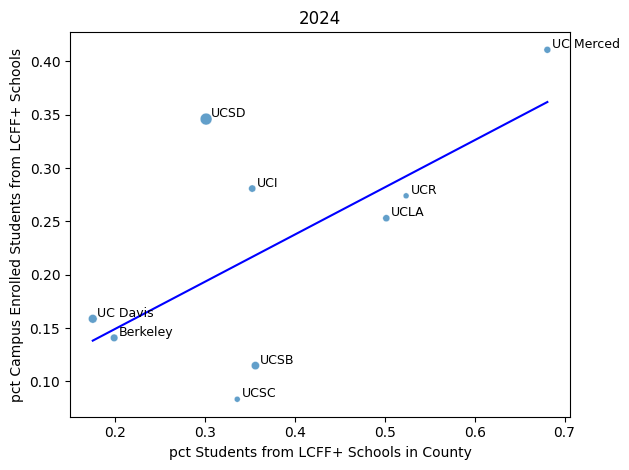

In [94]:
# Plot % of student body that is LCFF+ (Y-axis) vs. %LCFF+ students in county (X-axis). Label = campus. Bubble size = Admission rate LCFF+/non-LCFF+.
# Seaborn's scatterplot returns a Matplotlib Axes object (ax), which we customize.
xAxis = "pct Students from LCFF+ Schools in County"
yAxis = "pct Campus Enrolled Students from LCFF+ Schools"
fig, ax = plt.subplots()

sns.scatterplot(
    data=dfAdverse,
    x=xAxis,
    y=yAxis,
    size="Admission rate LCFF+/non-LCFF+",
    alpha=0.7,     # transparency
    legend=False,
    ax=ax
)

for _, row in dfAdverse.iterrows():
    ax.text(
        row[xAxis] + 0.005,
        row[yAxis] + 0.005,
        str(row["campus"]),   # column containing labels
        fontsize=9,
        ha="left",
        va="center"
    )

ax.set_title("2024")

# Compute the weighted regression separately and then plot the line.
X = dfAdverse[xAxis]
y = dfAdverse[yAxis]
X_const = sm.add_constant(X)  # Add constant for intercept

# Weighted least squares regression
modelWLSq = sm.WLS(y, X_const)
results = modelWLSq.fit()

# Get fitted line
x_vals = np.linspace(X.min(), X.max(), 100)
y_vals = results.predict(sm.add_constant(x_vals))

# Add the regression line to the plot
sns.lineplot(x=x_vals, y=y_vals, color="blue", ax=ax)

plt.tight_layout()
plt.show()

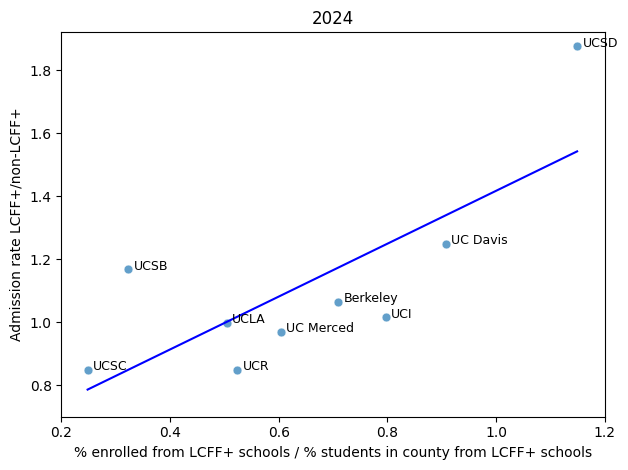

R squared for linear fit: 0.579


In [95]:
# Plot admission rate LCFF+ / non-LCFF+ (Y-axis) vs. % of student body that is LCFF+ / % LCFF+ students in county (X-axis). Bubble size = ???. Label = campus.
xAxis = "% of student body from LCFF+ schools / % of students in county from LCFF+ schools"
yAxis = "Admission rate LCFF+/non-LCFF+"
fig, ax = plt.subplots()

sns.scatterplot(
    data=dfAdverse,
    x=xAxis,
    y=yAxis,
#    size="Admission rate LCFF+/non-LCFF+",
    s=40,          # point size
    alpha=0.7,     # transparency
    legend=False,
    ax=ax
)

for _, row in dfAdverse.iterrows():
    ax.text(
        row[xAxis] + 0.01,
        row[yAxis] + 0.01,
        str(row["campus"]),   # column containing labels
        fontsize=9,
        ha="left",
        va="center"
    )

ax.set_title("2024")
ax.set(xlabel="% enrolled from LCFF+ schools / % students in county from LCFF+ schools",
       ylabel="Admission rate LCFF+/non-LCFF+",
       xlim=(0.2, 1.2),
       ylim=(0.7, 1.92))

# Compute a weighted regression separately and then plot the best fit curve
X = dfAdverse[xAxis]
y = dfAdverse[yAxis]

# *** LINE ***.
X_const = sm.add_constant(X)  # Add constant for intercept

# Weighted least squares regression
modelWLSq = sm.WLS(y, X_const)
results = modelWLSq.fit()

# Get fitted line
x_vals = np.linspace(X.min(), X.max(), 100)
y_vals = results.predict(sm.add_constant(x_vals))
r2 = results.rsquared

# Add the regression line to the plot
sns.lineplot(x=x_vals, y=y_vals, color="blue", ax=ax)

# *** QUADRATIC ***.
# X_poly = pd.DataFrame({
#     "const": 1,
#     "x": X,
#     "x2": X**2
# })

# modelWLSq = sm.WLS(y, X_poly)
# results = modelWLSq.fit()

# x_vals = np.linspace(X.min(), X.max(), 100)
# X_pred = pd.DataFrame({
#     "const": 1,
#     "x": x_vals,
#     "x2": x_vals**2
# })
# y_vals2 = results.predict(X_pred)

# *** EXPONENTIAL *** ensures monotonicity
# y_log = np.log(y)
# weights = y
# X_const = sm.add_constant(X)

# modelWLSq = sm.WLS(y_log, X_const, weights=weights)
# results = modelWLSq.fit()

# x_vals = np.linspace(X.min(), X.max(), 100)
# X_pred = sm.add_constant(x_vals)

# y_vals3 = np.exp(results.predict(X_pred))  # predict log(y), then exponentiate

# # Add the regression line to the plot
# sns.lineplot(x=x_vals, y=y_vals3, color="green", ax=ax)

plt.tight_layout()
plt.show()

print(f"R squared for linear fit: {r2:.3f}")

County % students LCFF+
Berkeley  Alameda       15061  2757   18%
UC Davis  Yolo           2044   395   19%
UCI       Orange        36050 12531   35%
UCLA      Los Angeles   98071 48626   50%
UC Merced Merced         4227  2824   67%
UCR       Riverside     32020 16274   51%
UCSB      Santa Barbara  4886  1709   35%
UCSC      Santa Cruz     2678   810   30%
UCSD      San Diego     34933 10395   30%
Campus admAll admLCFF+ enrAll enrLCFF+ %_enr_LCFF+
Berkeley   7669  1821  3625   620   17%
UC Davis  21593  4636  4236   747   18%
UCI       16611  4089  4000   789   20%
UCLA       6672  1671  3634   841   23%
UC Merced 37088 12586  1170   522   45%
UCR       47670 15044  5516  1891   34%
UCSB      20375  4640  2720   477   18%
UCSC      31825  5465  3225   257    8%
UCSD      18975  6258  4549  1344   30%
Admission rate LCFF+ / non-LCFF+
Berkeley    1.2
UC Davis    1.1
UCI        0.84
UCLA       0.97
UC Merced  0.97
UCR        0.93
UCSB        1.1
UCSC       0.76
UCSD        1.6
Campus % e

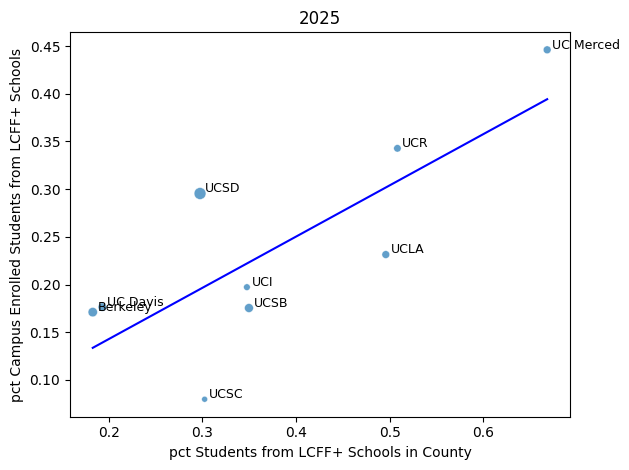

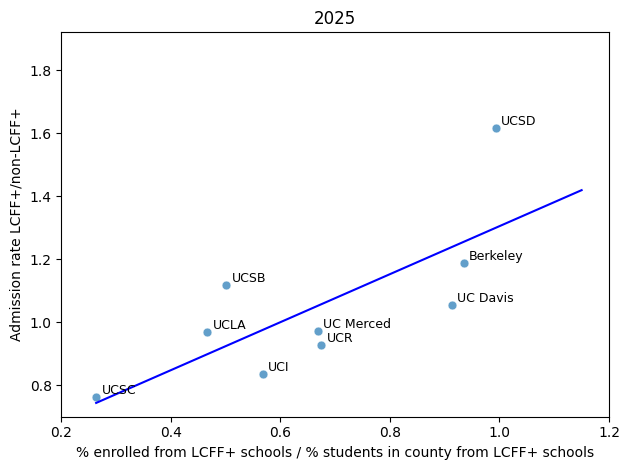

R squared for linear fit: 0.555


In [151]:
######## 2025 adverse selection plots
selectTestID = "2"
# Initialize dict-of-lists that we will convert to dfAdverse dataframe for the plots. key = column name, value = list of values.
dAdverse = {
    "campus": [],
    "county": [],
}

# LCFF+ % of students by county
print("County % students LCFF+")
dAdverse["pct Students from LCFF+ Schools in County"] = []
for county in homeCounties:
    campus = countyCampus[county]
    filteredRight = dfRight2025[dfRight2025["Test ID"] == selectTestID]
    filteredRight = filteredRight[filteredRight["CAASPP County Name"] == county]
    
    nStudents = filteredRight["Total Students Enrolled"].astype(int).sum()  # number of 11th graders
                
    dfLCFF = filteredRight[filteredRight["LCFF Plus School t"] == "Y"]
    nStudentsLCFF = dfLCFF["Total Students Enrolled"].astype(int).sum()
    rateStudentsLCFF = nStudentsLCFF / nStudents

    dAdverse["campus"].append(campus)
    dAdverse["county"].append(county)
    dAdverse["pct Students from LCFF+ Schools in County"].append(rateStudentsLCFF)
    print(f"{campus:9} {county:13} {nStudents:>5} {nStudentsLCFF:>5} {rateStudentsLCFF:5.0%}")

# % of student body that is LCFF+
print("Campus admAll admLCFF+ enrAll enrLCFF+ %_enr_LCFF+")
dAdverse["pct Campus Enrolled Students from LCFF+ Schools"] = []
for campus in campuses:
    # Denominator: All schools
    results = computeStats(dfLeft2025, dfRight2025, campus, "All", metrics=["App", "Adm", "Enr"], filterMetrics=[], selectMinApps=0)
    appAll = results["App"]
    admAll = results["Adm"]
    enrAll = results["Enr"]
    
    # LCFF+
    results = computeStats(dfLeft2025, dfRight2025, campus, "All", metrics=["App", "Adm", "Enr"], filterMetrics=[["LCFF Plus School t", "==", "Y"]], selectMinApps=0)
    adm = results["Adm"]
    app = results["App"]
    enr = results["Enr"]
    rate = float(enr) / float(enrAll)

    dAdverse["pct Campus Enrolled Students from LCFF+ Schools"].append(rate)
    print(f"{campus:9} {admAll:>5} {adm:>5} {enrAll:>5} {enr:>5} {rate:5.0%}")

# Admission rate LCFF+ / non-LCFF+
print("Admission rate LCFF+ / non-LCFF+")
dAdverse["Admission rate LCFF+/non-LCFF+"] = []
for campus in campuses:
    # non-LCFF+
    results = computeStats(dfLeft2025, dfRight2025, campus, "All", metrics=["App", "Adm", "Enr"], filterMetrics=[["LCFF Plus School t", "==", "N"]])
    adm = results["Adm"]
    app = results["App"]
    enr = results["Enr"]
    rateN = float(adm) / float(app)

    # LCFF+
    results = computeStats(dfLeft2025, dfRight2025, campus, "All", metrics=["App", "Adm", "Enr"], filterMetrics=[["LCFF Plus School t", "==", "Y"]])
    adm = results["Adm"]
    app = results["App"]
    enr = results["Enr"]
    rateY = float(adm) / float(app)

    ratio = rateY / rateN
    dAdverse["Admission rate LCFF+/non-LCFF+"].append(ratio)
    print(f"{campus:9} {ratio:5.2}")

# % of student body from LCFF+ schools / % of students in county from LCFF+ schools
print("Campus % enrolled LCFF+ / County % students LCFF+")
dAdverse["% of student body from LCFF+ schools / % of students in county from LCFF+ schools"] = []
i = 0
for campus in campuses:
    ratio = dAdverse["pct Campus Enrolled Students from LCFF+ Schools"][i] / dAdverse["pct Students from LCFF+ Schools in County"][i]
    dAdverse["% of student body from LCFF+ schools / % of students in county from LCFF+ schools"].append(ratio)
    print(f"{campus:9} {ratio:5.2}")
    i += 1

# Adverse selection
print("Enrolment rates")
print("Campus     EnrNL     EnrNR     EnrYL     EnrYR")
for county in homeCounties:
    campus = countyCampus[county]
    # non-LCFF+
    results = computeStats(dfLeft2025, dfRight2025, campus, "All", metrics=["App", "Adm", "Enr"],
                           filterMetrics=[["LCFF Plus School t", "==", "N"], ["CAASPP County Name", "==", county]], 
                           selectMinAdms=minAdmsForEnrAnalysis[campus])
    admNL = results["Adm"]
    appNL = results["App"]
    enrNL = results["Enr"]
    rateNL = float(enrNL) / float(admNL)
    results = computeStats(dfLeft2025, dfRight2025, campus, "All", metrics=["App", "Adm", "Enr"],
                           filterMetrics=[["LCFF Plus School t", "==", "N"], ["CAASPP County Campus", "!=", campus]], 
                           selectMinAdms=minAdmsForEnrAnalysis[campus])
    admNR = results["Adm"]
    appNR = results["App"]
    enrNR = results["Enr"]
    rateNR = float(enrNR) / float(admNR)

    # LCFF+
    results = computeStats(dfLeft2025, dfRight2025, campus, "All", metrics=["App", "Adm", "Enr"],
                           filterMetrics=[["LCFF Plus School t", "==", "Y"], ["CAASPP County Name", "==", county]],
                           selectMinAdms=minAdmsForEnrAnalysis[campus])
    admYL = results["Adm"]
    appYL = results["App"]
    enrYL = results["Enr"]
    rateYL = float(enrYL) / float(admYL)
    results = computeStats(dfLeft2025, dfRight2025, campus, "All", metrics=["App", "Adm", "Enr"],
                           filterMetrics=[["LCFF Plus School t", "==", "Y"], ["CAASPP County Campus", "!=", campus]], 
                           selectMinAdms=minAdmsForEnrAnalysis[campus])
    admYR = results["Adm"]
    appYR = results["App"]
    enrYR = results["Enr"]
    rateYR = float(enrYR) / float(admYR)

    print(f"{campus:9} {rateNL:.4}    {rateNR:.4}    {rateYL:.4}    {rateYR:.4}")

dfAdverse2025 = pd.DataFrame(dAdverse)

# Plot % of student body that is LCFF+ (Y-axis) vs. %LCFF+ students in county (X-axis). Label = campus. Bubble size = Admission rate LCFF+/non-LCFF+.
# Seaborn's scatterplot returns a Matplotlib Axes object (ax), which we customize.
xAxis = "pct Students from LCFF+ Schools in County"
yAxis = "pct Campus Enrolled Students from LCFF+ Schools"
fig, ax = plt.subplots()

sns.scatterplot(
    data=dfAdverse2025,
    x=xAxis,
    y=yAxis,
    size="Admission rate LCFF+/non-LCFF+",
    alpha=0.7,     # transparency
    legend=False,
    ax=ax
)

for _, row in dfAdverse2025.iterrows():
    ax.text(
        row[xAxis] + 0.005,
        row[yAxis] + 0.005,
        str(row["campus"]),   # column containing labels
        fontsize=9,
        ha="left",
        va="center"
    )

ax.set_title("2025")

# Compute the weighted regression separately and then plot the line.
X = dfAdverse2025[xAxis]
y = dfAdverse2025[yAxis]
X_const = sm.add_constant(X)  # Add constant for intercept

# Weighted least squares regression
modelWLSq = sm.WLS(y, X_const)
results = modelWLSq.fit()

# Get fitted line
x_vals = np.linspace(X.min(), X.max(), 100)
y_vals = results.predict(sm.add_constant(x_vals))

# Add the regression line to the plot
sns.lineplot(x=x_vals, y=y_vals, color="blue", ax=ax)

plt.tight_layout()
plt.show()

# Plot admission rate LCFF+ / non-LCFF+ (Y-axis) vs. % of student body that is LCFF+ / % LCFF+ students in county (X-axis). Bubble size = ???. Label = campus.
xAxis = "% of student body from LCFF+ schools / % of students in county from LCFF+ schools"
yAxis = "Admission rate LCFF+/non-LCFF+"
fig, ax = plt.subplots()

sns.scatterplot(
    data=dfAdverse2025,
    x=xAxis,
    y=yAxis,
#    size="Admission rate LCFF+/non-LCFF+",
    s=40,          # point size
    alpha=0.7,     # transparency
    legend=False,
    ax=ax
)

for _, row in dfAdverse2025.iterrows():
    ax.text(
        row[xAxis] + 0.01,
        row[yAxis] + 0.02,
        str(row["campus"]),   # column containing labels
        fontsize=9,
        ha="left",
        va="center"
    )

ax.set_title("2025")
ax.set(xlabel="% enrolled from LCFF+ schools / % students in county from LCFF+ schools",
       ylabel="Admission rate LCFF+/non-LCFF+",
       xlim=(0.2, 1.2),
       ylim=(0.7, 1.92))

# Compute a weighted regression separately and then plot the best fit curve
X = dfAdverse2025[xAxis]
y = dfAdverse2025[yAxis]

# *** LINE ***.
X_const = sm.add_constant(X)  # Add constant for intercept

# Weighted least squares regression
modelWLSq = sm.WLS(y, X_const)
results = modelWLSq.fit()

# Get fitted line
# x_vals = np.linspace(X.min(), X.max(), 100)
x_vals = np.linspace(X.min(), 1.15, 100)
y_vals = results.predict(sm.add_constant(x_vals))
r2 = results.rsquared

# Add the regression line to the plot
sns.lineplot(x=x_vals, y=y_vals, color="blue", ax=ax)

# *** QUADRATIC ***.
# X_poly = pd.DataFrame({
#     "const": 1,
#     "x": X,
#     "x2": X**2
# })

# modelWLSq = sm.WLS(y, X_poly)
# results = modelWLSq.fit()

# x_vals = np.linspace(X.min(), X.max(), 100)
# X_pred = pd.DataFrame({
#     "const": 1,
#     "x": x_vals,
#     "x2": x_vals**2
# })
# y_vals2 = results.predict(X_pred)

# *** EXPONENTIAL *** ensures monotonicity
# y_log = np.log(y)
# weights = y
# X_const = sm.add_constant(X)

# modelWLSq = sm.WLS(y_log, X_const, weights=weights)
# results = modelWLSq.fit()

# x_vals = np.linspace(X.min(), X.max(), 100)
# X_pred = sm.add_constant(x_vals)

# y_vals3 = np.exp(results.predict(X_pred))  # predict log(y), then exponentiate

# # Add the regression line to the plot
# sns.lineplot(x=x_vals, y=y_vals3, color="green", ax=ax)

plt.tight_layout()
plt.show()

print(f"R squared for linear fit: {r2:.3f}")

In [97]:
print(dfRight)

        County Code District Code                      District Name School Code                        School Name Type ID Test ID Total Students Enrolled Total Students Tested Total Students Tested with Scores Mean Scale Score Count Standard Exceeded Count Standard Met  \
11469            01         61119                    Alameda Unified     0130229                       Alameda High       7       1                     467                   440                               440           2647.1                     181                157   
11569            01         61119                    Alameda Unified     0130229                       Alameda High       7       2                     466                   438                               438           2623.7                     131                109   
11791            01         61119  Alameda Community Learning Center     0130609  Alameda Community Learning Center       9       1                      53                    

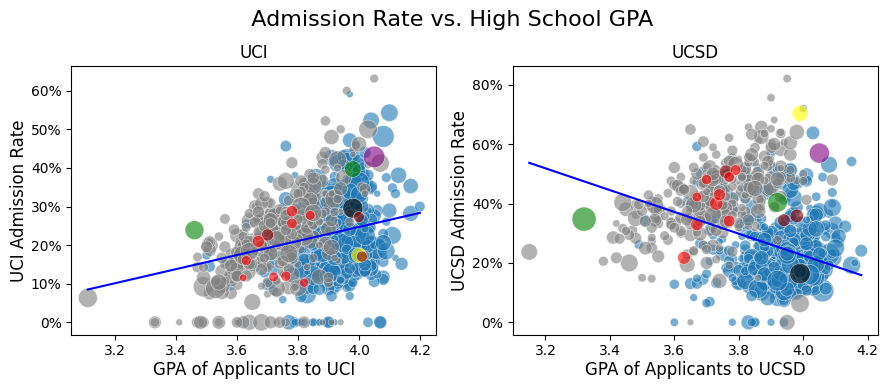

In [98]:
#### Conclusion plots
# createPlots2(dfLeft, dfRight, "All",                                      height=4, width=13.49, campusTitles="Y", title="Admission Rate vs CAASPP Math, All High Schools                                                          ", legend="Y")
createPlots2(dfLeft, dfRight, "All",   xAxis="App GPA",                     height=4, width=9,     campusTitles="Y", title="  Admission Rate vs. High School GPA")

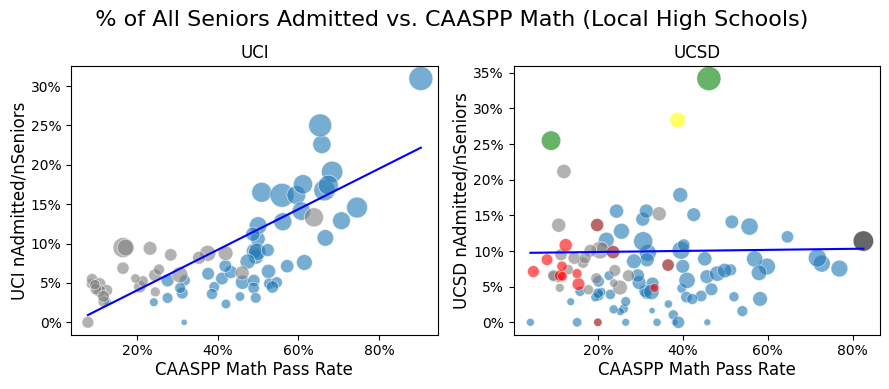

In [99]:
createPlots2(dfLeft, dfRight, "Local", yAxis="SeniorAdmRate", selectMinApps=0, height=4, width=9,     campusTitles="Y", title="  % of All Seniors Admitted vs. CAASPP Math (Local High Schools)")

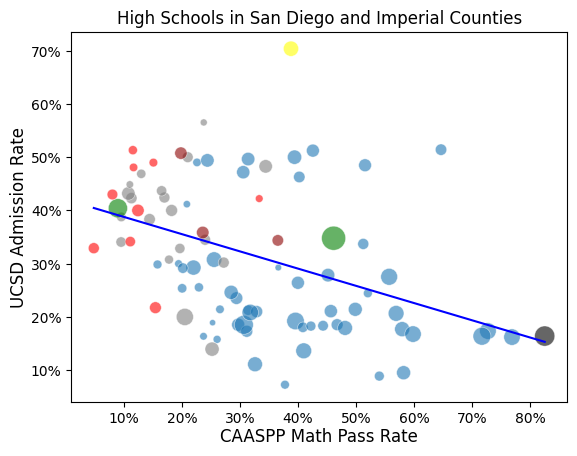

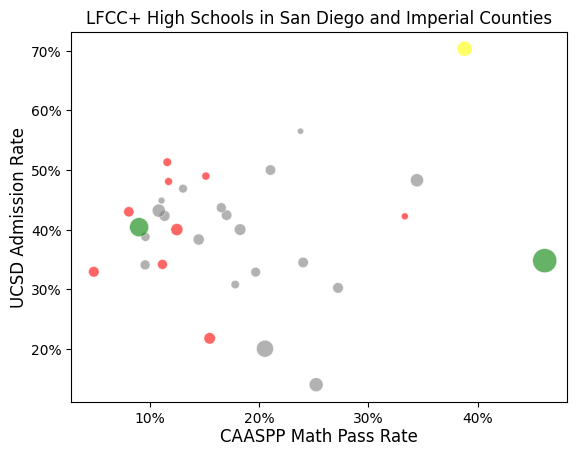

In [100]:
fig, ax = plt.subplots()  # Create a Matplotlib Axes object
createPlot(ax, dfLeft, dfRight, "UCSD", "Local",                                                    title="High Schools in San Diego and Imperial Counties")
plt.show()
fig, ax = plt.subplots()  # Create a Matplotlib Axes object
createPlot(ax, dfLeft, dfRight, "UCSD", "Local", filterMetrics=[["LCFF Plus School t", "==", "Y"]], title="LFCC+ High Schools in San Diego and Imperial Counties")
plt.show()

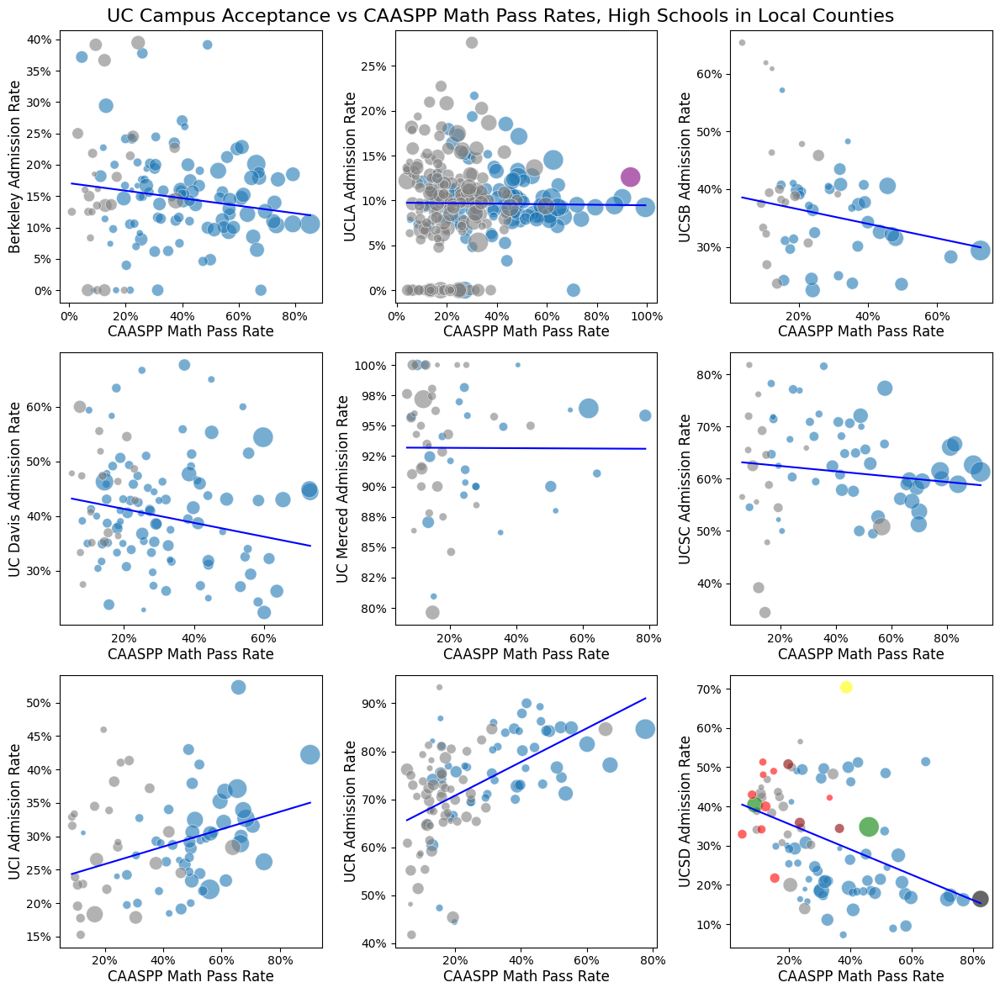

In [101]:
createPlots(dfLeft, dfRight, "Local", title="UC Campus Acceptance vs CAASPP Math Pass Rates, High Schools in Local Counties")

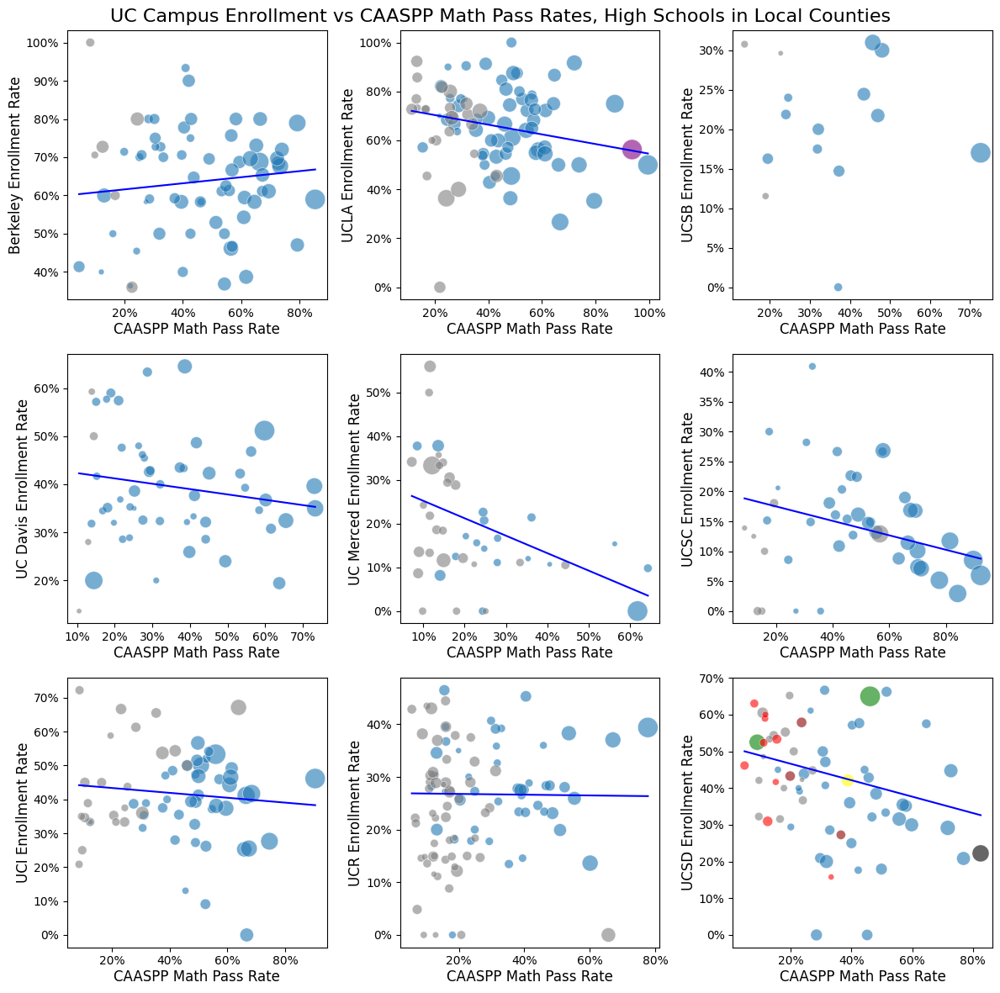

In [102]:
createPlots(dfLeft, dfRight, "Local", yAxis="EnrRate", title="UC Campus Enrollment vs CAASPP Math Pass Rates, High Schools in Local Counties")

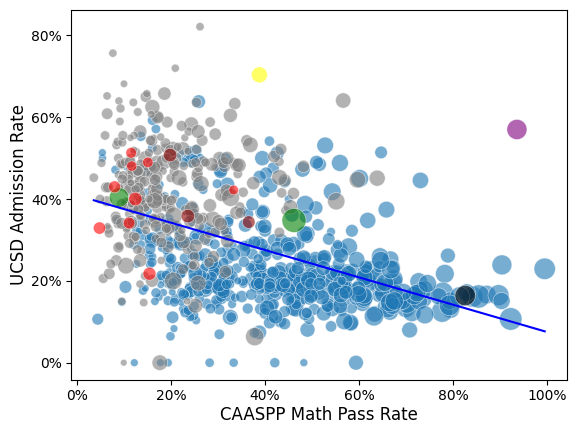

In [103]:
fig, ax = plt.subplots()  # Create a Matplotlib Axes object
createPlot(ax, dfLeft, dfRight, "UCSD", "All", title="")

# plt.legend([],[], frameon=False)  # Remove Seaborn’s automatic legend
# legendElements = []  # Build custom legend handles
# for category in categoryTextNarrow:
#     legendElements.append(Line2D([0], [0], marker='o', color='w', label=categoryTextNarrow[category], markerfacecolor=customPalette[category], markersize=10))
# plt.legend(handles=legendElements, bbox_to_anchor=(1.0, 1), loc="upper left")  # Add custom legend

plt.show()

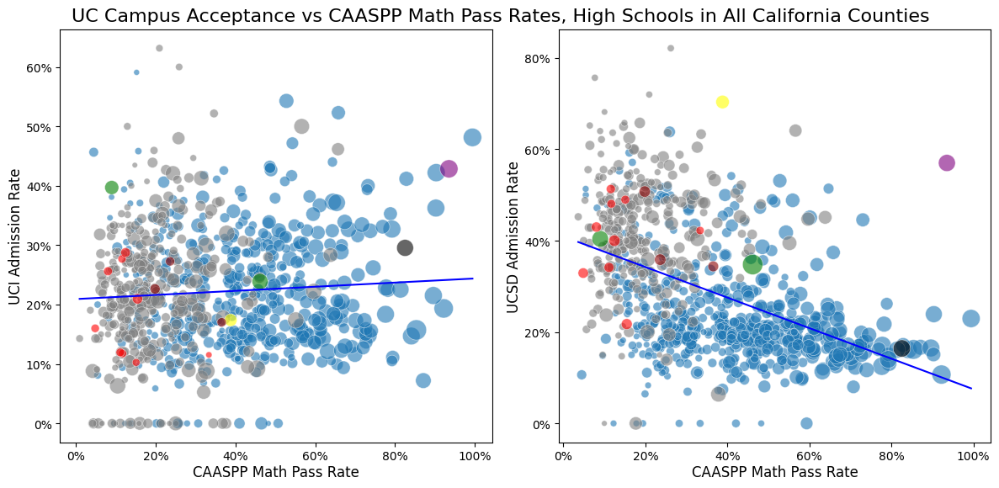

In [104]:
createPlots2(dfLeft, dfRight, "All", title="UC Campus Acceptance vs CAASPP Math Pass Rates, High Schools in All California Counties")

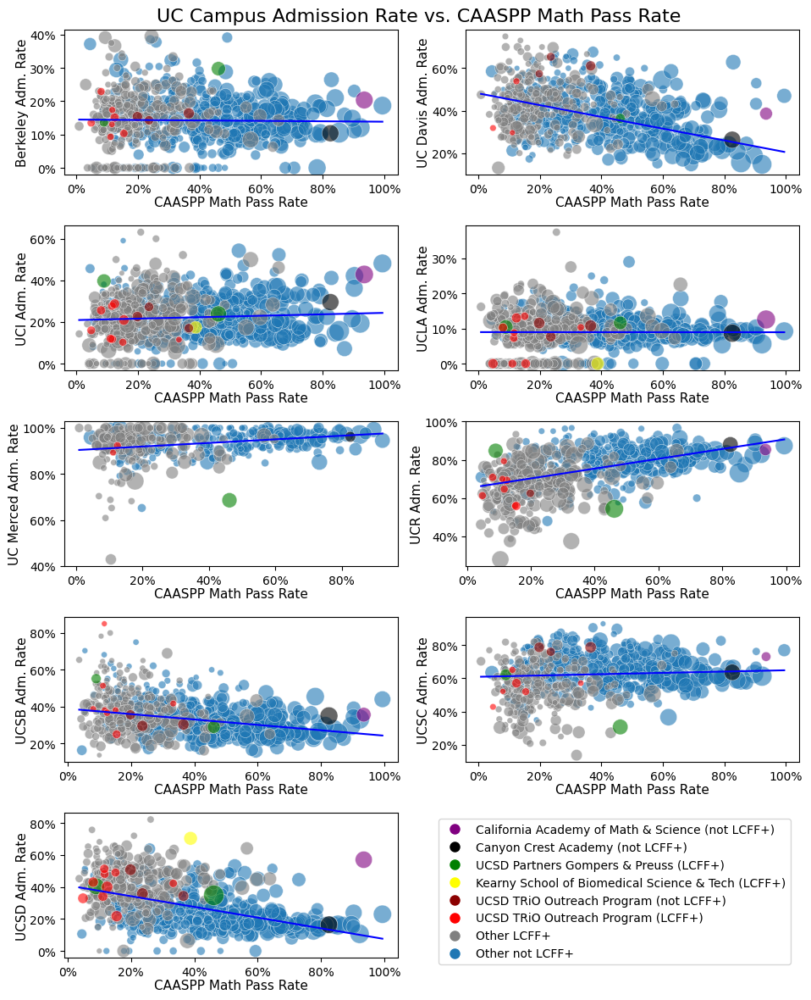

In [105]:
# 2x5
createPlots10(dfLeft, dfRight, "All", title="UC Campus Admission Rate vs. CAASPP Math Pass Rate")

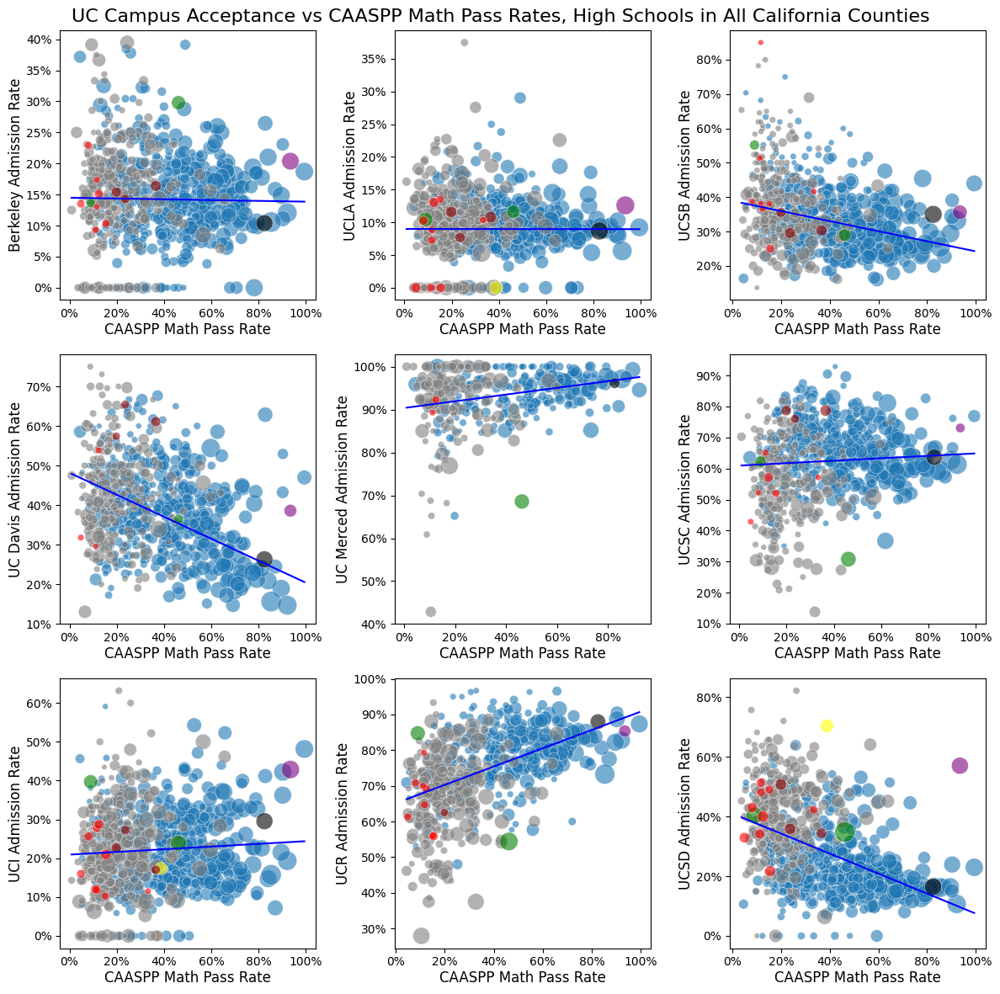

In [106]:
# 3x3
createPlots(dfLeft, dfRight, "All",                                                    title="UC Campus Acceptance vs CAASPP Math Pass Rates, High Schools in All California Counties")

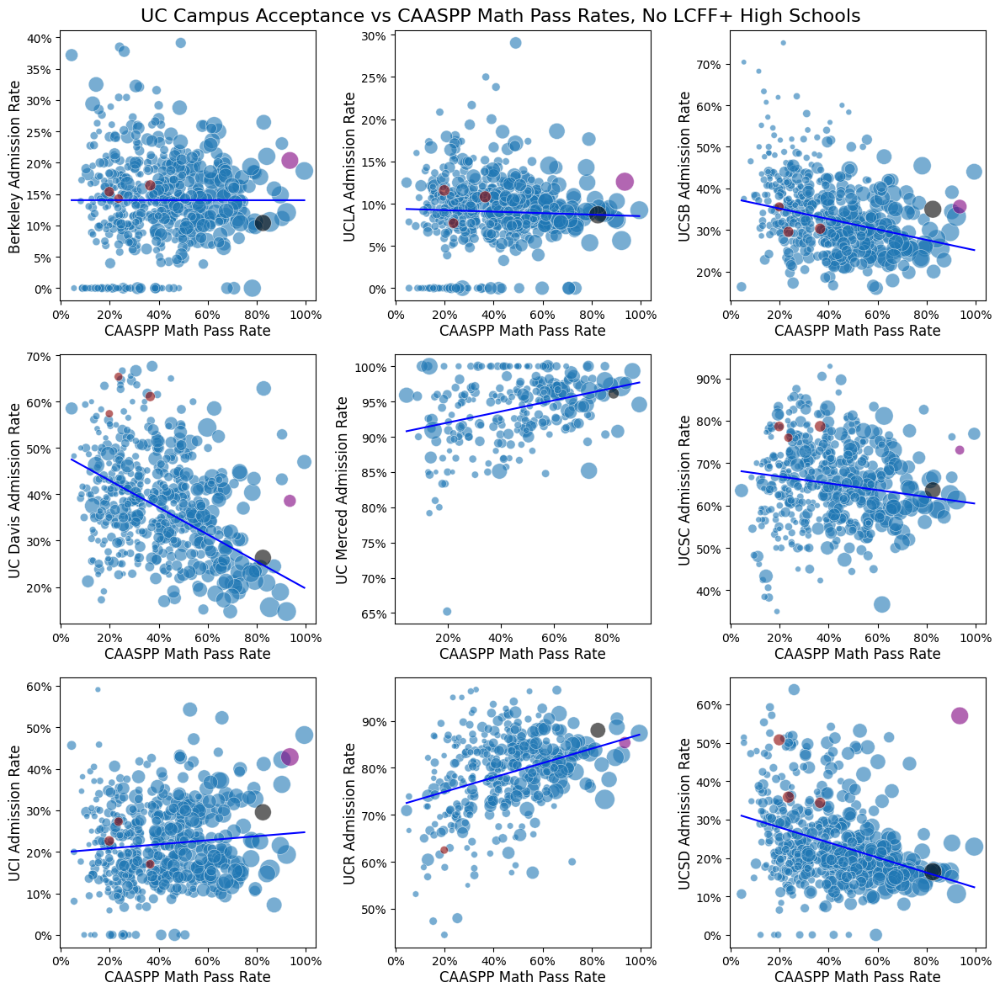

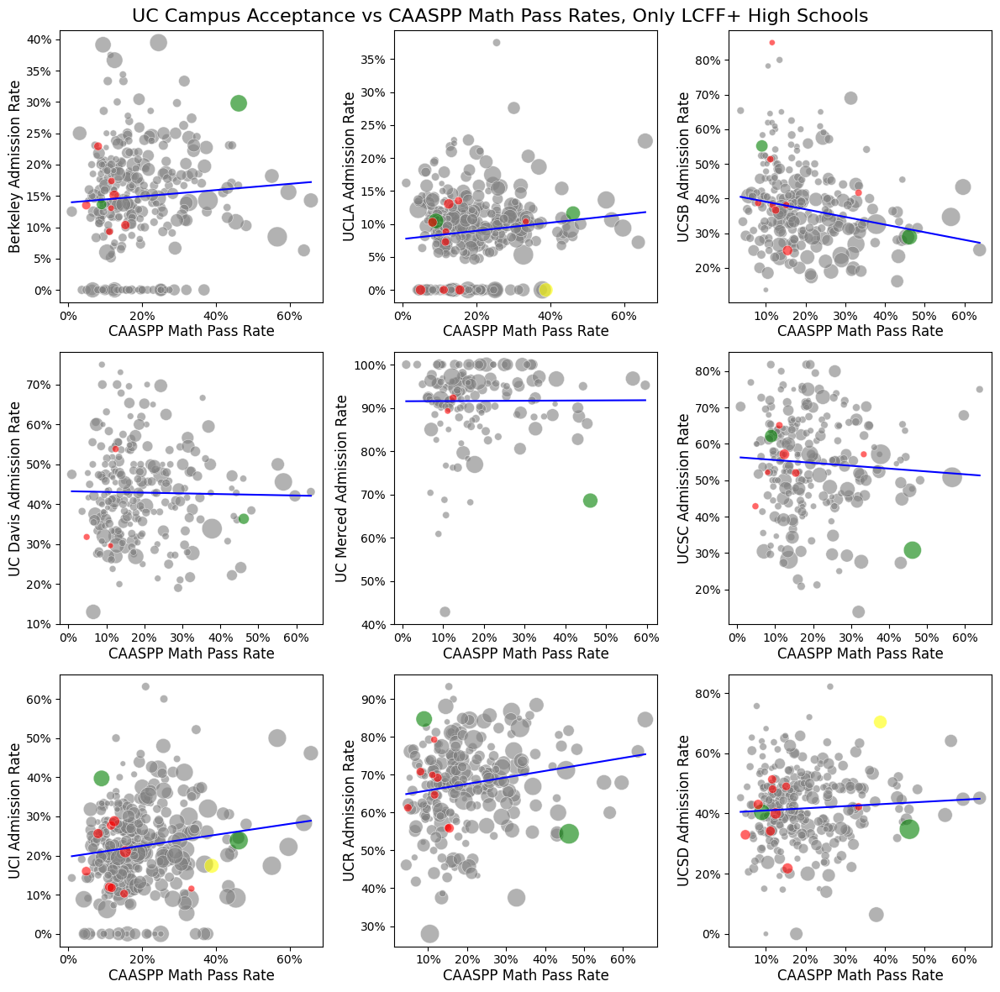

In [107]:
# Look separately at LCFF+ schools and only non-LCFF+ schools
createPlots(dfLeft, dfRight, "All", filterMetrics=[["LCFF Plus School t", "==", "N"]], title="UC Campus Acceptance vs CAASPP Math Pass Rates, No LCFF+ High Schools")
createPlots(dfLeft, dfRight, "All", filterMetrics=[["LCFF Plus School t", "==", "Y"]], title="UC Campus Acceptance vs CAASPP Math Pass Rates, Only LCFF+ High Schools")

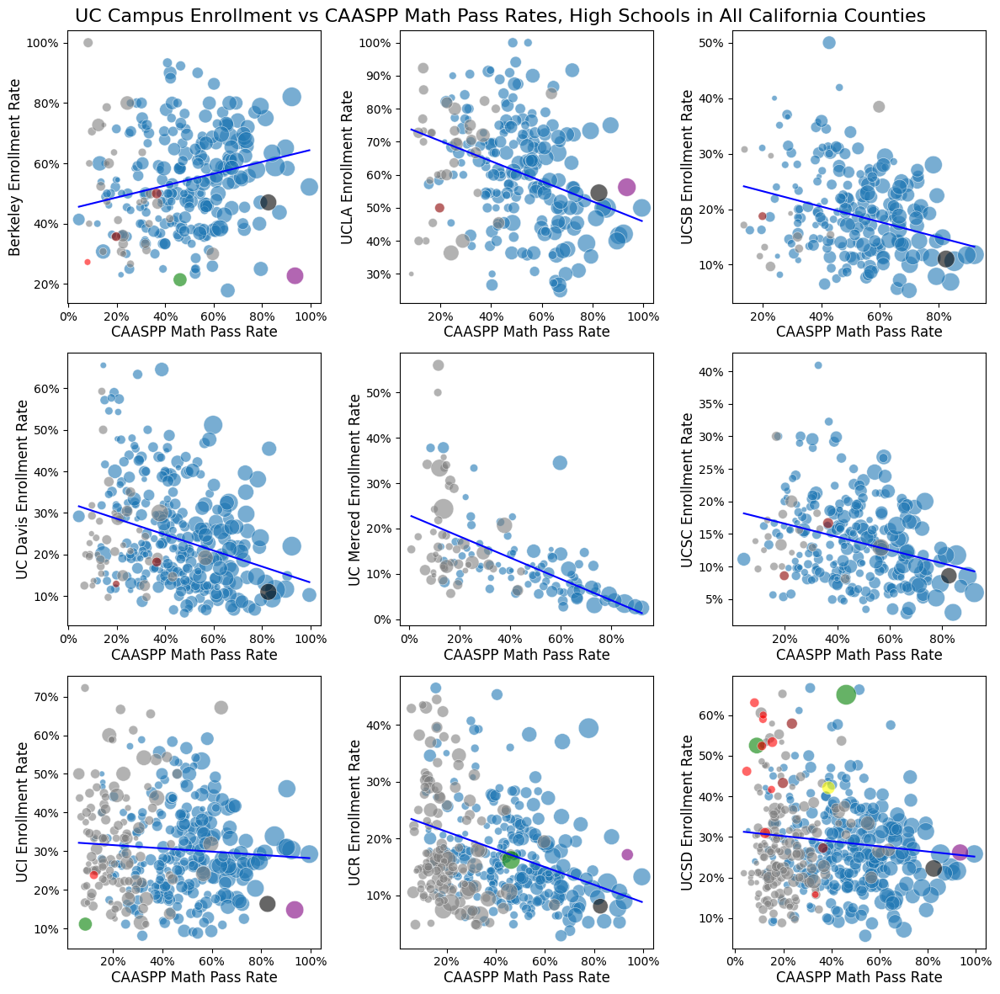

In [108]:
createPlots(dfLeft, dfRight, "All", yAxis="EnrRate", filterMetrics=[["Enr", ">=", 3]], title="UC Campus Enrollment vs CAASPP Math Pass Rates, High Schools in All California Counties")

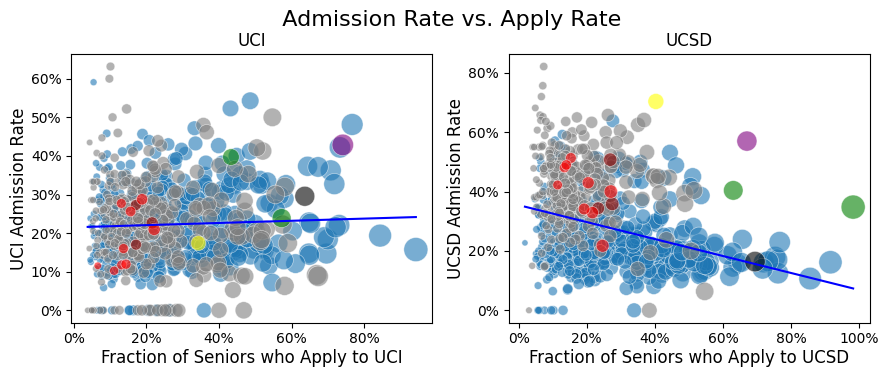

In [109]:
# Acceptance rate vs fraction who apply
createPlots2(dfLeft, dfRight, "All", xAxis="SeniorAppRate", height=4, width=9, campusTitles="Y", title="  Admission Rate vs. Apply Rate", titleGap=0.93)

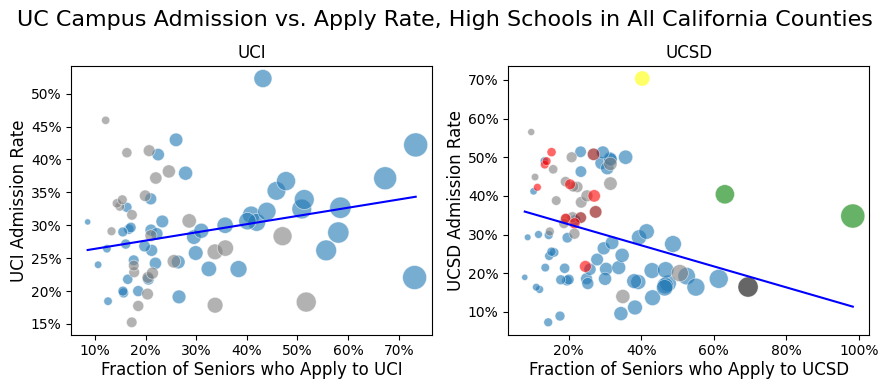

In [110]:
createPlots2(dfLeft, dfRight, "Local", xAxis="SeniorAppRate", height=4, width=9, campusTitles="Y", title="UC Campus Admission vs. Apply Rate, High Schools in All California Counties")

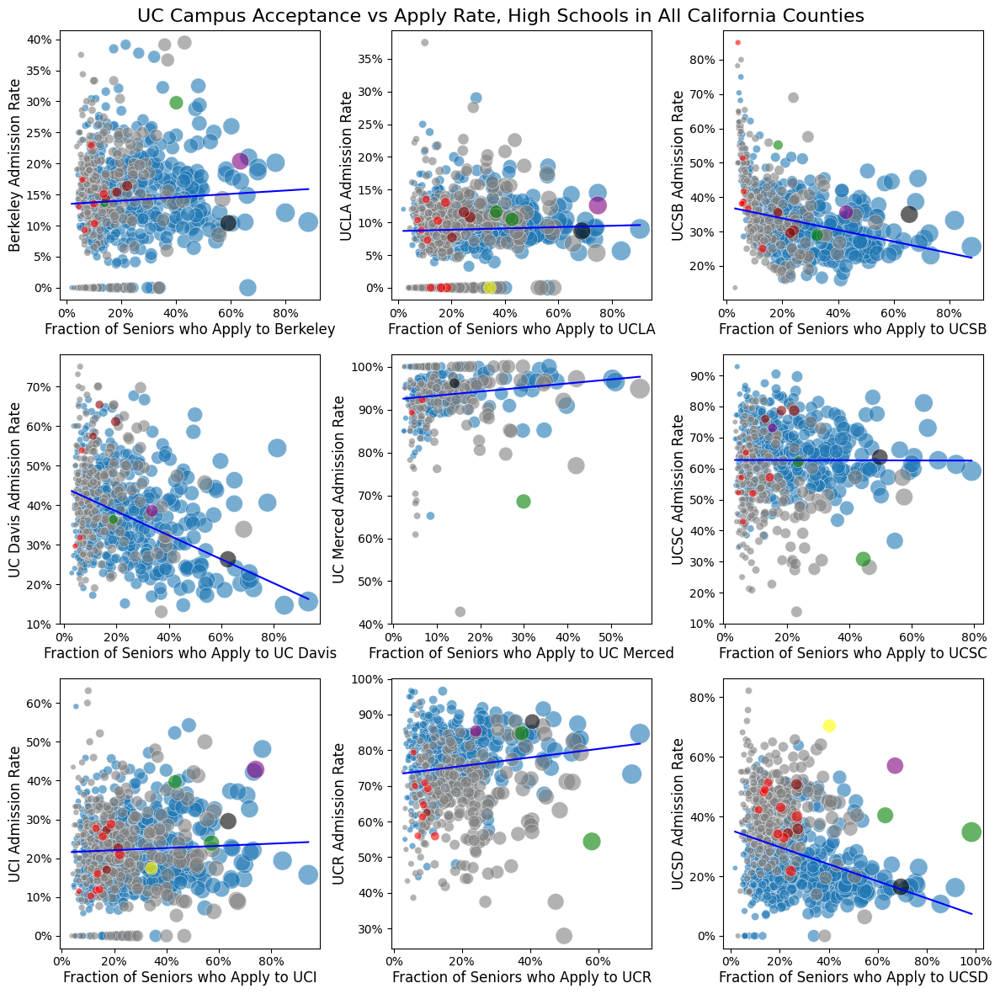

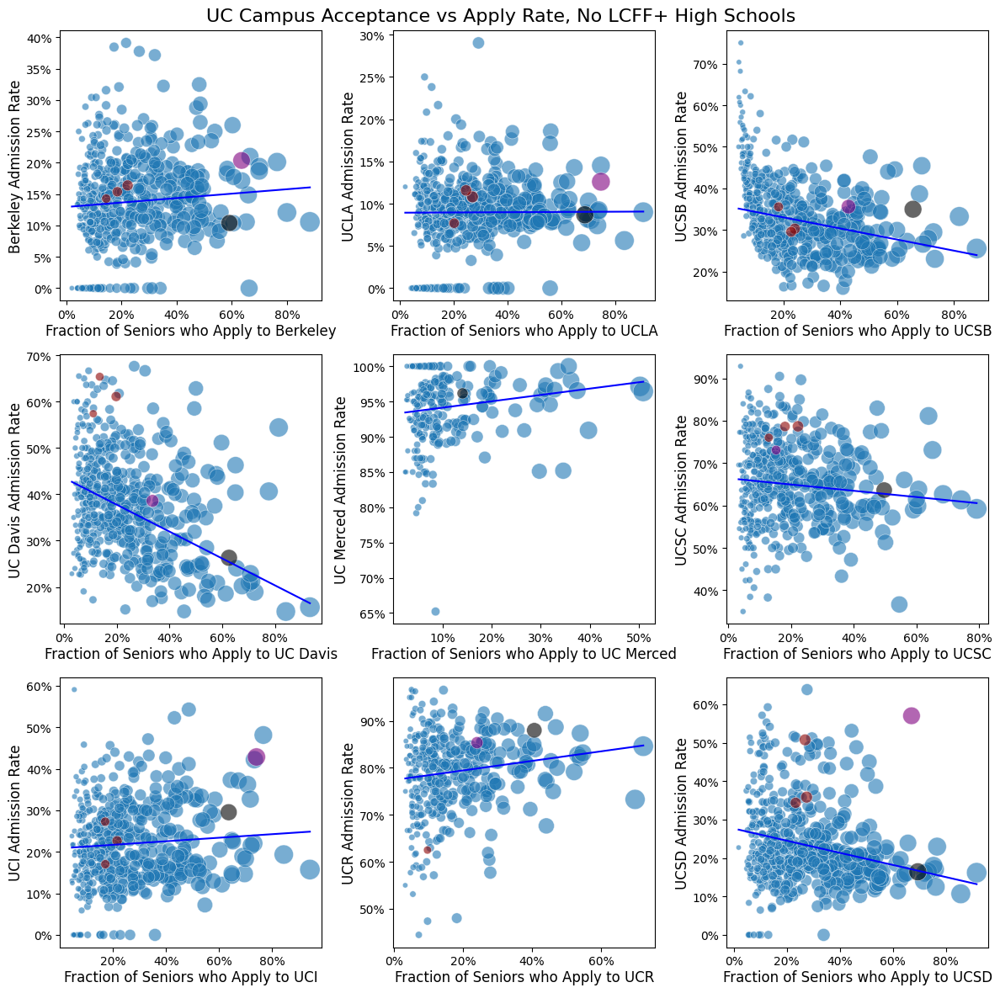

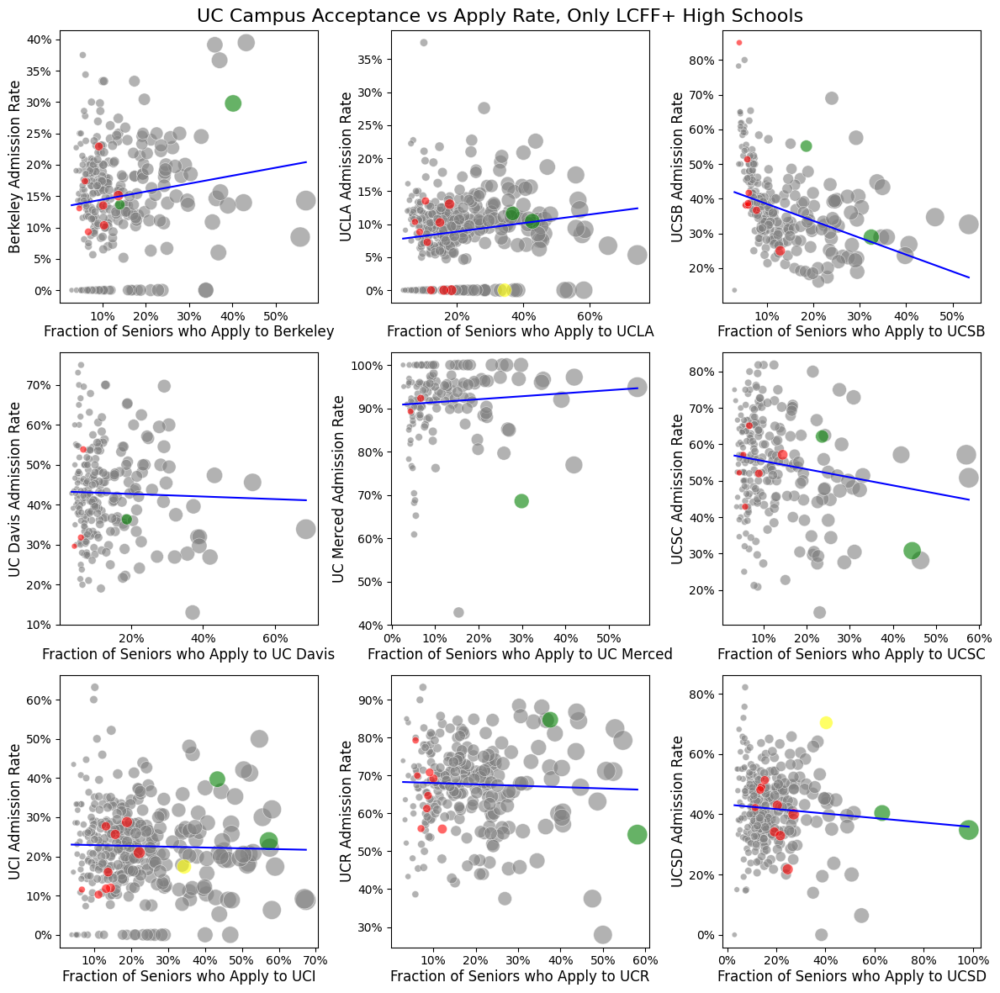

In [111]:
# Acceptance rate vs fraction who apply
createPlots(dfLeft, dfRight, "All", xAxis="SeniorAppRate",                                                    title="UC Campus Acceptance vs Apply Rate, High Schools in All California Counties")

createPlots(dfLeft, dfRight, "All", xAxis="SeniorAppRate", filterMetrics=[["LCFF Plus School t", "==", "N"]], title="UC Campus Acceptance vs Apply Rate, No LCFF+ High Schools")
createPlots(dfLeft, dfRight, "All", xAxis="SeniorAppRate", filterMetrics=[["LCFF Plus School t", "==", "Y"]], title="UC Campus Acceptance vs Apply Rate, Only LCFF+ High Schools")

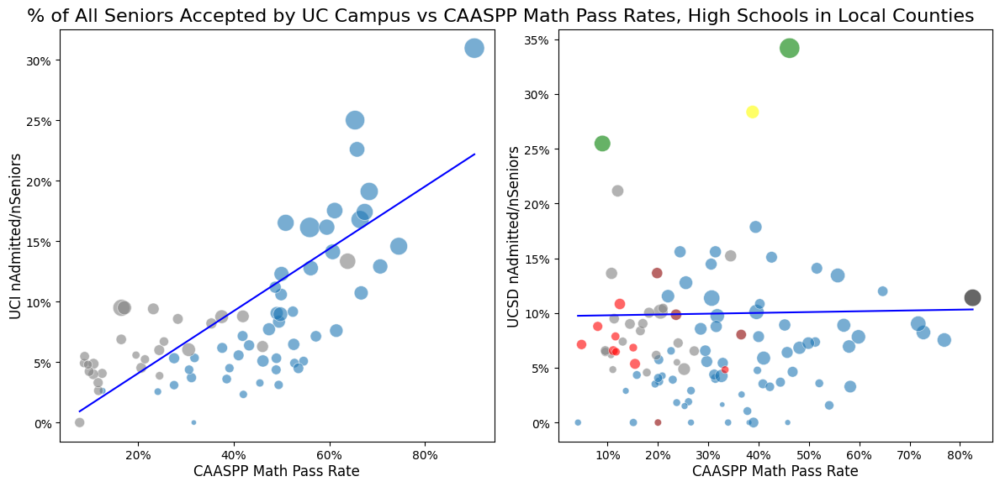

In [112]:
createPlots2(dfLeft, dfRight, "Local", yAxis="SeniorAdmRate", selectMinApps=0, title="% of All Seniors Accepted by UC Campus vs CAASPP Math Pass Rates, High Schools in Local Counties")

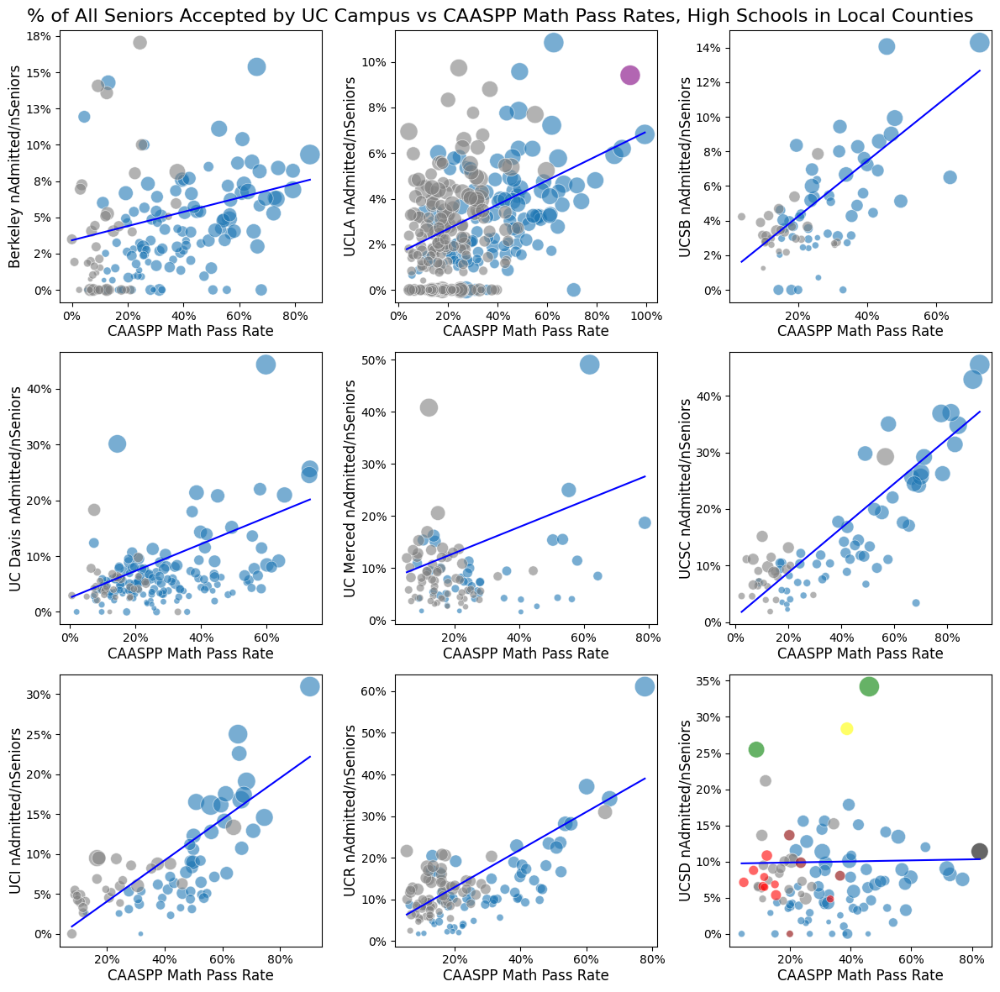

In [113]:
createPlots(dfLeft, dfRight, "Local", yAxis="SeniorAdmRate", selectMinApps=0, title="% of All Seniors Accepted by UC Campus vs CAASPP Math Pass Rates, High Schools in Local Counties")

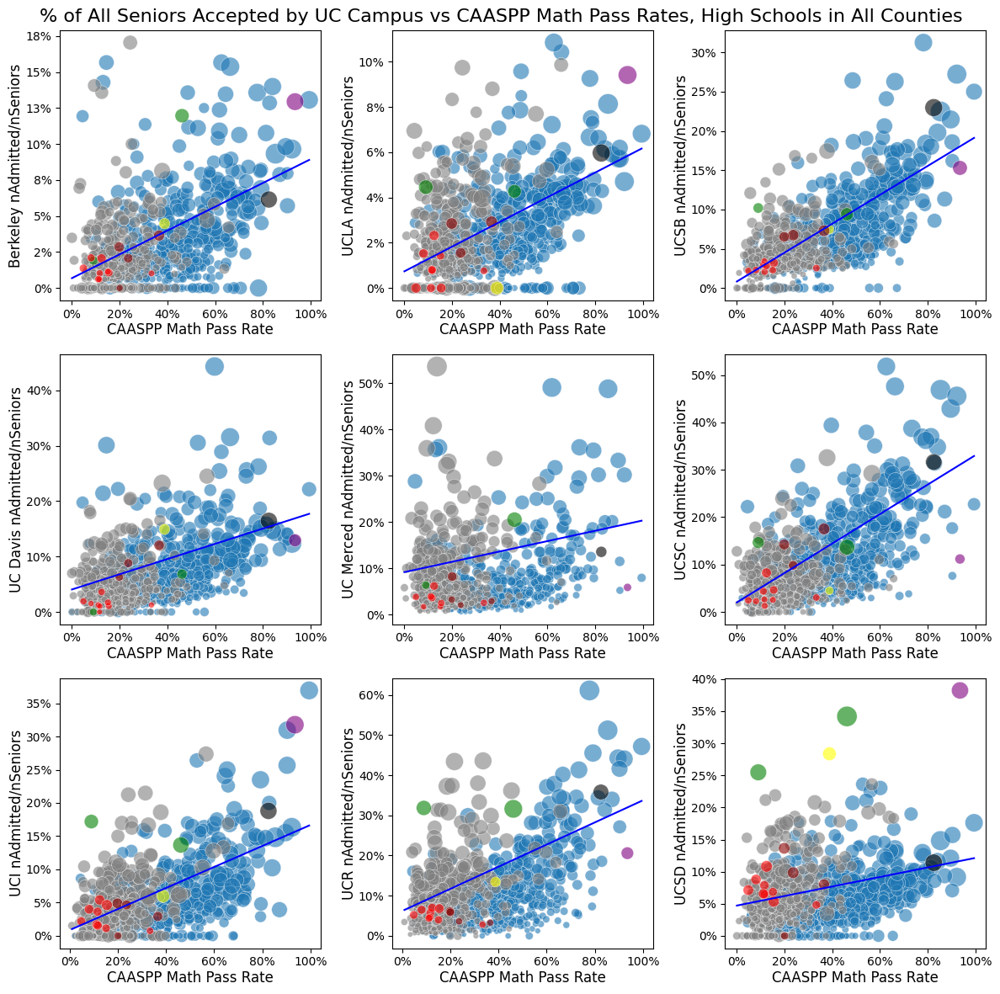

In [114]:
createPlots(dfLeft, dfRight, "All", yAxis="SeniorAdmRate", selectMinApps=0, title="% of All Seniors Accepted by UC Campus vs CAASPP Math Pass Rates, High Schools in All Counties")

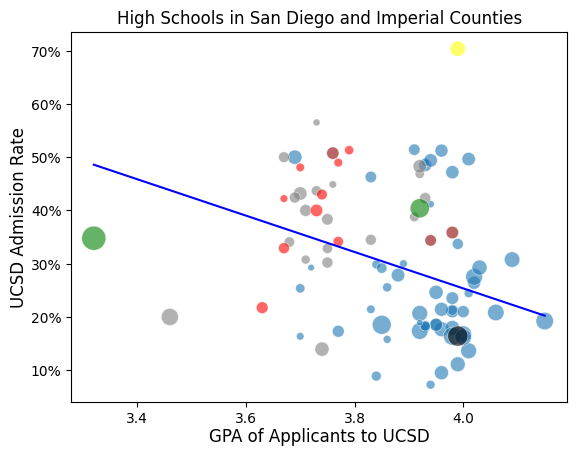

In [115]:
fig, ax = plt.subplots()  # Create a Matplotlib Axes object
createPlot(ax, dfLeft, dfRight, "UCSD", "Local", xAxis="App GPA", title="High Schools in San Diego and Imperial Counties")
plt.show()

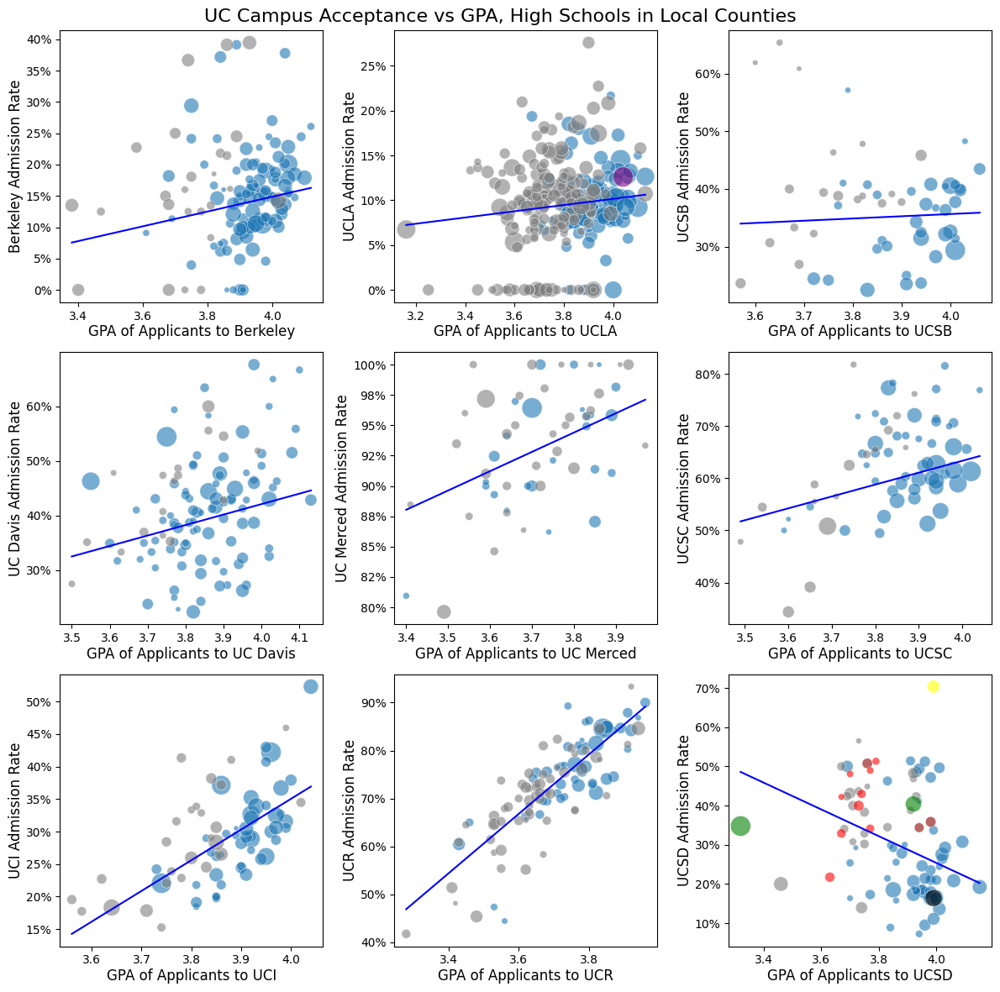

In [116]:
createPlots(dfLeft, dfRight, "Local", xAxis="App GPA", title="UC Campus Acceptance vs GPA, High Schools in Local Counties")

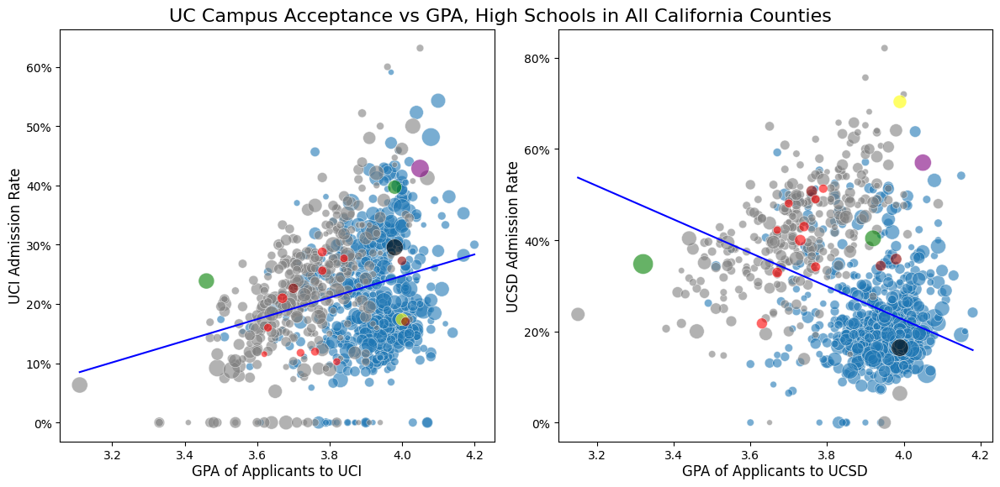

In [117]:
createPlots2(dfLeft, dfRight, "All", xAxis="App GPA", title="UC Campus Acceptance vs GPA, High Schools in All California Counties")

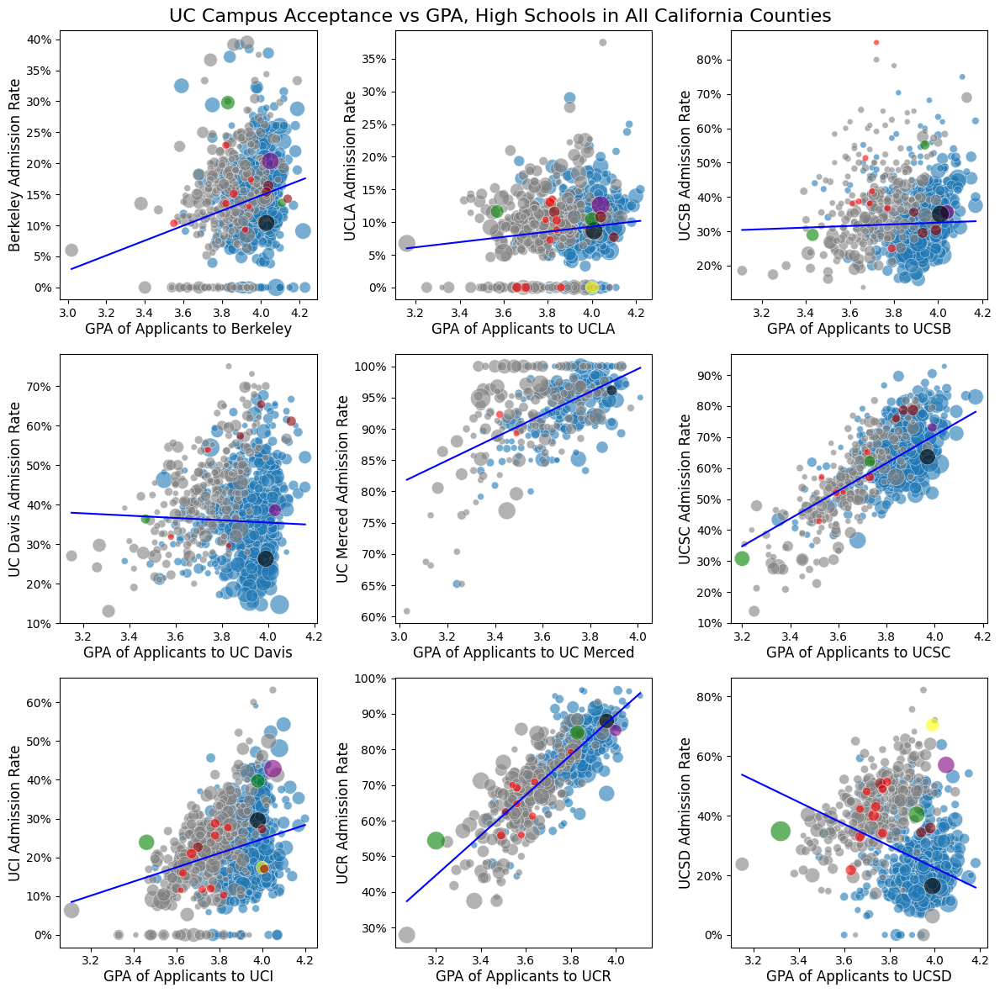

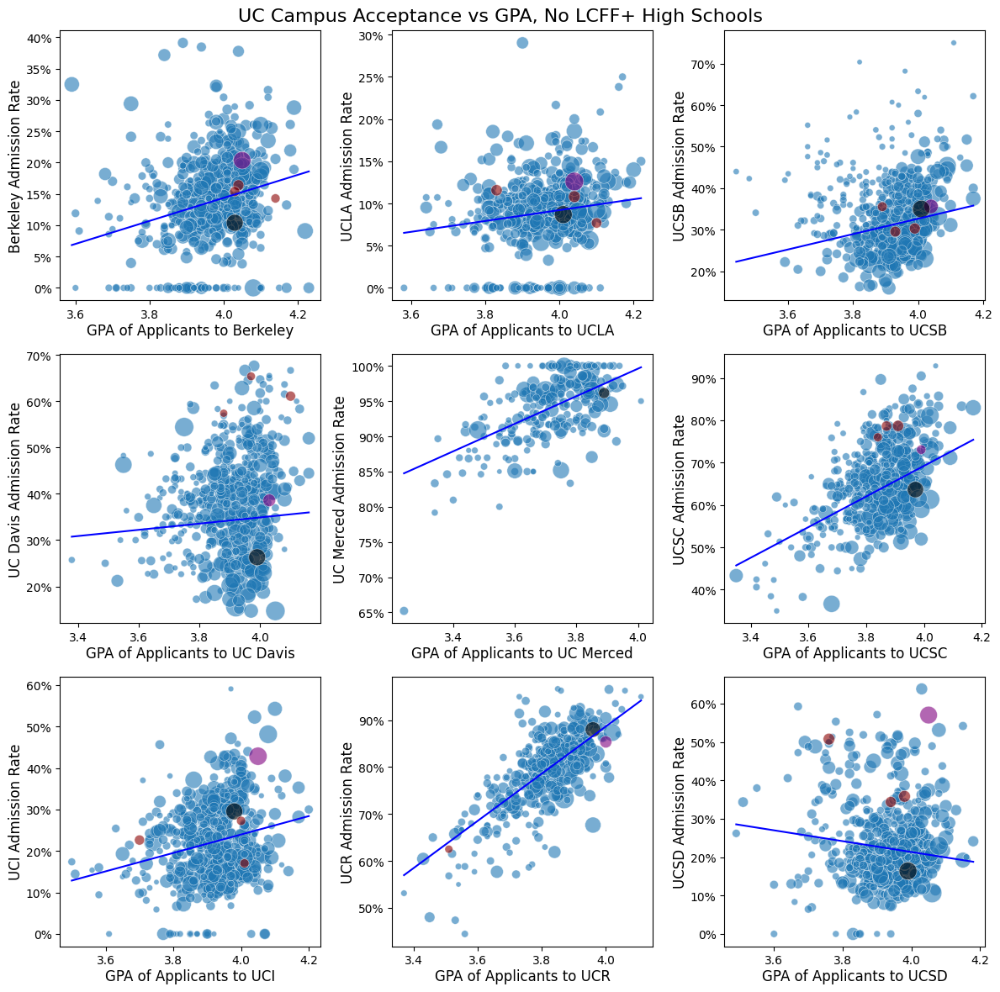

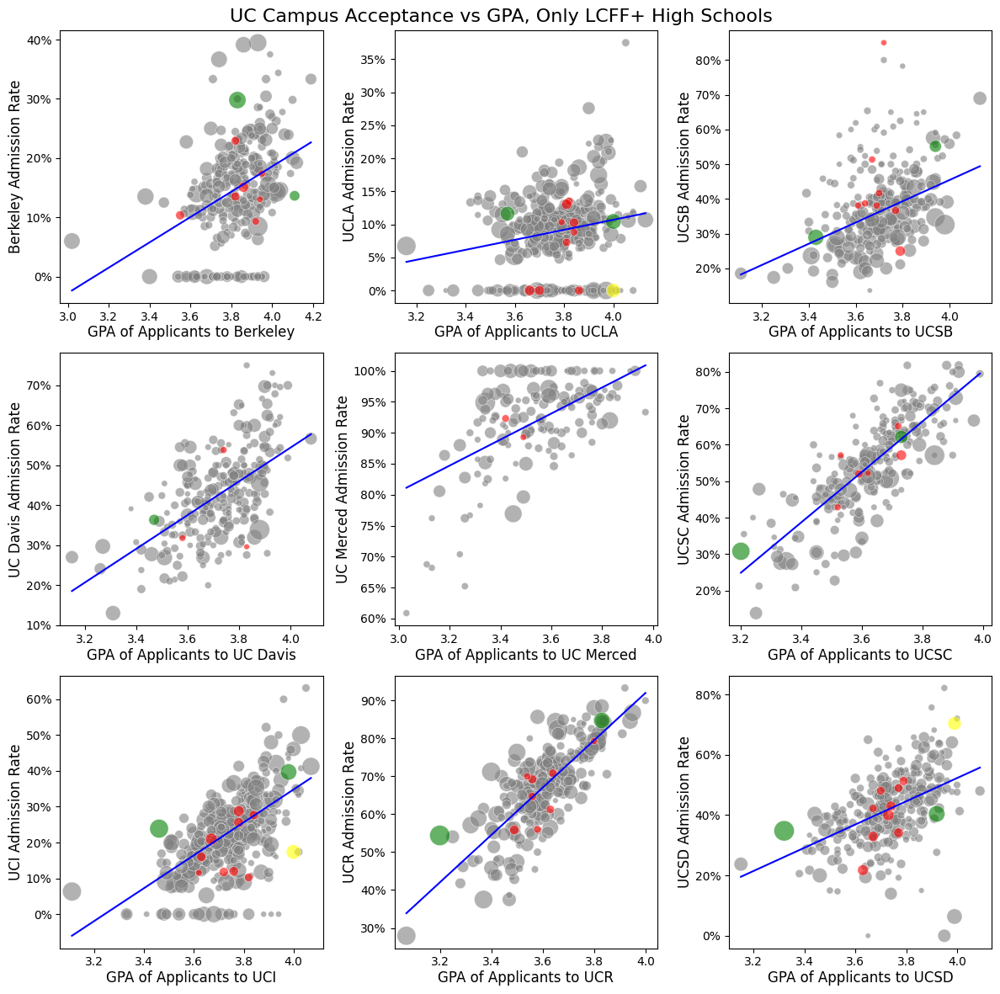

In [118]:
createPlots(dfLeft, dfRight, "All", xAxis="App GPA",                                                    title="UC Campus Acceptance vs GPA, High Schools in All California Counties")

# Look separately at LCFF+ schools and non-LCFF+ schools
createPlots(dfLeft, dfRight, "All", xAxis="App GPA", filterMetrics=[["LCFF Plus School t", "==", "N"]], title="UC Campus Acceptance vs GPA, No LCFF+ High Schools")
createPlots(dfLeft, dfRight, "All", xAxis="App GPA", filterMetrics=[["LCFF Plus School t", "==", "Y"]], title="UC Campus Acceptance vs GPA, Only LCFF+ High Schools")

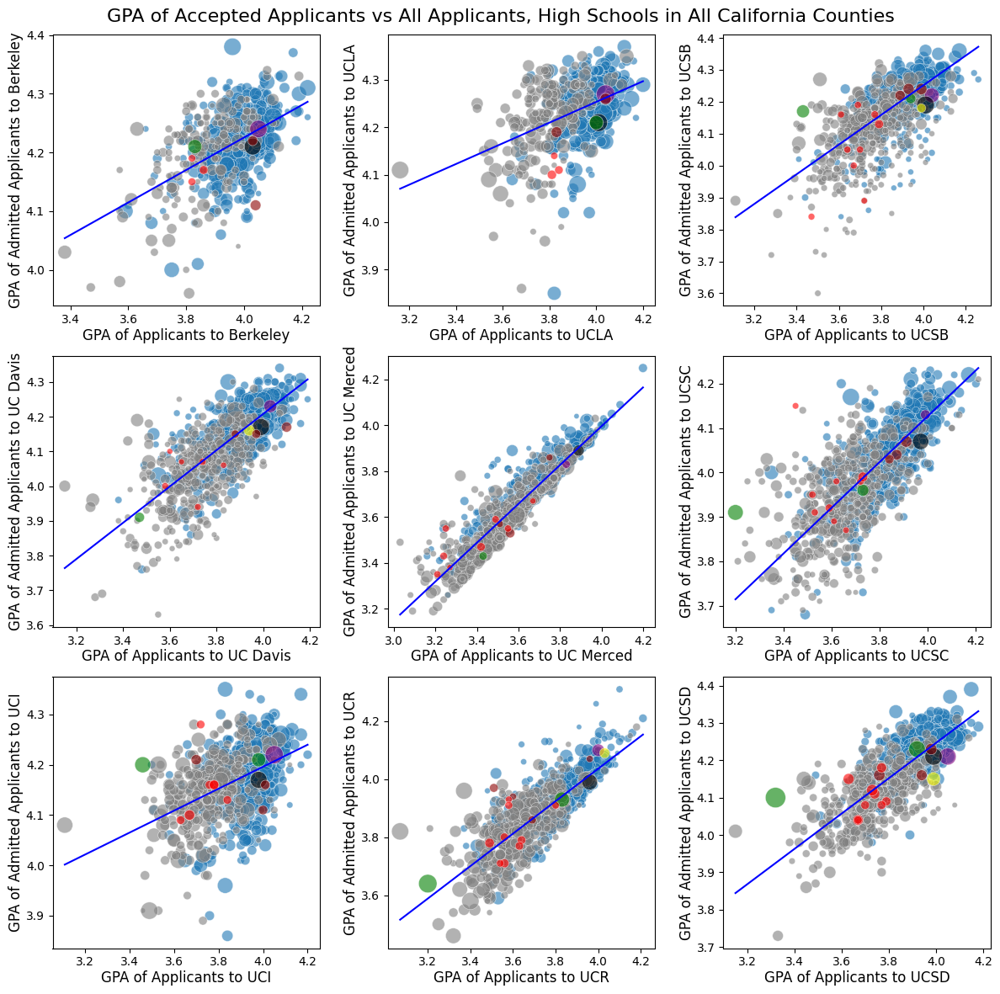

In [119]:
createPlots(dfLeft, dfRight, "All", xAxis="App GPA", yAxis="Adm GPA", selectMinApps=0, title="GPA of Accepted Applicants vs All Applicants, High Schools in All California Counties")

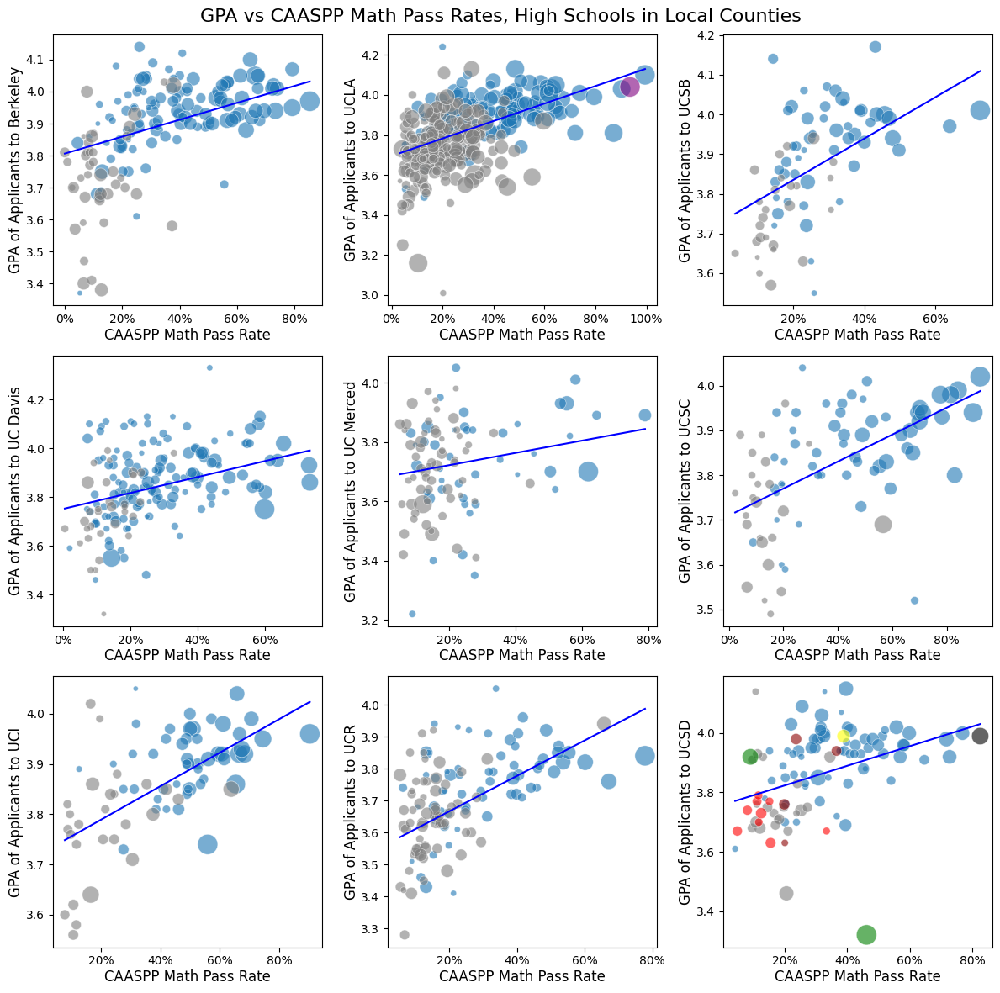

In [120]:
createPlots(dfLeft, dfRight, "Local", yAxis="App GPA", selectMinApps=0, title="GPA vs CAASPP Math Pass Rates, High Schools in Local Counties")

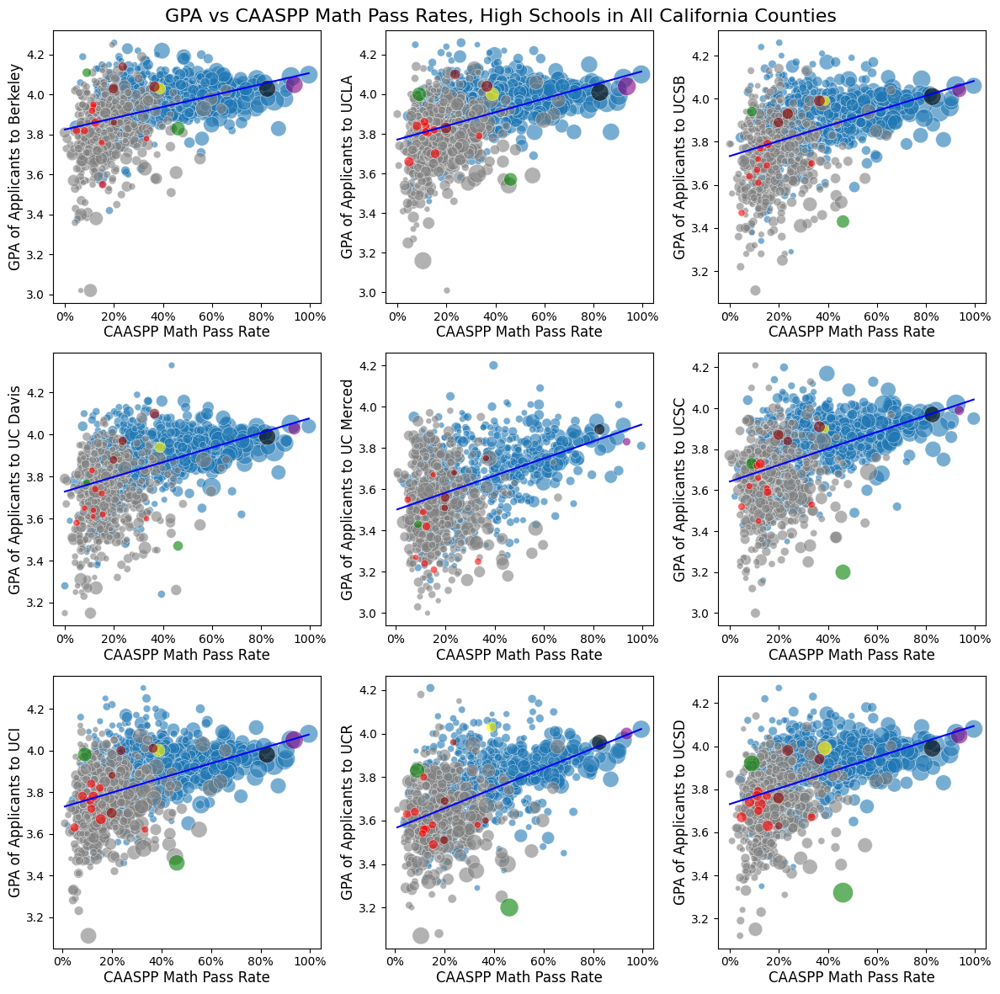

In [121]:
createPlots(dfLeft, dfRight, "All", yAxis="App GPA", selectMinApps=0, title="GPA vs CAASPP Math Pass Rates, High Schools in All California Counties")

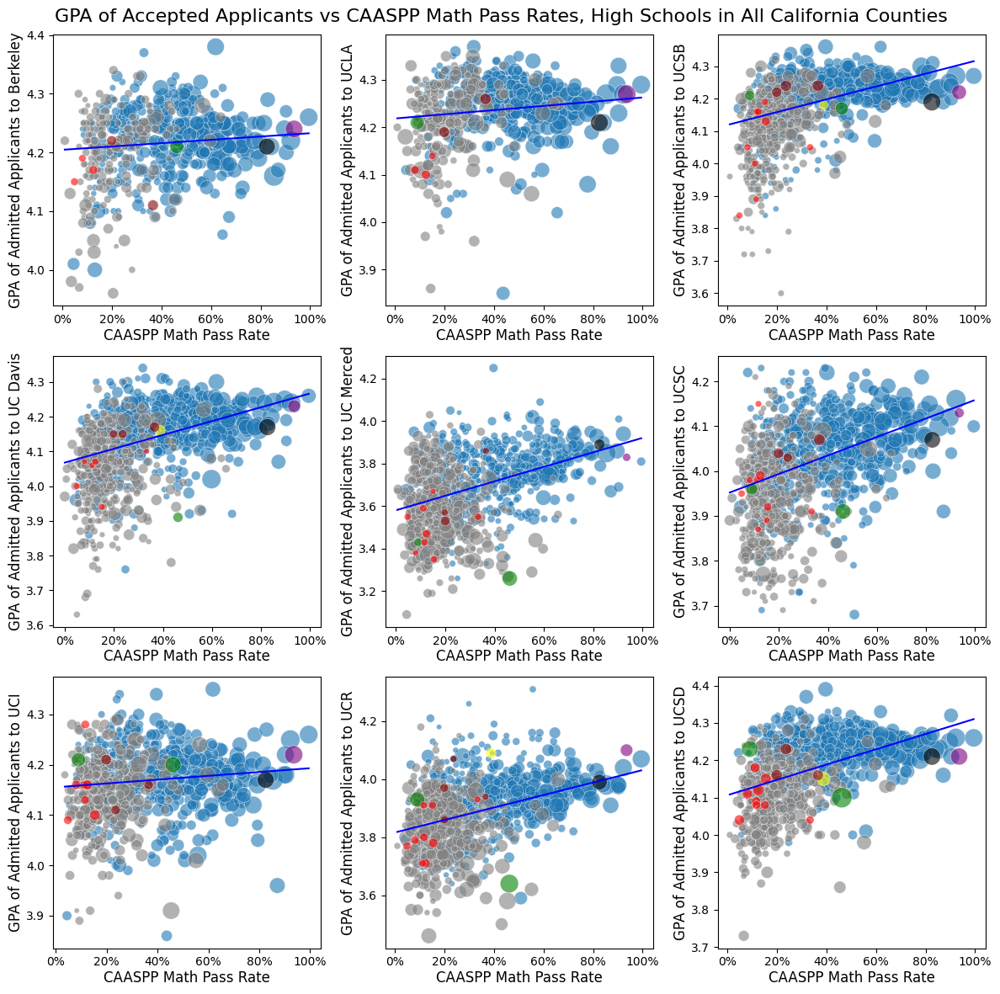

In [122]:
createPlots(dfLeft, dfRight, "All", yAxis="Adm GPA", selectMinApps=0, title="GPA of Accepted Applicants vs CAASPP Math Pass Rates, High Schools in All California Counties")

In [123]:
# Find high schools where UCSD accepts a greater number of students than pass the CAASPP
joined = pd.merge(dfLeft, dfRight, left_on="CAASPP_ID", right_on="School Code", how="inner")
joined = joined[(joined["Campus"] == "UCSD") & (joined["Test ID"] == "2")]
joined = joined[joined["Adm"].astype(int) > joined["Count Standard Met and Above"].astype(int)]
for index, row in joined.iterrows():
    nAdm = row["Adm"]
    nMet = int(row["Count Standard Met and Above"])
    ratio = float(nAdm / nMet)
    print(f'{row["School Name"]:50} {row["County"]:15} {nMet:2} {nAdm:2} {ratio:.1f} {row["AdmRate"]:.0%}')

Ambassador-Global Leadership                       Los Angeles      4  7 1.8 47%
Animo Jackie Robinson High                         Los Angeles     22 30 1.4 62%
Aspire Golden State College Preparatory Academy    Alameda          4  5 1.2 33%
Aspire Pacific Academy                             Los Angeles      3 11 3.7 65%
Crawford High                                      San Diego       29 38 1.3 43%
Jordan High                                        Los Angeles     11 12 1.1 43%
Ednovate - East College Prep                       Los Angeles     12 13 1.1 57%
East Los Angeles Renaissance Academy at Esteban E. Los Angeles      7  8 1.1 73%
Fremont High                                       Alameda          2  6 3.0 38%
Gompers Preparatory Academy                        San Diego       14 40 2.9 40%
Diego Rivera Learning Complex Green Design STEAM A Los Angeles      8 14 1.8 61%
Hoover High                                        San Diego       40 46 1.1 43%
Humanitas Academy of Art and

In [124]:
# Explore: local schools with UCSD admission rate >= 0.5
joined = pd.merge(dfLeft, dfRight, left_on="CAASPP_ID", right_on="School Code", how="inner")
joined = joined[(joined["Campus"] == "UCSD") & (joined["countyCampus"] == "UCSD") & (joined["Test ID"] == "2")]
joined["SeniorAdmRate"] = joined["Adm"].astype(int) / joined["Total Students Enrolled"].astype(int)  # Fraction of seniors admitted
print(joined[joined["AdmRate"] >= 0.5])

       UC_ID                          School         City     County Campus countyCampus  App  Adm  Enr CAASPP_ID  App GPA  Adm GPA  Enrl GPA   AdmRate   EnrRate County Code District Code               District Name School Code                                         School Name Type ID Test ID  \
16450  50430          CALIPATRIA HIGH SCHOOL   CALIPATRIA   Imperial   UCSD         UCSD    8    5    0   1332501     4.14     4.26      0.00  0.625000  0.000000          13         63107          Calipatria Unified     1332501                                     Calipatria High       7       2   
16520  50810       CENTRAL UNION HIGH SCHOOL    EL CENTRO   Imperial   UCSD         UCSD   46   26   11   1333004     3.73     4.04      3.90  0.565217  0.423077          13         63115          Central Union High     1333004                                  Central Union High       7       2   
16562  50580  CHULA VISTA SENIOR HIGH SCHOOL  CHULA VISTA  San Diego   UCSD         UCSD   76   39   23

In [125]:
print(joined[joined["PassRate"] >= 0.75])

       UC_ID                 School       City     County Campus countyCampus  App  Adm  Enr CAASPP_ID  App GPA  Adm GPA  Enrl GPA   AdmRate   EnrRate County Code District Code            District Name School Code           School Name Type ID Test ID Total Students Enrolled Total Students Tested  \
16460  50893   CANYON CREST ACADEMY  SAN DIEGO  San Diego   UCSD         UCSD  384   63   14   0106328     3.99     4.21      4.14  0.164062  0.222222          37         68346  San Dieguito Union High     0106328  Canyon Crest Academy       7       2                     553                   544   
16688  54351  DEL NORTE HIGH SCHOOL  SAN DIEGO  San Diego   UCSD         UCSD  296   48   10   0118935     4.00     4.25      4.16  0.162162  0.208333          37         68296            Poway Unified     0118935        Del Norte High       7       2                     637                   593   

      Total Students Tested with Scores Mean Scale Score Count Standard Exceeded Count Standard 

In [126]:
print(joined[joined["SeniorAdmRate"] >= 0.2])

       UC_ID                          School       City     County Campus countyCampus  App  Adm  Enr CAASPP_ID  App GPA  Adm GPA  Enrl GPA   AdmRate   EnrRate County Code District Code                District Name School Code                                         School Name Type ID Test ID  \
16974  54353     GOMPERS PREPARATORY ACADEMY  SAN DIEGO  San Diego   UCSD         UCSD   99   40   21   0119610     3.92     4.23      4.20  0.404040  0.525000          37         68338  Gompers Preparatory Academy     0119610                         Gompers Preparatory Academy       9       2   
17220  53900  KEARNY SCH BIOMED SCIENCE TECH  SAN DIEGO  San Diego   UCSD         UCSD   27   19    8   0107086     3.99     4.15      4.14  0.703704  0.421053          37         68338            San Diego Unified     0107086  Kearny School of Biomedical Science and Technology       7       2   
17226  54507  KING CHAVEZ COMMUNITY HIGH SCH  SAN DIEGO  San Diego   UCSD         UCSD   17   11    6   01

In [127]:
print(joined[joined["AdmRate"] >= 0.5])

       UC_ID                          School         City     County Campus countyCampus  App  Adm  Enr CAASPP_ID  App GPA  Adm GPA  Enrl GPA   AdmRate   EnrRate County Code District Code               District Name School Code                                         School Name Type ID Test ID  \
16450  50430          CALIPATRIA HIGH SCHOOL   CALIPATRIA   Imperial   UCSD         UCSD    8    5    0   1332501     4.14     4.26      0.00  0.625000  0.000000          13         63107          Calipatria Unified     1332501                                     Calipatria High       7       2   
16520  50810       CENTRAL UNION HIGH SCHOOL    EL CENTRO   Imperial   UCSD         UCSD   46   26   11   1333004     3.73     4.04      3.90  0.565217  0.423077          13         63115          Central Union High     1333004                                  Central Union High       7       2   
16562  50580  CHULA VISTA SENIOR HIGH SCHOOL  CHULA VISTA  San Diego   UCSD         UCSD   76   39   23

In [128]:
print(joined[joined["PassRate"] >= 0.7])

       UC_ID                 School       City     County Campus countyCampus  App  Adm  Enr CAASPP_ID  App GPA  Adm GPA  Enrl GPA   AdmRate   EnrRate County Code District Code            District Name School Code           School Name Type ID Test ID Total Students Enrolled Total Students Tested  \
16460  50893   CANYON CREST ACADEMY  SAN DIEGO  San Diego   UCSD         UCSD  384   63   14   0106328     3.99     4.21      4.14  0.164062  0.222222          37         68346  San Dieguito Union High     0106328  Canyon Crest Academy       7       2                     553                   544   
16688  54351  DEL NORTE HIGH SCHOOL  SAN DIEGO  San Diego   UCSD         UCSD  296   48   10   0118935     4.00     4.25      4.16  0.162162  0.208333          37         68296            Poway Unified     0118935        Del Norte High       7       2                     637                   593   
18084  52834     SCRIPPS RANCH HIGH  SAN DIEGO  San Diego   UCSD         UCSD  219   38   17   37

In [129]:
#### Explore impact of ethnic composition on admission rate
result = (
    dfUC.groupby("uad_uc_ethn_7_cat", dropna=False)["Pivot Field Values"].sum().reset_index()
)
print(result)

  uad_uc_ethn_7_cat  Pivot Field Values
0  African American               36864
1               All              987228
2   American Indian                 407
3             Asian              342631
4  Domestic Unknown               21456
5  Hispanic/ Latinx              350460
6             Int'l                5511
7  Pacific Islander                  39
8             White              151107


In [130]:
# Add empty columns for App, Adm, and Enr to dfLeft for the following ethnic groups with higher counts:
ethnicities = {
    "African American": "AfrAm",
    "Asian": "Asian",
    "Hispanic/ Latinx": "Latinx",
    "White": "White",
}
for ethnicity in ethnicities.values():
    for countType in ("App", "Adm", "Enr"):
        key = " ".join([ethnicity, countType])
        dfLeft[key] = 0

In [131]:
dfExplore = dfUC[dfUC["Calculation1"].str.contains(r"53575", na=False)]

In [132]:
print(dfExplore)

                            Calculation1                        School              City County/State/ Territory Count uad_uc_ethn_7_cat  Pivot Field Values     Campus
12528  TWENTYNINE PALMS HIGH SCHOOL53575  TWENTYNINE PALMS HIGH SCHOOL  TWENTYNINE PALMS          San Bernardino   Enr  Hispanic/ Latinx                   3        all
12529  TWENTYNINE PALMS HIGH SCHOOL53575  TWENTYNINE PALMS HIGH SCHOOL  TWENTYNINE PALMS          San Bernardino   Adm  Hispanic/ Latinx                   6        all
12530  TWENTYNINE PALMS HIGH SCHOOL53575  TWENTYNINE PALMS HIGH SCHOOL  TWENTYNINE PALMS          San Bernardino   App  Hispanic/ Latinx                   7        all
12531  TWENTYNINE PALMS HIGH SCHOOL53575  TWENTYNINE PALMS HIGH SCHOOL  TWENTYNINE PALMS          San Bernardino   Enr               All                   4        all
12532  TWENTYNINE PALMS HIGH SCHOOL53575  TWENTYNINE PALMS HIGH SCHOOL  TWENTYNINE PALMS          San Bernardino   Adm               All                   8    

In [133]:
print(dfLeft[dfLeft["School"] == "AZUSA HIGH SCHOOL"])

       UC_ID             School   City       County    Campus countyCampus  App  Adm  Enr CAASPP_ID  App GPA  Adm GPA  Enrl GPA   AdmRate   EnrRate  AfrAm App  AfrAm Adm  AfrAm Enr  Asian App  Asian Adm  Asian Enr  Latinx App  Latinx Adm  Latinx Enr  White App  White Adm  White Enr
121    50188  AZUSA HIGH SCHOOL  AZUSA  Los Angeles       all         UCLA   54   45   19   1930528     3.86     3.96      4.02  0.833333  0.422222          0          0          0          0          0          0           0           0           0          0          0          0
1521   50188  AZUSA HIGH SCHOOL  AZUSA  Los Angeles  Berkeley         UCLA   27    0    0   1930528     3.95     0.00      0.00  0.000000       NaN          0          0          0          0          0          0           0           0           0          0          0          0
2768   50188  AZUSA HIGH SCHOOL  AZUSA  Los Angeles  UC Davis         UCLA   17   12    0   1930528     3.74     3.97      0.00  0.705882  0.000000    

In [134]:
# Read dfUC and populate the ethnic count columns
for index, row in dfUC.iterrows():
    schoolID = row["Calculation1"]
    ucID = re.sub(r"^.*?(\d{5})$", r"\1", schoolID)  # Five digit code, and the first digit is always 5. Already checked that this always succeeds above.
    if ucID not in ucID2TestID:
        continue  # Don't have CAASPP data for this school
    testID = ucID2TestID[ucID]
    ethn = row["uad_uc_ethn_7_cat"]
    if ethn not in ethnicities:
        continue
    ethnicity = ethnicities[ethn]
    countType = row["Count"]
    key = " ".join([ethnicity, countType])
    
    school    = row["School"]
    city      = row["City"]
    county    = row["County/State/ Territory"]    
    countVal  = row["Pivot Field Values"]
    if countVal == "0":
        continue
    campus    = row["Campus"]

    matchingIndex = dfLeft.query(f'UC_ID == "{ucID}" and Campus == "{campus}"').index  # Find the dfLeft record to modify
    if len(matchingIndex) == 0:
        # dfLeft record does not exist due to UC censoring.
        # If fewer than 5 students applied,       nApp = 0 in the UC data.
        # If fewer than 3 students were admitted, nAdm = 0 in the UC data. 
        # It happens that nApp = 0 and nAdm = 3 or 4.
        # Examples: "NEEDLES HIGH SCHOOL52110" for "All", "AZUSA HIGH SCHOOL50188" for UC Merced, "TWENTYNINE PALMS HIGH SCHOOL53575" for UCSB.
        if (countType not in ("Adm", "Enr")) or (countVal not in (3, 4)):
            print("NOT FOUND", ucID, school, campus, ethnicity, countType, countVal)
        continue
    iLeftRow = matchingIndex[0]
    if dfLeft.at[iLeftRow, key] != 0:
        print("DUPLICATE:", ucID, school, campus, ethnicity, countType, countVal, dfLeft.at[iLeftRow, key])
    dfLeft.at[iLeftRow, key] += countVal

In [135]:
# Compute the admission rate and enrolment rate
dfLeft["AfrAm App Frac"]  = dfLeft["AfrAm App"]  / dfLeft["App"]
dfLeft["Asian App Frac"]  = dfLeft["Asian App"]  / dfLeft["App"]
dfLeft["Latinx App Frac"] = dfLeft["Latinx App"] / dfLeft["App"]
dfLeft["White App Frac"]  = dfLeft["White App"]  / dfLeft["App"]

In [136]:
# Compute IsLocal column indicating whether the high school is local to the UC campus (1) or not (0).
dfLeft["IsLocal"] = (dfLeft["countyCampus"] == dfLeft["Campus"]).astype(int)

In [137]:
print(dfLeft[dfLeft["IsLocal"] == 1])

       UC_ID                          School           City         County    Campus countyCampus  App  Adm  Enr CAASPP_ID  App GPA  Adm GPA  Enrl GPA   AdmRate   EnrRate  AfrAm App  AfrAm Adm  AfrAm Enr  Asian App  Asian Adm  Asian Enr  Latinx App  Latinx Adm  Latinx Enr  White App  White Adm  \
1416   52910     ABRAHAM LINCOLN HIGH SCHOOL  SAN FRANCISCO  San Francisco  Berkeley     Berkeley  190   27   21   3833241     3.90     4.20      4.19  0.142105  0.777778          0          0          0        154         24         19          22           3           0          6          0   
1425   54439      ACADEMY-SAN FRAN @ MCATEER  SAN FRANCISCO  San Francisco  Berkeley     Berkeley   12    3    0   0119958     3.85     0.00      0.00  0.250000  0.000000          0          0          0          0          0          0           6           0           0          0          0   
1426   51315            ACALANES HIGH SCHOOL      LAFAYETTE   Contra Costa  Berkeley     Berkeley   96   1

In [138]:
# Add columns to compute
dfLeft["IsLCFF+"] = 0
dfLeft["PassRateELA"] = 0.0
dfLeft["PassRateMath"] = 0.0
dfLeft["SeniorAppRate"] = 0.0
dfLeft["Total Students Enrolled"] = 0

In [139]:
# Populate the values. We use dfTests rather than dfRight because schools with fewer than 50 Juniors were filtered out of the latter.
iRow = -1
nOne = 0
nMore = 0
nNone = 0
for index, rowLeft in dfLeft.iterrows():
    iRow += 1
    schoolCode = rowLeft["CAASPP_ID"]
    school     = rowLeft["School"]
    city       = rowLeft["City"]
    county     = rowLeft["County"]

    # Find the row for ELA (1)
    rowTests = dfTests.loc[(dfTests["School Code"] == schoolCode) & (dfTests["Test ID"] == "1")].iloc[0]
    if rowTests["Grade"] != "11":
        print("WEIRD GRADE", rowTests["Grade"])
    if rowTests["Count Standard Met and Above"] == "*":
        continue
    if rowTests["Total Students Enrolled"] == "*":
        print(rowTests)
        break
    nStudents = int(rowTests["Total Students Enrolled"])
    nStudentsMet = int(rowTests["Count Standard Met and Above"])
    nStudentsNotMet = int(rowTests["Count Standard Nearly Met"]) + int(rowTests["Count Standard Not Met"])
    passRateELA = nStudentsMet / nStudents
    dfLeft.at[index, "Total Students Enrolled"] = nStudents
    dfLeft.at[index, "PassRateELA"]             = passRateELA
    dfLeft.at[index, "SeniorAppRate"]           = rowLeft["App"] / nStudents  # Fraction of seniors who applied
    
    # Find out whether the school is LCFF+
    cdsCode = "".join([rowTests["County Code"], rowTests["District Code"], rowTests["School Code"]])
    dfResult = dfSchoolsTable[dfSchoolsTable["CDS Code"] == cdsCode]
    if len(dfResult) == 1:  # Exactly one match
        nOne += 1
        if dfResult.iloc[0]["LCFF Plus School t"] == "Y":
            dfLeft.at[index, "IsLCFF+"] = 1
    elif len(dfResult) > 1:  # More than one match
        nMore += 1
    else:  # No school|district match
        print("NO MATCH:", school, row["Test ID"])
        nNone += 1
        
    # Find the row for Math (2)
    rowTests = dfTests.loc[(dfTests["School Code"] == schoolCode) & (dfTests["Test ID"] == "2")].iloc[0]
    if rowTests["Grade"] != "11":
        print("WEIRD GRADE", rowTests["Grade"])
    if rowTests["Count Standard Met and Above"] == "*":
        continue
    if rowTests["Total Students Enrolled"] == "*":
        print(rowTests)
        break
    nStudents = int(rowTests["Total Students Enrolled"])
    nStudentsMet = int(rowTests["Count Standard Met and Above"])
    nStudentsNotMet = int(rowTests["Count Standard Nearly Met"]) + int(rowTests["Count Standard Not Met"])
    passRateMath = nStudentsMet / nStudents
    dfLeft.at[index, "PassRateMath"] = passRateMath

print(nNone, nOne, nMore)

0 12134 0


In [140]:
print(dfLeft)

       UC_ID                       School           City          County Campus countyCampus  App  Adm  Enr CAASPP_ID  App GPA  Adm GPA  Enrl GPA   AdmRate   EnrRate  AfrAm App  AfrAm Adm  AfrAm Enr  Asian App  Asian Adm  Asian Enr  Latinx App  Latinx Adm  Latinx Enr  White App  White Adm  \
0      50944       A B MILLER HIGH SCHOOL        FONTANA  San Bernardino    all          UCR   81   67   27   3630555     3.75     3.83      3.96  0.827160  0.402985          9          7          0          0          0          0          66          56          24          0          0   
1      54651                 ABLE CHARTER       STOCKTON     San Joaquin    all     UC Davis   14   10    3   0126755     3.77     3.79      0.00  0.714286  0.300000          0          0          0          0          0          0          11           8           3          0          0   
2      51520  ABRAHAM LINCOLN HIGH SCHOOL    LOS ANGELES     Los Angeles    all         UCLA   74   55   18   1935121    

In [141]:
# Stepwise variable selection (forward selection)
# Should be able to call it like:
#     selected = forwardSelection(dfFiltered, "AdmRate", candidateVars)  # Fails!!!
def forwardSelection(data, target, candidate_vars):
    remaining = list(candidate_vars)
    selected = []
    current_score, best_new_score = float("inf"), float("inf")

    while remaining:
        scores_with_candidates = []
        for candidate in remaining:
            formula = "{} ~ {}".format(
                target,
                " + ".join(selected + [candidate])
            )
            score = sm.OLS.from_formula(formula, data).fit().aic
            scores_with_candidates.append((score, candidate))

        scores_with_candidates.sort()
        best_new_score, best_candidate = scores_with_candidates[0]

        if best_new_score < current_score:
            remaining.remove(best_candidate)
            selected.append(best_candidate)
            current_score = best_new_score
        else:
            break

    return selected

In [142]:
# candidateVars = ["App GPA", "AfrAm App Frac", "Asian App Frac", "Latinx App Frac", "White App Frac", "IsLocal", "IsLCFF+", "PassRateELA", "PassRateMath", "SeniorAppRate"]
candidateVars = ["App GPA", "AfrAm App Frac", "Asian App Frac", "Latinx App Frac", "White App Frac", "IsLocal", "PassRateELA", "PassRateMath", "SeniorAppRate"]
# candidateVars = ["App GPA", "AfrAm App Frac", "Asian App Frac", "Latinx App Frac", "White App Frac", "IsLocal", "PassRateELA", "PassRateMath"]
# candidateVars = ["App GPA", "AfrAm App Frac", "Asian App Frac", "Latinx App Frac", "White App Frac", "IsLocal", "PassRateELA", "SeniorAppRate"]
# candidateVars = ["App GPA", "AfrAm App Frac", "Asian App Frac", "Latinx App Frac", "White App Frac", "IsLocal", "PassRateMath", "SeniorAppRate"]
# candidateVars = ["App GPA", "IsLocal", "PassRateELA", "PassRateMath", "SeniorAppRate"]
# candidateVars = ["App GPA", "AfrAm App Frac", "Asian App Frac", "Latinx App Frac", "White App Frac", "IsLocal"]
campus = "UCSD"
dfFiltered = dfLeft[(dfLeft["Total Students Enrolled"] >= 100) & (dfLeft["App"] >= 40) & (dfLeft["Campus"] == campus) & (dfLeft["IsLCFF+"] == 0)]
# dfFiltered = dfLeft[(dfLeft["Total Students Enrolled"] >= 100) & (dfLeft["App"] >= 40) & (dfLeft["Campus"] == campus)]

# Use sklearn + mlxtend for stepwise selection
X = dfFiltered[candidateVars]
y = dfFiltered["AdmRate"]
sfs = SFS(
    LinearRegression(),
    k_features="best",  # Number of features to select or "best"
    forward=True,
    floating=False,     # Additional exclusion step to remove features once they were included?
    scoring="r2",       # Metric for evaluation
    cv=5,               # Cross-validation folds
    verbose=0,          # 1, 2 provide status updates
)
sfs = sfs.fit(X, y)
# print(sfs.subsets_, "\n")
print(sfs.k_feature_names_, "\n")
selected = list(sfs.k_feature_names_)

# Evaluate the model
X = sm.add_constant(dfFiltered[selected])
y = dfFiltered["AdmRate"]

finalModel = sm.OLS(y, X).fit()
print(finalModel.summary())

sfs.subsets_

('App GPA', 'AfrAm App Frac', 'Latinx App Frac', 'IsLocal', 'PassRateELA', 'PassRateMath', 'SeniorAppRate') 

                            OLS Regression Results                            
Dep. Variable:                AdmRate   R-squared:                       0.224
Model:                            OLS   Adj. R-squared:                  0.211
Method:                 Least Squares   F-statistic:                     16.94
Date:                Sun, 12 Apr 2026   Prob (F-statistic):           1.09e-19
Time:                        23:16:53   Log-Likelihood:                 409.87
No. Observations:                 419   AIC:                            -803.7
Df Residuals:                     411   BIC:                            -771.4
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
----------------

{1: {'feature_idx': (3,),
  'cv_scores': array([ 0.23614821,  0.02362941, -0.00789839,  0.2393312 ,  0.16500866]),
  'avg_score': np.float64(0.13124381681944108),
  'feature_names': ('Latinx App Frac',)},
 2: {'feature_idx': (1, 3),
  'cv_scores': array([0.20062426, 0.07238799, 0.00446301, 0.24066189, 0.20037478]),
  'avg_score': np.float64(0.14370238492597787),
  'feature_names': ('AfrAm App Frac', 'Latinx App Frac')},
 3: {'feature_idx': (1, 3, 7),
  'cv_scores': array([0.17575117, 0.07989074, 0.02355198, 0.25641159, 0.20796049]),
  'avg_score': np.float64(0.1487131949790847),
  'feature_names': ('AfrAm App Frac', 'Latinx App Frac', 'PassRateMath')},
 4: {'feature_idx': (1, 3, 7, 8),
  'cv_scores': array([0.20727784, 0.04855589, 0.02393905, 0.28347078, 0.21640314]),
  'avg_score': np.float64(0.1559293410597002),
  'feature_names': ('AfrAm App Frac',
   'Latinx App Frac',
   'PassRateMath',
   'SeniorAppRate')},
 5: {'feature_idx': (1, 3, 6, 7, 8),
  'cv_scores': array([0.19061077, 0.

In [143]:
print(dfTests[dfTests["School Code"].str.contains(r"0106401", na=False)])

     County Code District Code    District Name School Code                               School Name Type ID Test Year Test Type Test ID Student Group ID Grade Total Students Enrolled Total Students Tested Total Students Tested with Scores Mean Scale Score Percentage Standard Exceeded  \
9563          01         61119  Alameda Unified     0106401  Alameda Science and Technology Institute       7      2024         B       1                1    11                      47                    46                                46           2708.3                        63.04   
9641          01         61119  Alameda Unified     0106401  Alameda Science and Technology Institute       7      2024         B       2                1    11                      47                    46                                46           2698.2                        47.83   

     Count Standard Exceeded Percentage Standard Met Count Standard Met Percentage Standard Met and Above Count Standard Met and 

In [144]:
print(dfRight[dfRight["School Name"].str.contains(r"Alameda", na=False)])

      County Code District Code                      District Name School Code                        School Name Type ID Test ID Total Students Enrolled Total Students Tested Total Students Tested with Scores Mean Scale Score Count Standard Exceeded Count Standard Met  \
11469          01         61119                    Alameda Unified     0130229                       Alameda High       7       1                     467                   440                               440           2647.1                     181                157   
11569          01         61119                    Alameda Unified     0130229                       Alameda High       7       2                     466                   438                               438           2623.7                     131                109   
11791          01         61119  Alameda Community Learning Center     0130609  Alameda Community Learning Center       9       1                      53                    51      

In [145]:
dfExamine = dfLeft[dfLeft["Campus"].isin({"UCI", "UCSD"})]
dfExamine = dfExamine[dfExamine["School"].isin({"AZUSA HIGH SCHOOL", "CANYON CREST ACADEMY", "DEL NORTE HIGH SCHOOL", "TORREY PINES HIGH SCHOOL"})]
print(dfExamine)

      UC_ID                    School       City       County Campus countyCampus  App  Adm  Enr CAASPP_ID  App GPA  Adm GPA  Enrl GPA   AdmRate   EnrRate  AfrAm App  AfrAm Adm  AfrAm Enr  Asian App  Asian Adm  Asian Enr  Latinx App  Latinx Adm  Latinx Enr  White App  White Adm  White Enr  \
4015  50188         AZUSA HIGH SCHOOL      AZUSA  Los Angeles    UCI         UCLA   43   17    7   1930528     3.89     4.12      4.16  0.395349  0.411765          0          0          0          0          3          3          39          14           4          0          0          0   
4082  50893      CANYON CREST ACADEMY  SAN DIEGO    San Diego    UCI         UCSD  352  104   17   0106328     3.98     4.17      4.02  0.295455  0.163462          0          0          0        196         59         10          34           9           0         79         19          3   
4198  54351     DEL NORTE HIGH SCHOOL  SAN DIEGO    San Diego    UCI         UCSD  293   97   26   0118935     4.00     4